# The Homes Dataset

A supervised machine-learning regression problem, regarding the home sale prices in the city of Ames, IA.

## 1. Loading Modules

### Basic

In [1]:
import numpy as np
import inspect
import os

from math import pi
from operator import itemgetter

from scipy.stats import multivariate_normal

import multiprocessing as mp

# from scipy import stats
# from scipy.interpolate import interp1d
# from scipy.optimize import curve_fit, brentq
# from scipy.integrate import quad, simps

In [2]:
# number of cores in laptop, minus 2 (so we free one *physical* core)
safe_cpus = mp.cpu_count() - 2

### Data Handling and Cleaning

In [699]:
import pandas as pd

from sklearn import set_config

# import datetime as dt
# import charset_normalizer
# import fuzzywuzzy as fwz

Ensuring all Pipelines output `pandas.DataFrame`, globally!

In [4]:
set_config(transform_output="pandas") # globally!

pd.set_option('display.max_columns', None) # displaying all columns!

### Data Visualization and Analysis

In [700]:
import matplotlib.pyplot as plt
import seaborn as sns

from dataprep.eda import create_report

from IPython.display import display

In [6]:
# very pretty plots!
plt.style.use('fivethirtyeight')

# Override aggressive elements
plt.rcParams['font.size'] = 10
plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

# ignore this
# sns.set(style="whitegrid")#, context="talk", palette="muted")

In [7]:
# %matplotlib inline

## 2. Loading data 

We will prepare the dataset. First, let us look at the data directory:

In [8]:
# defining path to data files
data_path = "./data/"

for filename in os.listdir(data_path):
    print(filename)

test.csv
train.csv
sample_submission.csv
data_description.txt


Printing data description:

In [9]:
data_description = ['Id: Identifies the record. Starts with 1.', '']

with open(data_path+'data_description.txt') as f:
    for line in f:

        new_line = line.strip()

        # correcting some names:
        if 'Bedroom: Bedrooms above grade' in new_line:
            new_line = new_line.replace('Bedroom: Bedrooms above grade', 'BedroomAbvGr: Bedrooms above grade')
        elif 'Kitchen: Kitchens above grade' in new_line:
            new_line = new_line.replace('Kitchen: Kitchens above grade', 'KitchenAbvGr: Kitchens above grade')
        
        print(new_line)
        
        data_description.append(new_line)

data_description += ['', 'SalePrice: Price at which the unit was sold.', '']

MSSubClass: Identifies the type of dwelling involved in the sale.

20	1-STORY 1946 & NEWER ALL STYLES
30	1-STORY 1945 & OLDER
40	1-STORY W/FINISHED ATTIC ALL AGES
45	1-1/2 STORY - UNFINISHED ALL AGES
50	1-1/2 STORY FINISHED ALL AGES
60	2-STORY 1946 & NEWER
70	2-STORY 1945 & OLDER
75	2-1/2 STORY ALL AGES
80	SPLIT OR MULTI-LEVEL
85	SPLIT FOYER
90	DUPLEX - ALL STYLES AND AGES
120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
150	1-1/2 STORY PUD - ALL AGES
160	2-STORY PUD - 1946 & NEWER
180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.

A	Agriculture
C	Commercial
FV	Floating Village Residential
I	Industrial
RH	Residential High Density
RL	Residential Low Density
RP	Residential Low Density Park
RM	Residential Medium Density

LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access to property

Grvl	Gravel
Pave	Pave

In [10]:
# loading the various datasets:

raw_train = pd.read_csv(data_path+'train.csv') # training dataset
raw_test = pd.read_csv(data_path+'test.csv') # test dataset
sample = pd.read_csv(data_path+'sample_submission.csv') # sample submission

In [11]:
raw_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [12]:
raw_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [13]:
sample.head()

,Id,SalePrice
0,1461,169277.052498
1,1462,187758.393989
2,1463,183583.683570
3,1464,179317.477511
4,1465,150730.079977


Describing it in more detail:

In [14]:
raw_train.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,730.500000,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,421.610009,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN

#### Copy of raw data

Copying the data into new dataframes we can manipulate:

In [429]:
data_train = raw_train.copy()
data_test = raw_test.copy()

### Description Finder:

This function helps us find the description of a given column name `column_name`

In [430]:
def find_description(column_name, verbose=True, give_list=False):

    # finding the rows in the description that contain the column names
    rows_with_names = [names for names in data_description if ((':' in names) and ('\t' not in names))]
    # we shall call those rows the "header" rows

    # a list of booleans, whether the column name is in the header
    is_column_in_row = [column_name in name for name in rows_with_names]

    # the location of the one True entrance
    col_idx = is_column_in_row.index(True)

    # the header with the column name in question
    header = rows_with_names[col_idx]
    # indices of the description corresponding to the column name in question
    descr_starts = data_description.index(header)

    # the next header
    try:
        next_header = rows_with_names[col_idx+1]
        # indices of the description corresponding to the next column name
        descr_ends = data_description.index(next_header)
    except IndexError:
        descr_ends = -1

    if verbose:
        # printing the description of the column name in question
        for line in data_description[descr_starts:descr_ends]:
            print(line)

    if give_list:
        return data_description[descr_starts:descr_ends]
    else:
        return

## 3. Data Cleaning

### Missing entries

We begin by looking for columns with missing entries:

In [431]:
train_nan_cols = data_train.isna().sum(axis=0) # counting missing values along the rows (i.e., fixed column, sum it all)
test_nan_cols = data_test.isna().sum(axis=0) # counting missing values along the rows (i.e., fixed column, sum it all)

In the training data:

In [432]:
print(train_nan_cols.loc[train_nan_cols > 0])

train_nan_cols_names = train_nan_cols.loc[train_nan_cols > 0].index.tolist()

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In the test data:

In [433]:
print(test_nan_cols.loc[test_nan_cols > 0])

test_nan_cols_names = test_nan_cols.loc[test_nan_cols > 0].index.tolist()

MSZoning           4
LotFrontage      227
Alley           1352
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType        16
MasVnrArea        15
BsmtQual          44
BsmtCond          45
BsmtExposure      44
BsmtFinType1      42
BsmtFinSF1         1
BsmtFinType2      42
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
BsmtFullBath       2
BsmtHalfBath       2
KitchenQual        1
Functional         2
FireplaceQu      730
GarageType        76
GarageYrBlt       78
GarageFinish      78
GarageCars         1
GarageArea         1
GarageQual        78
GarageCond        78
PoolQC          1456
Fence           1169
MiscFeature     1408
SaleType           1
dtype: int64


Which columns are in one dataset but not the other?

In [434]:
for name in list(set(train_nan_cols_names+test_nan_cols_names)):
    if name not in train_nan_cols_names:
        print(f"{name}:\t not in train_nan_cols_names")
    elif name not in test_nan_cols_names:
        print(f"{name}:\t not in test_nan_cols_names")
    else:
        continue

BsmtHalfBath:	 not in train_nan_cols_names
BsmtFinSF2:	 not in train_nan_cols_names
TotalBsmtSF:	 not in train_nan_cols_names
Exterior1st:	 not in train_nan_cols_names
GarageArea:	 not in train_nan_cols_names
MSZoning:	 not in train_nan_cols_names
BsmtFinSF1:	 not in train_nan_cols_names
SaleType:	 not in train_nan_cols_names
BsmtFullBath:	 not in train_nan_cols_names
Electrical:	 not in test_nan_cols_names
Exterior2nd:	 not in train_nan_cols_names
Utilities:	 not in train_nan_cols_names
BsmtUnfSF:	 not in train_nan_cols_names
KitchenQual:	 not in train_nan_cols_names
Functional:	 not in train_nan_cols_names
GarageCars:	 not in train_nan_cols_names


How many rows have *any* missing entries in the data?

In [435]:
print("Training data:")
print("rows w/ any missing entries:", raw_train.isna().any(axis=1).sum())
print("percentage of total rows:", 100*raw_train.isna().any(axis=1).sum()/len(raw_train), "%")
print("*"*50)
print("Test data:")
print("rows w/ any missing entries:", raw_test.isna().any(axis=1).sum())
print("percentage of total rows:", 100*raw_test.isna().any(axis=1).sum()/len(raw_test), "%")

Training data:
rows w/ any missing entries: 1460
percentage of total rows: 100.0 %
**************************************************
Test data:
rows w/ any missing entries: 1459
percentage of total rows: 100.0 %


Clearly, we should not get rid of the rows, or we'd erase the entire dataset! We should then either drop NaN columns, or impute them with something. Let us look at the unique values of the columns with NaN entries:

In [436]:
for col_w_nans in train_nan_cols_names:
    find_description(col_w_nans)
    print('Unique values found:\n\t', data_train[col_w_nans].unique().tolist(), '\n')

LotFrontage: Linear feet of street connected to property

Unique values found:
	 [65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan, 51.0, 50.0, 70.0, 91.0, 72.0, 66.0, 101.0, 57.0, 44.0, 110.0, 98.0, 47.0, 108.0, 112.0, 74.0, 115.0, 61.0, 48.0, 33.0, 52.0, 100.0, 24.0, 89.0, 63.0, 76.0, 81.0, 95.0, 69.0, 21.0, 32.0, 78.0, 121.0, 122.0, 40.0, 105.0, 73.0, 77.0, 64.0, 94.0, 34.0, 90.0, 55.0, 88.0, 82.0, 71.0, 120.0, 107.0, 92.0, 134.0, 62.0, 86.0, 141.0, 97.0, 54.0, 41.0, 79.0, 174.0, 99.0, 67.0, 83.0, 43.0, 103.0, 93.0, 30.0, 129.0, 140.0, 35.0, 37.0, 118.0, 87.0, 116.0, 150.0, 111.0, 49.0, 96.0, 59.0, 36.0, 56.0, 102.0, 58.0, 38.0, 109.0, 130.0, 53.0, 137.0, 45.0, 106.0, 104.0, 42.0, 39.0, 144.0, 114.0, 128.0, 149.0, 313.0, 168.0, 182.0, 138.0, 160.0, 152.0, 124.0, 153.0, 46.0] 

Alley: Type of alley access to property

Grvl	Gravel
Pave	Paved
NA 	No alley access

Unique values found:
	 [nan, 'Grvl', 'Pave'] 

MasVnrType: Masonry veneer type

BrkCmn	Brick Common
BrkFace	Brick Face
CBlock	C

In [437]:
for col_w_nans in test_nan_cols_names:
    find_description(col_w_nans)
    print('Unique values found:\n\t', data_test[col_w_nans].unique().tolist(), '\n')

MSZoning: Identifies the general zoning classification of the sale.

A	Agriculture
C	Commercial
FV	Floating Village Residential
I	Industrial
RH	Residential High Density
RL	Residential Low Density
RP	Residential Low Density Park
RM	Residential Medium Density

Unique values found:
	 ['RH', 'RL', 'RM', 'FV', 'C (all)', nan] 

LotFrontage: Linear feet of street connected to property

Unique values found:
	 [80.0, 81.0, 74.0, 78.0, 43.0, 75.0, nan, 63.0, 85.0, 70.0, 26.0, 21.0, 24.0, 102.0, 94.0, 90.0, 79.0, 110.0, 105.0, 41.0, 100.0, 67.0, 60.0, 73.0, 92.0, 84.0, 39.0, 88.0, 25.0, 30.0, 57.0, 68.0, 98.0, 120.0, 87.0, 119.0, 65.0, 56.0, 69.0, 50.0, 53.0, 52.0, 51.0, 72.0, 86.0, 124.0, 44.0, 83.0, 64.0, 82.0, 38.0, 89.0, 35.0, 58.0, 66.0, 93.0, 31.0, 76.0, 28.0, 61.0, 95.0, 129.0, 59.0, 77.0, 96.0, 47.0, 34.0, 117.0, 48.0, 62.0, 42.0, 106.0, 112.0, 32.0, 115.0, 71.0, 45.0, 109.0, 113.0, 125.0, 101.0, 104.0, 108.0, 130.0, 135.0, 36.0, 55.0, 136.0, 97.0, 91.0, 37.0, 22.0, 103.0, 99.0, 40.0, 12

It is evident that some entries are missing because they correspond to missing features in the home unit (e.g., no basement, and thus no statement on the basement's quality), while others may be missing due to incomplete data collection. Our purpose now is to impute values in the former case, while leaving those for the latter for further exploration.

We begin by splitting the columns with missing values into these two kinds:

In [438]:
def na_in_values(entry):
    """
    Whether 'None' or 'NA' is one of the possible values in a column's description.
    """

    return ('None\t' in entry) or ('NA\t' in entry) or ('None \t' in entry) or ('NA \t' in entry)

For the training data:

In [439]:
train_maybe_sensible = []
train_maybe_deficient = []

for col_w_nans in train_nan_cols_names:
    
    descr_list = find_description(col_w_nans, verbose=False, give_list=True)

    na_allowed = any([na_in_values(entry) for entry in descr_list])
    
    if na_allowed:
        train_maybe_sensible.append(col_w_nans)
    else:
        train_maybe_deficient.append(col_w_nans)

In [559]:
print(train_maybe_sensible, "\n")
print(train_maybe_deficient)

['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature'] 

['LotFrontage', 'MasVnrArea', 'Electrical', 'GarageYrBlt']


For the test data:

In [441]:
test_maybe_sensible = []
test_maybe_deficient = []

for col_w_nans in test_nan_cols_names:
    
    descr_list = find_description(col_w_nans, verbose=False, give_list=True)

    na_allowed = any([na_in_values(entry) for entry in descr_list])
    
    if na_allowed:
        test_maybe_sensible.append(col_w_nans)
    else:
        test_maybe_deficient.append(col_w_nans)

In [558]:
print(test_maybe_sensible, "\n")
print(test_maybe_deficient)

['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature'] 

['MSZoning', 'LotFrontage', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'SaleType']


### Imputing or Dropping Columns with Missing Values

Let us begin with the NaN values that easiest to impute, namely, those for columns for which a NaN value actually makes sense:

In [443]:
for col_w_nans in test_maybe_sensible:
    find_description(col_w_nans)

Alley: Type of alley access to property

Grvl	Gravel
Pave	Paved
NA 	No alley access

MasVnrType: Masonry veneer type

BrkCmn	Brick Common
BrkFace	Brick Face
CBlock	Cinder Block
None	None
Stone	Stone

BsmtQual: Evaluates the height of the basement

Ex	Excellent (100+ inches)
Gd	Good (90-99 inches)
TA	Typical (80-89 inches)
Fa	Fair (70-79 inches)
Po	Poor (<70 inches
NA	No Basement

BsmtCond: Evaluates the general condition of the basement

Ex	Excellent
Gd	Good
TA	Typical - slight dampness allowed
Fa	Fair - dampness or some cracking or settling
Po	Poor - Severe cracking, settling, or wetness
NA	No Basement

BsmtExposure: Refers to walkout or garden level walls

Gd	Good Exposure
Av	Average Exposure (split levels or foyers typically score average or above)
Mn	Mimimum Exposure
No	No Exposure
NA	No Basement

BsmtFinType1: Rating of basement finished area

GLQ	Good Living Quarters
ALQ	Average Living Quarters
BLQ	Below Average Living Quarters
Rec	Average Rec Room
LwQ	Low Quality
Unf	Unfinshed
N

#### `'Alley'`

Are NaN values meaningful?

In [444]:
find_description('Alley')
print('training values:', data_train['Alley'].unique().tolist())
print('test values:', data_test['Alley'].unique().tolist())

Alley: Type of alley access to property

Grvl	Gravel
Pave	Paved
NA 	No alley access

training values: [nan, 'Grvl', 'Pave']
test values: [nan, 'Pave', 'Grvl']


Likely yes, since they may correspond to 'NA'.

Most of the data is missing `'Alley'`

In [445]:
print(f"% training data missing 'Alley': {train_nan_cols.loc[train_nan_cols > 0]['Alley']/len(data_train) * 100:.4g}%")
print(f"% test data missing 'Alley': {test_nan_cols.loc[test_nan_cols > 0]['Alley']/len(data_test) * 100:.4g}%")

% training data missing 'Alley': 93.77%
% test data missing 'Alley': 92.67%


But this comes from the fact that a missing `'Alley'` value indicates there is no alley. As such, we just impute with a constant string:

In [446]:
imputted_value = 'NA' # the value we shall impute

data_train[['Alley']] = data_train[['Alley']].fillna(value=imputted_value) # for training dataset
data_test[['Alley']] = data_test[['Alley']].fillna(value=imputted_value) # for test dataset

#### `'MasVnrType'` & `'MasVnrArea'`

Are the NaN values meaningful?

In [447]:
find_description('MasVnrType')
print('training values:', data_train['MasVnrType'].unique().tolist())
print('test values:', data_test['MasVnrType'].unique().tolist())

MasVnrType: Masonry veneer type

BrkCmn	Brick Common
BrkFace	Brick Face
CBlock	Cinder Block
None	None
Stone	Stone

training values: ['BrkFace', 'None', 'Stone', 'BrkCmn', nan]
test values: ['None', 'BrkFace', 'Stone', 'BrkCmn', nan]


In [448]:
find_description('MasVnrArea')
# print('training values:', data_train['MasVnrArea'].unique().tolist())
# print('test values:', data_test['MasVnrArea'].unique().tolist())

MasVnrArea: Masonry veneer area in square feet



Hard to tell, since there are already 'None' values. This means that NaN could correspond to more 'None', but also maybe something else that is simply missing.

Only a minuscule amount of data is mising this column:

In [449]:
print(f"training data missing 'MasVnrType': {train_nan_cols.loc[train_nan_cols > 0]['MasVnrType']}, i.e. {train_nan_cols.loc[train_nan_cols > 0]['MasVnrType']/len(data_train) * 100:.4g}%")
print(f"test data missing 'MasVnrType': {test_nan_cols.loc[test_nan_cols > 0]['MasVnrType']}, i.e. {test_nan_cols.loc[test_nan_cols > 0]['MasVnrType']/len(data_test) * 100:.4g}%")

training data missing 'MasVnrType': 8, i.e. 0.5479%
test data missing 'MasVnrType': 16, i.e. 1.097%


In [450]:
print(f"training data missing 'MasVnrArea': {train_nan_cols.loc[train_nan_cols > 0]['MasVnrArea']}, i.e. {train_nan_cols.loc[train_nan_cols > 0]['MasVnrArea']/len(data_train) * 100:.4g}%")
print(f"test data missing 'MasVnrArea': {test_nan_cols.loc[test_nan_cols > 0]['MasVnrArea']}, i.e. {test_nan_cols.loc[test_nan_cols > 0]['MasVnrArea']/len(data_test) * 100:.4g}%")

training data missing 'MasVnrArea': 8, i.e. 0.5479%
test data missing 'MasVnrArea': 15, i.e. 1.028%


Masonry Veneer columns for training:

In [451]:
mas_vnr_cols = [col for col in data_train if ('MasVnr' in col)]

# mas_vnr_type_none_or_nan = (data_train[mas_vnr_cols]['MasVnrType'] == 'None') | (data_train[mas_vnr_cols]['MasVnrType'].isna())
mas_vnr_type_nan = data_train[mas_vnr_cols]['MasVnrType'].isna()

data_train[mas_vnr_cols][mas_vnr_type_nan]

,MasVnrType,MasVnrArea
234,NaN,NaN
529,NaN,NaN
650,NaN,NaN
936,NaN,NaN
973,NaN,NaN
977,NaN,NaN
1243,NaN,NaN
1278,NaN,NaN


For test:

In [452]:
data_test[mas_vnr_cols][data_test['MasVnrType'].isna()]

,MasVnrType,MasVnrArea
231,NaN,NaN
246,NaN,NaN
422,NaN,NaN
532,NaN,NaN
544,NaN,NaN
581,NaN,NaN
851,NaN,NaN
865,NaN,NaN
880,NaN,NaN
889,NaN,NaN


What to impute it with? Well, the most common value for `'MasVnrType'` is `'None'`:

In [453]:
data_train[mas_vnr_cols][data_train['MasVnrType'] == 'None'].describe(include='all')

,MasVnrType,MasVnrArea
count,864,864.000000
unique,1,NaN
top,None,NaN
freq,864,NaN
mean,NaN,1.094907
std,NaN,18.569659
min,NaN,0.000000
25%,NaN,0.000000
50%,NaN,0.000000
75%,NaN,0.000000


<Axes: xlabel='MasVnrType', ylabel='count'>

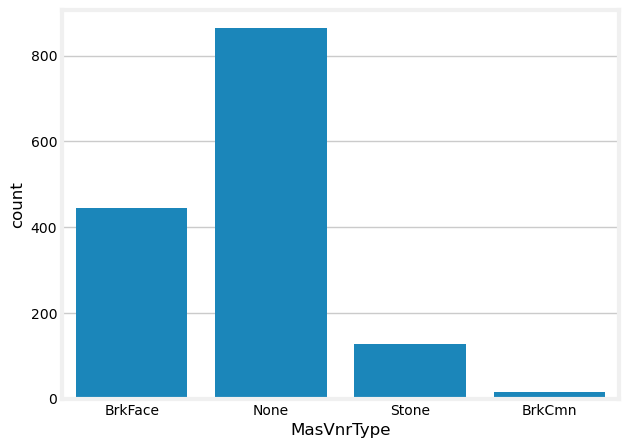

In [454]:
sns.countplot(data=data_train[['MasVnrType']], x='MasVnrType')

And similarly for the test data:

<Axes: xlabel='MasVnrType', ylabel='count'>

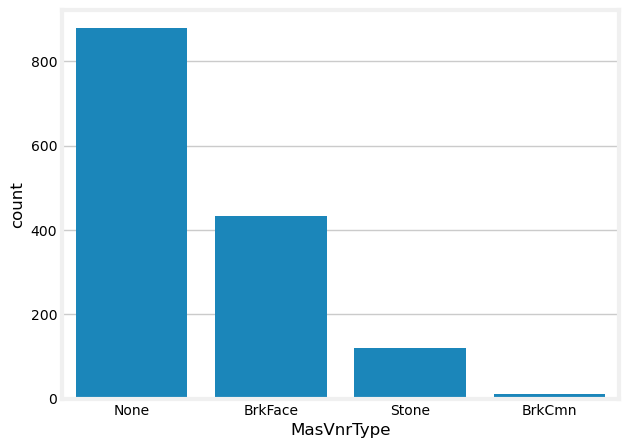

In [455]:
sns.countplot(data=data_test[['MasVnrType']], x='MasVnrType')

And there really is only a mild dependence of the price on the veneer type:

<Axes: xlabel='MasVnrType', ylabel='SalePrice'>

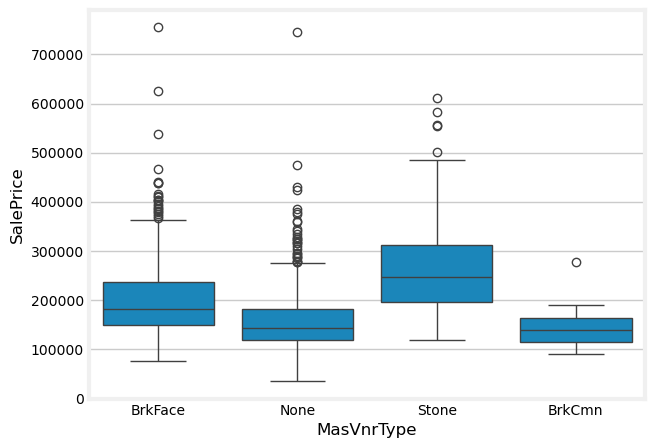

In [456]:
sns.boxplot(data=data_train, x='MasVnrType', y='SalePrice')

Compared, for example, with the quality:

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


<Axes: xlabel='OverallQual', ylabel='SalePrice'>

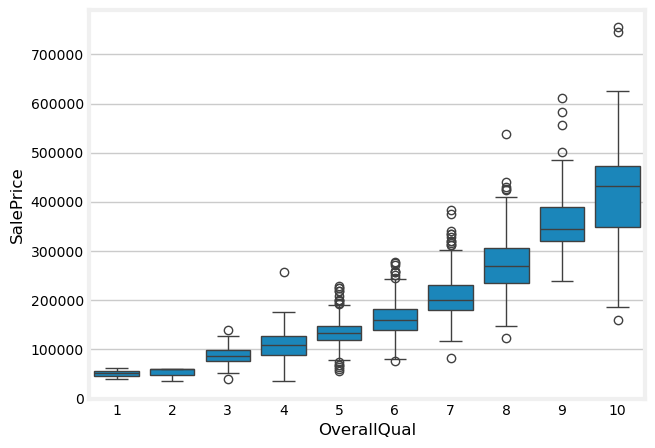

In [457]:
sns.boxplot(data=data_train, x='OverallQual', y='SalePrice')

Because of this **three** things (_i._ the sparsity of the data with NaN entries, _ii._ the dominance by one value, `'None'`, and _iii._ the only very mild dependence of `SalePrice` on `MasVnrType`), our imputation will be a simple mode imputation:

In [458]:
inputted_value = data_train['MasVnrType'].mode()[0]
print(inputted_value)

None


Imputting for `'MasVnrType'`:

In [459]:
data_train['MasVnrType'] = data_train['MasVnrType'].fillna(inputted_value) # for training dataset
data_test['MasVnrType'] = data_test['MasVnrType'].fillna(inputted_value) # for test dataset

Imputting for `'MasVnrArea'`: (by noting that the value of `'MasVnrArea'` when `'MasVnrType'='None'` is 0:

In [460]:
inputted_value = 0 # MasVnrArea when MasVnrType = 'None'

data_train['MasVnrArea'] = data_train['MasVnrArea'].fillna(inputted_value) # for training dataset
data_test['MasVnrArea'] = data_test['MasVnrArea'].fillna(inputted_value) # for test dataset

In [461]:
del mas_vnr_cols, inputted_value

#### `'Bsmt...'`

Defining all features referring to basement:

In [462]:
bsmt_cols = [col for col in data_train.columns if 'Bsmt' in col]

What percentage is missing basement entries?

In [463]:
for bsmt_feat in bsmt_cols:

    # print(bsmt_feat)
    find_description(bsmt_feat)
    
    try:
        print(f"training data missing '{bsmt_feat}': {train_nan_cols.loc[train_nan_cols > 0][bsmt_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][bsmt_feat]/len(data_train) * 100:.4g}%")

        if data_train[bsmt_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[bsmt_feat].unique().tolist()}")

    except:
        print(f"No missing '{bsmt_feat}' data in training.")

    try:
        print(f"\ntest data missing '{bsmt_feat}': {test_nan_cols.loc[test_nan_cols > 0][bsmt_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][bsmt_feat]/len(data_test) * 100:.4g}%")

        if data_test[bsmt_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[bsmt_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{bsmt_feat}' data in test.")

    print("*"*75)

BsmtQual: Evaluates the height of the basement

Ex	Excellent (100+ inches)
Gd	Good (90-99 inches)
TA	Typical (80-89 inches)
Fa	Fair (70-79 inches)
Po	Poor (<70 inches
NA	No Basement

training data missing 'BsmtQual': 37, i.e. 2.534%
unique values of training data: ['Gd', 'TA', 'Ex', nan, 'Fa']

test data missing 'BsmtQual': 44, i.e. 3.016%
unique values of test data: ['TA', 'Gd', 'Ex', 'Fa', nan]
***************************************************************************
BsmtCond: Evaluates the general condition of the basement

Ex	Excellent
Gd	Good
TA	Typical - slight dampness allowed
Fa	Fair - dampness or some cracking or settling
Po	Poor - Severe cracking, settling, or wetness
NA	No Basement

training data missing 'BsmtCond': 37, i.e. 2.534%
unique values of training data: ['TA', 'Gd', nan, 'Fa', 'Po']

test data missing 'BsmtCond': 45, i.e. 3.084%
unique values of test data: ['TA', 'Po', 'Fa', 'Gd', nan]
***************************************************************************
Bs

Only a small fraction! Let us now look at the relevant data in more detail. First, the training data:

In [464]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
332,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,1,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


And now the test data:

In [465]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
27,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
125,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
133,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
269,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
318,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
354,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
387,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
388,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
396,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
397,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


It is evident that for most of these columns (`'BsmtQual'`, `'BsmtCond'`, `'BsmtExposure'`, `'BsmtFinType1'`, `'BsmtFinType2'`) the N/A values correspond to simply not having any basement at all, as can be corroborated by their NaN counts:

In [466]:
data_train[bsmt_cols][data_train[['BsmtQual']].isna().any(axis=1)].isna().sum(axis=0)

BsmtQual        37
BsmtCond        37
BsmtExposure    37
BsmtFinType1    37
BsmtFinSF1       0
BsmtFinType2    37
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
BsmtFullBath     0
BsmtHalfBath     0
dtype: int64

In [467]:
data_train[bsmt_cols][data_train[['BsmtQual']].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
371,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


For the test dataset, there are a couple of NaN in BsmtQual that actually **do** have entries in other columns. These will most likely correspond to a missing record, as opposed to non-existent data!

In [468]:
data_test[bsmt_cols][data_test[['BsmtQual']].isna().any(axis=1)].isna().sum(axis=0)

BsmtQual        44
BsmtCond        42
BsmtExposure    42
BsmtFinType1    42
BsmtFinSF1       1
BsmtFinType2    42
BsmtFinSF2       1
BsmtUnfSF        1
TotalBsmtSF      1
BsmtFullBath     2
BsmtHalfBath     2
dtype: int64

In [469]:
data_test[bsmt_cols][data_test[['BsmtQual']].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
125,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
133,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
269,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
318,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
354,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
387,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
388,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
396,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
397,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
398,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


Thus, we perform a constant imputation:

In [470]:
imputed_value = 'NA'

For the training dataset:

In [471]:
rows_train_nan = data_train['BsmtQual'][data_train['BsmtQual'].isna()].index # indices with NaN values in 'BsmtQual'

In [472]:
data_train[bsmt_cols].iloc[rows_train_nan]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
371,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


In [473]:
data_train['BsmtQual'].iloc[rows_train_nan]

17      NaN
39      NaN
90      NaN
102     NaN
156     NaN
182     NaN
259     NaN
342     NaN
362     NaN
371     NaN
392     NaN
520     NaN
532     NaN
533     NaN
553     NaN
646     NaN
705     NaN
736     NaN
749     NaN
778     NaN
868     NaN
894     NaN
897     NaN
984     NaN
1000    NaN
1011    NaN
1035    NaN
1045    NaN
1048    NaN
1049    NaN
1090    NaN
1179    NaN
1216    NaN
1218    NaN
1232    NaN
1321    NaN
1412    NaN
Name: BsmtQual, dtype: object

In [474]:
data_train.columns.get_loc('BsmtQual')

30

In [475]:
# for the training dataset
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtQual')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtCond')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtExposure')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtFinType1')] = imputed_value
data_train.iloc[rows_train_nan, data_train.columns.get_loc('BsmtFinType2')] = imputed_value

For the test dataset:

In [476]:
rows_test_nan = data_test['BsmtQual'][data_test['BsmtQual'].isna() & data_test['BsmtCond'].isna()].index # indices with NaN in values in 'BsmtQual' AND 'BsmtCond'

In [477]:
data_test[bsmt_cols].iloc[rows_test_nan]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
125,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
133,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
269,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
318,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
354,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
387,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
388,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
396,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
397,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
398,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


In [478]:
# for the test dataset
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtQual')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtCond')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtExposure')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtFinType1')] = imputed_value
data_test.iloc[rows_test_nan, data_test.columns.get_loc('BsmtFinType2')] = imputed_value

This has gotten rid of most of the missing values. The ones left are, in the training data:

In [484]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
332,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,1,0
948,Gd,TA,NaN,Unf,0,Unf,0,936,936,0,0


In the test data:

In [485]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
27,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
580,Gd,NaN,Mn,GLQ,1044.0,Rec,382.0,0.0,1426.0,1.0,0.0
660,NA,NA,NA,NA,NaN,NA,NaN,NaN,NaN,NaN,NaN
725,TA,NaN,No,BLQ,1033.0,Unf,0.0,94.0,1127.0,0.0,1.0
728,NA,NA,NA,NA,0.0,NA,0.0,0.0,0.0,NaN,NaN
757,NaN,Fa,No,Unf,0.0,Unf,0.0,173.0,173.0,0.0,0.0
758,NaN,TA,No,Unf,0.0,Unf,0.0,356.0,356.0,0.0,0.0
888,Gd,TA,NaN,Unf,0.0,Unf,0.0,725.0,725.0,0.0,0.0
1064,TA,NaN,Av,ALQ,755.0,Unf,0.0,240.0,995.0,0.0,0.0


Obviously, some of the remaining NaNs in the test data are there because there is still no basement! This is the case of the `SF` or Bath features. Let us fix that:

In [498]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1) & (data_test['BsmtQual'] == 'NA')]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
660,NA,NA,NA,NA,NaN,NA,NaN,NaN,NaN,NaN,NaN
728,NA,NA,NA,NA,0.0,NA,0.0,0.0,0.0,NaN,NaN


In [505]:
no_bsmt_data_test_idx = data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1) & (data_test['BsmtQual'] == 'NA')].index
no_bsmt_data_test_cols = [data_test.columns.get_loc(col) for col in ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']]

In [507]:
data_test.iloc[no_bsmt_data_test_idx, no_bsmt_data_test_cols]

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
660,NaN,NaN,NaN,NaN,NaN,NaN
728,0.0,0.0,0.0,0.0,NaN,NaN


In [508]:
imputed_value = 0

data_test.iloc[no_bsmt_data_test_idx, no_bsmt_data_test_cols] = imputed_value

Having done that, let us return to what is left of the NaNs:

In [510]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
332,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,1,0
948,Gd,TA,NaN,Unf,0,Unf,0,936,936,0,0


In [511]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
27,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
580,Gd,NaN,Mn,GLQ,1044.0,Rec,382.0,0.0,1426.0,1.0,0.0
725,TA,NaN,No,BLQ,1033.0,Unf,0.0,94.0,1127.0,0.0,1.0
757,NaN,Fa,No,Unf,0.0,Unf,0.0,173.0,173.0,0.0,0.0
758,NaN,TA,No,Unf,0.0,Unf,0.0,356.0,356.0,0.0,0.0
888,Gd,TA,NaN,Unf,0.0,Unf,0.0,725.0,725.0,0.0,0.0
1064,TA,NaN,Av,ALQ,755.0,Unf,0.0,240.0,995.0,0.0,0.0


In order to impute these values, we need to do more work. Let us begin by exploring how much do the different values of the categorical columns impact the `'SalePrice'`, which may tell us whether we should be worried about doing too bad of a job:

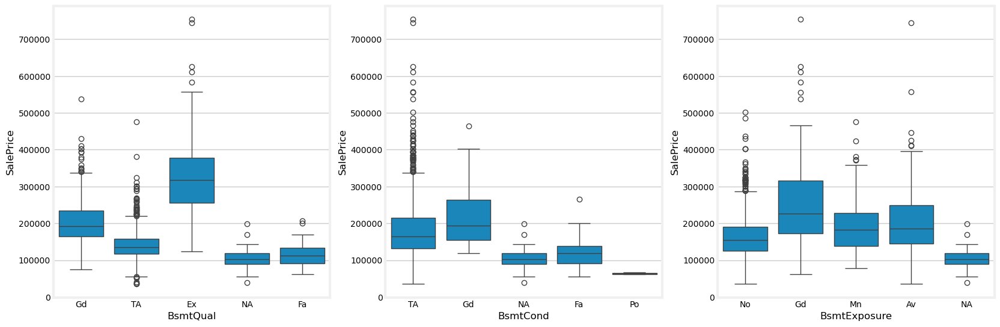

In [591]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

bsmt_cats = ['BsmtQual', 'BsmtCond', 'BsmtExposure']

for i, feat in enumerate(bsmt_cats):
    
    sns.boxplot(data=data_train, x=feat, y='SalePrice', ax=axs[i])
    # sns.boxplot(data=data_test, x=feat, y='SalePrice', ax=axs[1,i])

There isn't a strong correlation, unless `BsmtQual` is `'Ex'`, in which case there is a significant jump in price.

So let's try to do a good job. Perhaps a mode imputation? Let us define a function that, given the values of two of these categorical features, it spits out the mode of the third feature, and optionally plots the distribution:

In [592]:
def bsmt_cat_fn(bsmt_feat1_val1: tuple, bsmt_feat2_val2: tuple, var, plot=False):
    
    feat1, val1 = bsmt_feat1_val1
    feat2, val2 = bsmt_feat2_val2

    data_slice = (data_train[feat1] == val1) & (data_train[feat2] == val2)

    mode = data_train.loc[data_slice][var].mode()[0]

    if plot:
        sns.countplot(data=data_train.loc[data_slice], x=var)

    return mode

So, for the two remaining NaNs in the training data:

In [597]:
data_train[bsmt_cats][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure
332,Gd,TA,No
948,Gd,TA,NaN


'Unf'

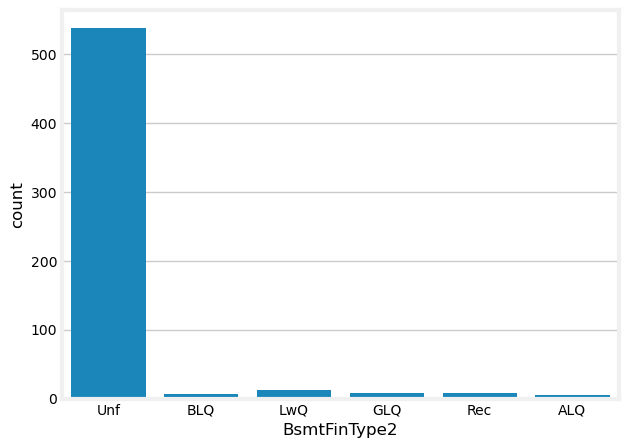

In [593]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtCond', 'TA'), 'BsmtFinType2', plot=True)

'No'

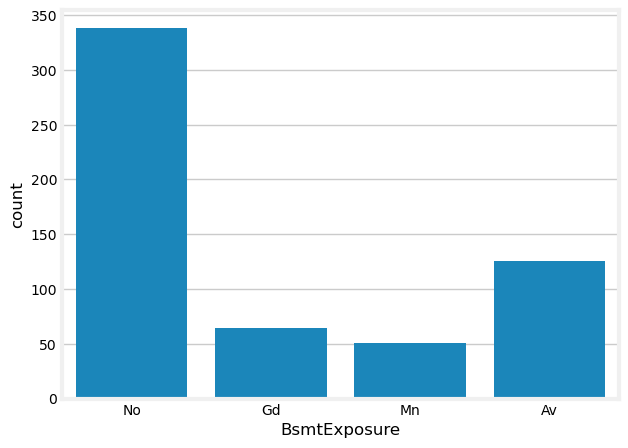

In [594]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtCond', 'TA'), 'BsmtExposure', plot=True)

For the test data:

In [596]:
data_test[bsmt_cats][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure
27,Gd,TA,NaN
580,Gd,NaN,Mn
725,TA,NaN,No
757,NaN,Fa,No
758,NaN,TA,No
888,Gd,TA,NaN
1064,TA,NaN,Av


'No'

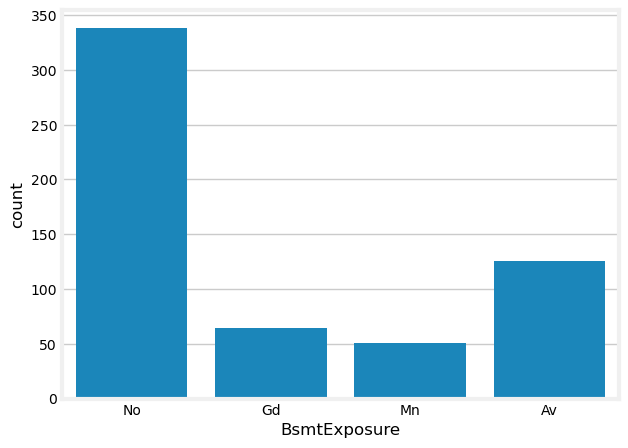

In [599]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtCond', 'TA'), 'BsmtExposure', plot=True)

'TA'

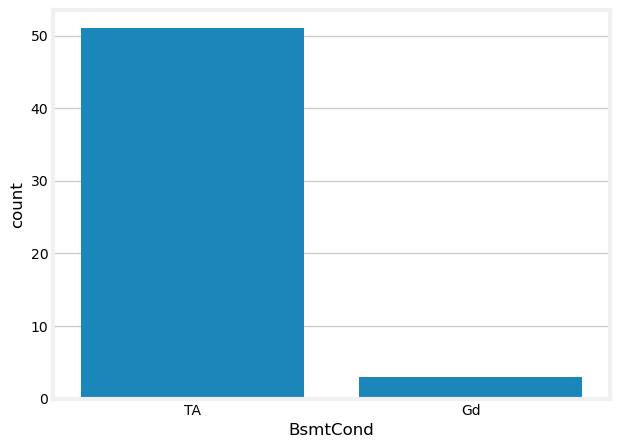

In [600]:
bsmt_cat_fn(('BsmtQual', 'Gd'), ('BsmtExposure', 'Mn'), 'BsmtCond', plot=True)

'TA'

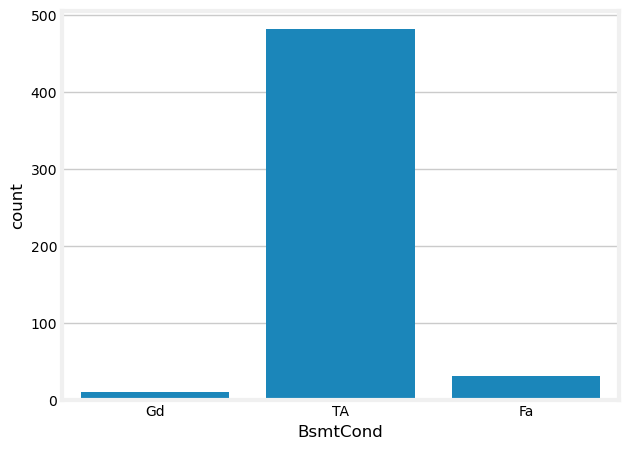

In [601]:
bsmt_cat_fn(('BsmtQual', 'TA'), ('BsmtExposure', 'No'), 'BsmtCond', plot=True)

'TA'

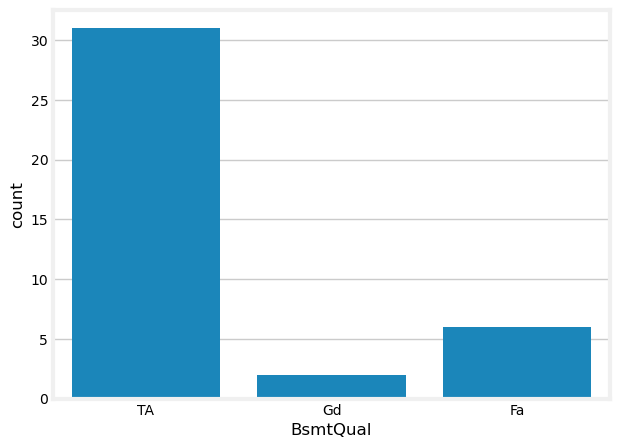

In [602]:
bsmt_cat_fn(('BsmtCond', 'Fa'), ('BsmtExposure', 'No'), 'BsmtQual', plot=True)

'TA'

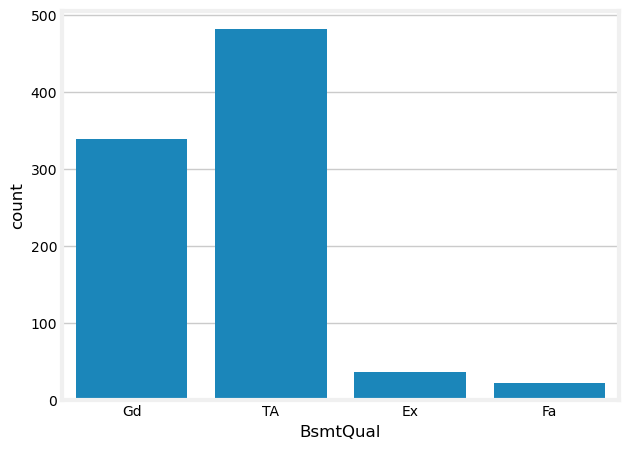

In [603]:
bsmt_cat_fn(('BsmtCond', 'TA'), ('BsmtExposure', 'No'), 'BsmtQual', plot=True)

'TA'

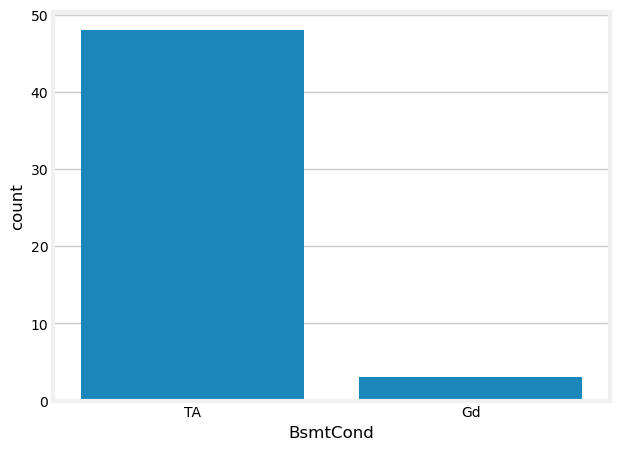

In [604]:
bsmt_cat_fn(('BsmtQual', 'TA'), ('BsmtExposure', 'Av'), 'BsmtCond', plot=True)

In all cases but one there is a clear mode (and even in that, it's not so bad). So let us make this our imputation method.

For the training data:

In [682]:
train_bsmt = data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

for idx in train_bsmt.index:

    bsmt_feats_has_nan = data_train.loc[idx, bsmt_cols].isna()

    for feat_w_nan in bsmt_feats_has_nan[bsmt_feats_has_nan].index:

        imputed_value = bsmt_cat_fn(('BsmtQual', data_train.loc[idx, 'BsmtQual']),
                                    ('BsmtCond', data_train.loc[idx, 'BsmtCond']),
                                    feat_w_nan, plot=False)

        print(feat_w_nan, imputed_value)
        data_train.loc[idx, feat_w_nan] = imputed_value

del train_bsmt, bsmt_feats_has_nan, feat_w_nan, imputed_value

BsmtFinType2 Unf
BsmtExposure No


For the test data:

In [684]:
bsmt_cats = ['BsmtQual', 'BsmtCond', 'BsmtExposure']

test_bsmt = data_test[bsmt_cats][data_test[bsmt_cats].isna().any(axis=1)]

for idx in test_bsmt.index:

    bsmt_feats_has_nan = data_test.loc[idx, bsmt_cats].isna()

    for feat_w_nan in bsmt_feats_has_nan[bsmt_feats_has_nan].index:

        known_feats = list(set(bsmt_cats) - set([feat_w_nan]))

        imputed_value = bsmt_cat_fn((known_feats[0], data_test.loc[idx, known_feats[0]]),
                                    (known_feats[1], data_test.loc[idx, known_feats[1]]),
                                    feat_w_nan, plot=False)

        print(feat_w_nan, imputed_value)
        data_test.loc[idx, feat_w_nan] = imputed_value

del test_bsmt, bsmt_feats_has_nan, feat_w_nan, imputed_value

BsmtExposure No
BsmtCond TA
BsmtCond TA
BsmtQual TA
BsmtQual TA
BsmtExposure No
BsmtCond TA


Let us look at the result:

In [685]:
data_train[bsmt_cols][data_train[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


In [686]:
data_test[bsmt_cols][data_test[bsmt_cols].isna().any(axis=1)]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


We are done!

#### `'Fireplace...'`

Defining all features referring to fireplace:

In [690]:
fire_cols = [col for col in data_train.columns if 'Fire' in col]

What percentage is missing basement entries?

In [694]:
for fire_feat in fire_cols:

    # print(bsmt_feat)
    find_description(fire_feat)
    
    try:
        print(f"training data missing '{fire_feat}': {train_nan_cols.loc[train_nan_cols > 0][fire_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][fire_feat]/len(data_train) * 100:.4g}%")

        if data_train[fire_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[fire_feat].unique().tolist()}")

    except:
        print(f"No missing '{fire_feat}' data in training.")

    try:
        print(f"\ntest data missing '{fire_feat}': {test_nan_cols.loc[test_nan_cols > 0][fire_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][fire_feat]/len(data_test) * 100:.4g}%")

        if data_test[fire_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[fire_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{fire_feat}' data in test.")

    print("*"*75)

Fireplaces: Number of fireplaces

No missing 'Fireplaces' data in training.
No missing 'Fireplaces' data in test.
***************************************************************************
FireplaceQu: Fireplace quality

Ex	Excellent - Exceptional Masonry Fireplace
Gd	Good - Masonry Fireplace in main level
TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
Fa	Fair - Prefabricated Fireplace in basement
Po	Poor - Ben Franklin Stove
NA	No Fireplace

training data missing 'FireplaceQu': 690, i.e. 47.26%
unique values of training data: [nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po']

test data missing 'FireplaceQu': 730, i.e. 50.03%
unique values of test data: [nan, 'TA', 'Gd', 'Po', 'Fa', 'Ex']
***************************************************************************


About 50% of all data is missing values in `'FireplaceQu'`. Let us now look at the relevant data in more detail. First, the training data:

In [702]:
train_slice = data_train[fire_cols][data_train[fire_cols].isna().any(axis=1)]

display(train_slice.head())
display(train_slice.describe())

del train_slice

,Fireplaces,FireplaceQu
0,0,NaN
5,0,NaN
10,0,NaN
12,0,NaN
15,0,NaN


,Fireplaces
count,690.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


And now the test data:

In [703]:
test_slice = data_test[fire_cols][data_test[fire_cols].isna().any(axis=1)]

display(test_slice.head())
display(test_slice.describe())

del test_slice

,Fireplaces,FireplaceQu
0,0,NaN
1,0,NaN
4,0,NaN
6,0,NaN
9,0,NaN


,Fireplaces
count,730.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


It is evident that every time we have a NaN value in `'FireplaceQu'` it is because there is no fireplace! This makes our job easier:

In [713]:
imputed_value = 'NA'

# for the training data
data_train.loc[:,'FireplaceQu'].fillna(imputed_value, inplace=True)

# for the test data
data_test.loc[:,'FireplaceQu'].fillna(imputed_value, inplace=True)

del imputed_value

Done!

In [714]:
data_train[fire_cols][data_train[fire_cols].isna().any(axis=1)]

,Fireplaces,FireplaceQu


In [715]:
data_test[fire_cols][data_test[fire_cols].isna().any(axis=1)]

,Fireplaces,FireplaceQu


#### `'Garage...'`

Defining all features referring to fireplace:

In [716]:
garage_cols = [col for col in data_train.columns if 'arage' in col]

What percentage is missing basement entries?

In [719]:
for garage_feat in garage_cols:

    # print(bsmt_feat)
    find_description(garage_feat)
    
    try:
        print(f"training data missing '{garage_feat}': {train_nan_cols.loc[train_nan_cols > 0][garage_feat]}, i.e. {train_nan_cols.loc[train_nan_cols > 0][garage_feat]/len(data_train) * 100:.4g}%")

        if data_train[garage_feat].dtype == 'object':
            print(f"unique values of training data: {data_train[garage_feat].unique().tolist()}")

    except:
        print(f"No missing '{garage_feat}' data in training.")

    try:
        print(f"\ntest data missing '{garage_feat}': {test_nan_cols.loc[test_nan_cols > 0][garage_feat]}, i.e. {test_nan_cols.loc[test_nan_cols > 0][garage_feat]/len(data_test) * 100:.4g}%")

        if data_test[garage_feat].dtype == 'object':
            print(f"unique values of test data: {data_test[garage_feat].unique().tolist()}")
            
    except:
        print(f"No missing '{garage_feat}' data in test.")

    print("*"*75)

GarageType: Garage location

2Types	More than one type of garage
Attchd	Attached to home
Basment	Basement Garage
BuiltIn	Built-In (Garage part of house - typically has room above garage)
CarPort	Car Port
Detchd	Detached from home
NA	No Garage

training data missing 'GarageType': 81, i.e. 5.548%
unique values of training data: ['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types']

test data missing 'GarageType': 76, i.e. 5.209%
unique values of test data: ['Attchd', 'Detchd', 'BuiltIn', nan, 'Basment', '2Types', 'CarPort']
***************************************************************************
GarageYrBlt: Year garage was built

training data missing 'GarageYrBlt': 81, i.e. 5.548%

test data missing 'GarageYrBlt': 78, i.e. 5.346%
***************************************************************************
GarageFinish: Interior finish of the garage

Fin	Finished
RFn	Rough Finished
Unf	Unfinished
NA	No Garage

training data missing 'GarageFinish': 81, i.e. 5.548%
unique

About 5% of all data is missing values in some kind of `'Garage...'` feature. There are a few rows in the test dataset that miss some garage entries but not others. There are a few garage features with only 1 missing entry. Let us now look at the relevant data in more detail. First, the training data:

In [725]:
train_slice = data_train[garage_cols][data_train[garage_cols].isna().any(axis=1)]

display(train_slice)
display(train_slice.describe(include='all'))

del train_slice

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
39,NaN,NaN,NaN,0,0,NaN,NaN
48,NaN,NaN,NaN,0,0,NaN,NaN
78,NaN,NaN,NaN,0,0,NaN,NaN
88,NaN,NaN,NaN,0,0,NaN,NaN
89,NaN,NaN,NaN,0,0,NaN,NaN
...,...,...,...,...,...,...,...
1349,NaN,NaN,NaN,0,0,NaN,NaN
1407,NaN,NaN,NaN,0,0,NaN,NaN
1449,NaN,NaN,NaN,0,0,NaN,NaN
1450,NaN,NaN,NaN,0,0,NaN,NaN


,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
count,0,0.0,0,81.0,81.0,0,0
unique,0,NaN,0,NaN,NaN,0,0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,0.0,0.0,NaN,NaN
std,NaN,NaN,NaN,0.0,0.0,NaN,NaN
min,NaN,NaN,NaN,0.0,0.0,NaN,NaN
25%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
50%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
75%,NaN,NaN,NaN,0.0,0.0,NaN,NaN


Next, the test data:

In [726]:
test_slice = data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]

display(test_slice)
display(test_slice.describe(include='all'))

del test_slice

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
53,NaN,NaN,NaN,0.0,0.0,NaN,NaN
71,NaN,NaN,NaN,0.0,0.0,NaN,NaN
79,NaN,NaN,NaN,0.0,0.0,NaN,NaN
92,NaN,NaN,NaN,0.0,0.0,NaN,NaN
96,NaN,NaN,NaN,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...
1433,NaN,NaN,NaN,0.0,0.0,NaN,NaN
1449,NaN,NaN,NaN,0.0,0.0,NaN,NaN
1453,NaN,NaN,NaN,0.0,0.0,NaN,NaN
1454,NaN,NaN,NaN,0.0,0.0,NaN,NaN


,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
count,2,0.0,0,77.000000,77.000000,0,0
unique,1,NaN,0,NaN,NaN,0,0
top,Detchd,NaN,NaN,NaN,NaN,NaN,NaN
freq,2,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,0.012987,4.675325,NaN,NaN
std,NaN,NaN,NaN,0.113961,41.025808,NaN,NaN
min,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
25%,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
50%,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
75%,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN


Note that there are some missing values in other columns that do not correspond to a missing garage. Indeed, these are the ones with NaNs in `'GarageType'`:

In [744]:
data_test.loc[data_test['GarageType'][data_test['GarageType'].isna()].index, garage_cols].describe(include='all')

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
count,0,0.0,0,76.0,76.0,0,0
unique,0,NaN,0,NaN,NaN,0,0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,0.0,0.0,NaN,NaN
std,NaN,NaN,NaN,0.0,0.0,NaN,NaN
min,NaN,NaN,NaN,0.0,0.0,NaN,NaN
25%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
50%,NaN,NaN,NaN,0.0,0.0,NaN,NaN
75%,NaN,NaN,NaN,0.0,0.0,NaN,NaN


And these the ones where it is not missing:

In [747]:
test_slice = data_test[garage_cols][data_test[garage_cols].isna().any(axis=1)]

data_test.loc[test_slice['GarageType'][test_slice['GarageType'].isna() == False].index, garage_cols]

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
666,Detchd,NaN,NaN,1.0,360.0,NaN,NaN
1116,Detchd,NaN,NaN,NaN,NaN,NaN,NaN


Given the unique values of `'GarageType'`, we can once again convince ourselves that all its missing values correspond to simply a lack of garage, which makes our imputation easier.

In [ ]:
# for the training data
gt_nan_idx = data_train['GarageType'].isna()
gt_nan_idx = data_train['GarageType'][gt_nan_idx].index

# categorical columns
imputed_value = 'NA'
garage_cat_cols = data_train[garage_cols].select_dtypes(include='object').columns
for col in garage_cat_cols:
    data_train.loc[gt_nan_idx, garage_cat_col].fillna(imputed_value, inplace=True)

# numerical columns
imputed_value = 0.
garage_num_cols = data_train[garage_cols].select_dtypes(exclude='object').columns
for col in garage_num_cols:
    data_train.loc[gt_nan_idx, garage_cat_col].fillna(imputed_value, inplace=True)

del gt_nan_idx, imputed_value, garage_cat_cols, garage_num_cols

In [ ]:
imputed_value = 'NA'

data_train[garage_cols][data_train[garage_cols].isna().any(axis=1)]

imputed_value = 0

del imputed_value

#### `'Pool...'`

#### `'Fence'`

#### `'MiscFeature'`

#### `'LotFrontage'`

#### `'Electrical'`

#### `'Kitchen'`

#### `'MSZoning'`

#### `'Utilities'`

#### `'Exterior1st'`

#### `'Exterior2nd'`

#### `'Functional'`

#### `'SaleType'`

In [142]:
[col for col in raw_train.columns if 'ool' in col]

['PoolArea', 'PoolQC']

In [147]:
raw_train.iloc[0]['PoolArea']

0

In [159]:
raw_train['MasVnrType']

array(['BrkFace', 'None', 'Stone', 'BrkCmn', nan], dtype=object)

In [23]:
data_train[train_nan_cols_names]

,LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,65.0,NaN,BrkFace,196.0,Gd,TA,No,GLQ,Unf,SBrkr,NaN,Attchd,2003.0,RFn,TA,TA,NaN,NaN,NaN
1,80.0,NaN,None,0.0,Gd,TA,Gd,ALQ,Unf,SBrkr,TA,Attchd,1976.0,RFn,TA,TA,NaN,NaN,NaN
2,68.0,NaN,BrkFace,162.0,Gd,TA,Mn,GLQ,Unf,SBrkr,TA,Attchd,2001.0,RFn,TA,TA,NaN,NaN,NaN
3,60.0,NaN,None,0.0,TA,Gd,No,ALQ,Unf,SBrkr,Gd,Detchd,1998.0,Unf,TA,TA,NaN,NaN,NaN
4,84.0,NaN,BrkFace,350.0,Gd,TA,Av,GLQ,Unf,SBrkr,TA,Attchd,2000.0,RFn,TA,TA,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,NaN,None,0.0,Gd,TA,No,Unf,Unf,SBrkr,TA,Attchd,1999.0,RFn,TA,TA,NaN,NaN,NaN
1456,85.0,NaN,Stone,119.0,Gd,TA,No,ALQ,Rec,SBrkr,TA,Attchd,1978.0,Unf,TA,TA,NaN,MnPrv,NaN
1457,66.0,NaN,None,0.0,TA,Gd,No,GLQ,Unf,SBrkr,Gd,Attchd,1941.0,RFn,TA,TA,NaN,GdPrv,Shed
1458,68.0,NaN,None,0.0,TA,TA,Mn,GLQ,Rec,FuseA,NaN,Attchd,1950.0,Unf,TA,TA,NaN,NaN,NaN


In [116]:
raw_train[alley_mask]['Alley'].describe()

count       91
unique       2
top       Grvl
freq        50
Name: Alley, dtype: object

In [119]:
raw_train['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [120]:
raw_train['BsmtCond'].unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

Creating a mask with the rows that have missing data in _any_ of the columns:

In [64]:
raw_train.isna().any(axis=1).sum()

1460

In [59]:
mask = 
print(mask)

0       True
1       True
2       True
3       True
4       True
        ... 
1455    True
1456    True
1457    True
1458    True
1459    True
Length: 1460, dtype: bool


In [14]:
nan_data = raw_data[mask]
print("length:", len(nan_data), ", proportion:", len(nan_data)/len(raw_data))
nan_data

length: 11 , proportion: 0.03197674418604651


,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
8,Adelie,Torgersen,34.1,18.1,193.0,3475.0,NaN
9,Adelie,Torgersen,42.0,20.2,190.0,4250.0,NaN
10,Adelie,Torgersen,37.8,17.1,186.0,3300.0,NaN
11,Adelie,Torgersen,37.8,17.3,180.0,3700.0,NaN
47,Adelie,Dream,37.5,18.9,179.0,2975.0,NaN
246,Gentoo,Biscoe,44.5,14.3,216.0,4100.0,NaN
286,Gentoo,Biscoe,46.2,14.4,214.0,4650.0,NaN
324,Gentoo,Biscoe,47.3,13.8,216.0,4725.0,NaN
336,Gentoo,Biscoe,44.5,15.7,217.0,4875.0,NaN


In [15]:
print(f"% of missing data: {100*len(nan_data)/len(raw_data):.3g}%", )

print("\n")

for species in raw_data['species'].unique():
    ratio = len(nan_data[nan_data['species']==species])/len(raw_data[raw_data['species']==species])
    print("% of rows of species", species, f" missing: {100*ratio:.3g}%")

print("\n")

for island in raw_data['island'].unique():
    ratio = len(nan_data[nan_data['island']==island])/len(raw_data[raw_data['island']==island])
    print("% of rows of island", island, f" missing: {100*ratio:.3g}%")

del ratio

% of missing data: 3.2%


% of rows of species Adelie  missing: 3.95%
% of rows of species Chinstrap  missing: 0%
% of rows of species Gentoo  missing: 4.03%


% of rows of island Torgersen  missing: 9.62%
% of rows of island Biscoe  missing: 2.98%
% of rows of island Dream  missing: 0.806%


**Only 3% of the entire dataset has missing values, and only up to ~4% of instances of species will be lost, so let us drop them. We will lose 10% of the Togersen data, but that's not too much.**

In [16]:
data = raw_data.drop(index=nan_data.index).reset_index(drop=True) # dropping NaN, and resetting index

### Duplicates

Now, we look for duplicates:

In [125]:
data.duplicated().sum(axis=0)

0

In [126]:
data[data.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


**No duplicates!**

### Renaming columns

The data is clean! Are its names too unwieldly?

In [19]:
data.columns

Index(['species', 'island', 'bill_length_mm', 'bill_depth_mm',
       'flipper_length_mm', 'body_mass_g', 'sex'],
      dtype='object')

Nah, they're OK

## 4. Exploratory Data Analysis

In [20]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

from sklearn.feature_selection import mutual_info_classif

from sklearn.model_selection import train_test_split

from sklearn.decomposition import PCA

from sklearn.cluster import KMeans

### Useful Features

In [21]:
useful_features = []

### Original Features

Let us create a report on the dataset

In [22]:
report1 = create_report(data, title='Penguins Dataset')
# report1.show_browser()

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


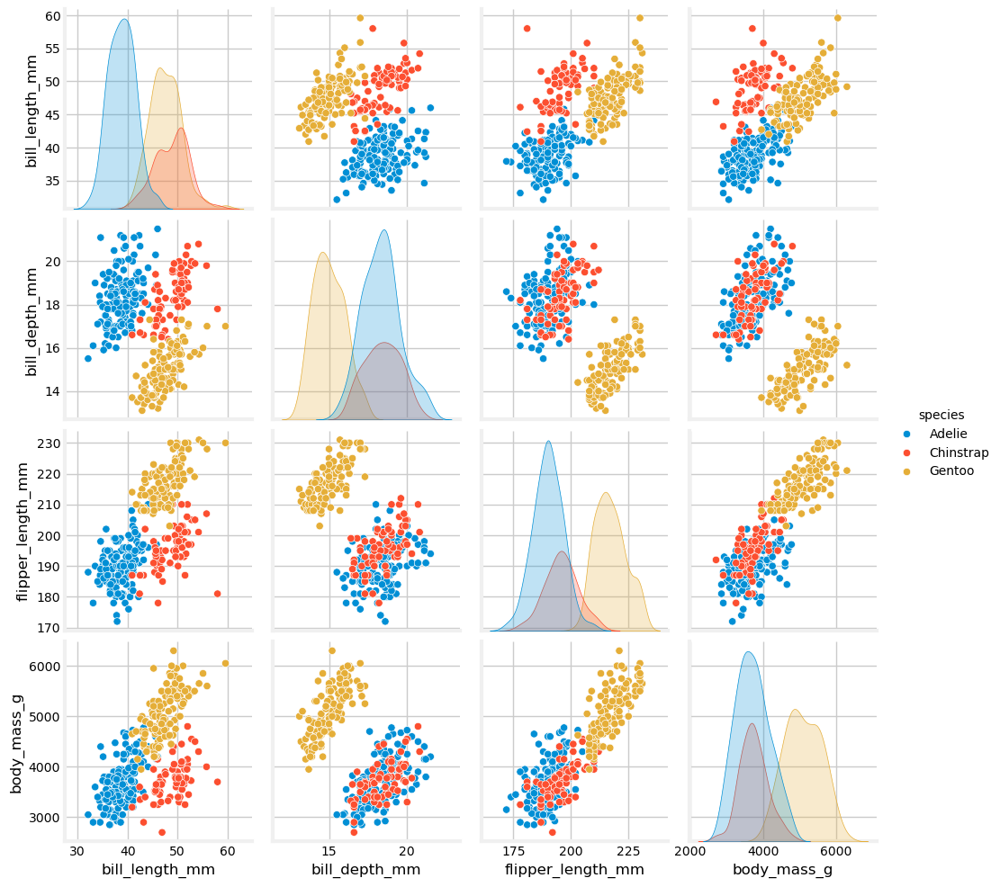

In [23]:
sns.pairplot(data, hue='species')

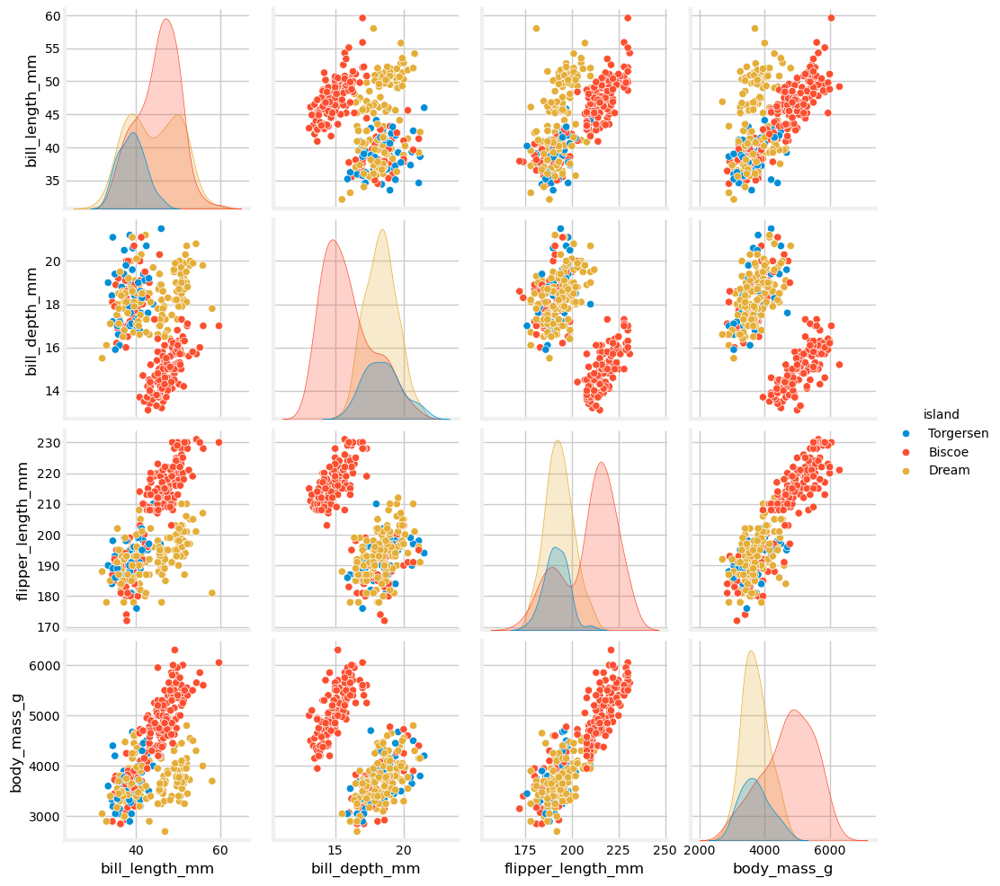

In [24]:
sns.pairplot(data, hue='island')

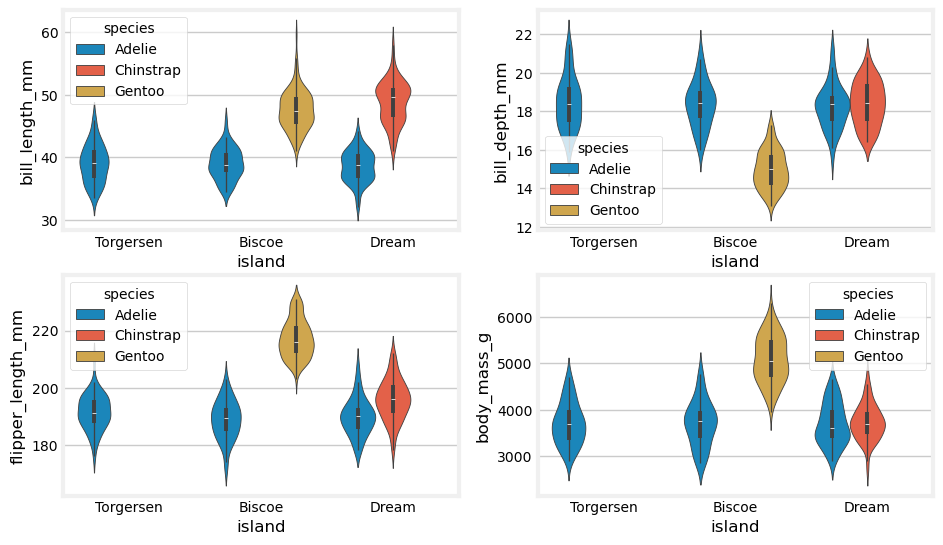

In [25]:
cont_feats = data.select_dtypes(exclude='object').columns # continuous variables
cont_feats = np.array(cont_feats).reshape(2,2)

fig, axs = plt.subplots(2, 2, figsize=(10,6))

for i, ax_row in enumerate(axs):
    for j, ax in enumerate(ax_row):
        
        sns.violinplot(data, x='island', y=cont_feats[i,j], hue='species', ax=ax)
        # sns.swarmplot(data, x='island', y=cont_feats[i,j], hue='species', ax=ax)

Clearly, the island is very important. For example, penguins found in Torgersen island are all of the Adelie species. In addition, penguins in Biscoe island are all either Adelie or Gentoo (which have longer flippers and bills), and those in Dream island are all either Adelie or Chinstrap (the latter having longer bills).

In [26]:
useful_features.append('island')
useful_features = list(set(useful_features))

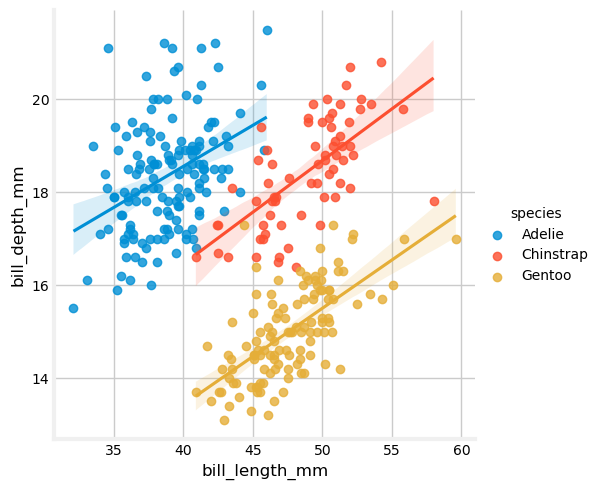

In [27]:
sns.lmplot(data, x='bill_length_mm', y='bill_depth_mm', hue='species')

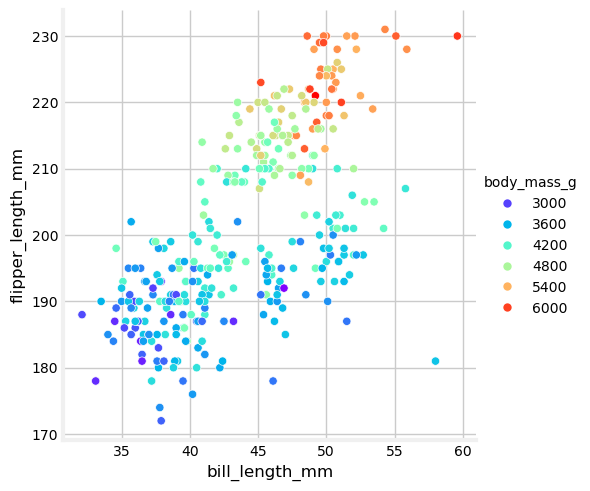

In [30]:
sns.relplot(data, x='bill_length_mm', y='flipper_length_mm', hue='body_mass_g', kind='scatter', palette='rainbow')

### New Features: from Domain Knowledge

It may be useful to consider additional features, such as the bill's profile area, its elongation, and how the penguins' weight relates to the other characteristics.

In [31]:
# function for new features
def new_features(dataset):
    """
    Computes new, possibly useful features for the penguins dataset.
    """

    new_features = {}

    new_features['bill_profile_mm2'] = dataset['bill_length_mm']*dataset['bill_depth_mm']
    new_features['bill_elongation'] = dataset['bill_length_mm']/dataset['bill_depth_mm']
    
    new_features['mobility_mm/g'] = dataset['flipper_length_mm']/dataset['body_mass_g']
    new_features['frame_mmg'] = dataset['flipper_length_mm']*dataset['body_mass_g']
   
    new_features['feedability_mm2/g'] = new_features['bill_profile_mm2']/dataset['body_mass_g']

    new_features['bill_to_flipper_ratio_mm'] = new_features['bill_profile_mm2']/dataset['flipper_length_mm']

    new_features = pd.DataFrame(new_features, index=dataset.index)

    return new_features

In [32]:
engineered_data = data.copy() # making copy

# applying the function
engineered_data = pd.concat([engineered_data, new_features(engineered_data)], axis=1)

In [33]:
engineered_data.columns

Index(['species', 'island', 'bill_length_mm', 'bill_depth_mm',
       'flipper_length_mm', 'body_mass_g', 'sex', 'bill_profile_mm2',
       'bill_elongation', 'mobility_mm/g', 'frame_mmg', 'feedability_mm2/g',
       'bill_to_flipper_ratio_mm'],
      dtype='object')

In [34]:
report2 = create_report(engineered_data, title='Penguins Dataset (new features)')
# report2.show_browser()

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


In [35]:
sns.pairplot?

Signature:
sns.pairplot(
    data,
    *,
    hue=None,
    hue_order=None,
    palette=None,
    vars=None,
    x_vars=None,
    y_vars=None,
    kind='scatter',
    diag_kind='auto',
    markers=None,
    height=2.5,
    aspect=1,
    corner=False,
    dropna=False,
    plot_kws=None,
    diag_kws=None,
    grid_kws=None,
    size=None,
)
Docstring:
Plot pairwise relationships in a dataset.

By default, this function will create a grid of Axes such that each numeric
variable in ``data`` will by shared across the y-axes across a single row and
the x-axes across a single column. The diagonal plots are treated
differently: a univariate distribution plot is drawn to show the marginal
distribution of the data in each column.

It is also possible to show a subset of variables or plot different
variables on the rows and columns.

This is a high-level interface for :class:`PairGrid` that is intended to
make it easy to draw a few common styles. You should use :class:`PairGrid`
directly if you

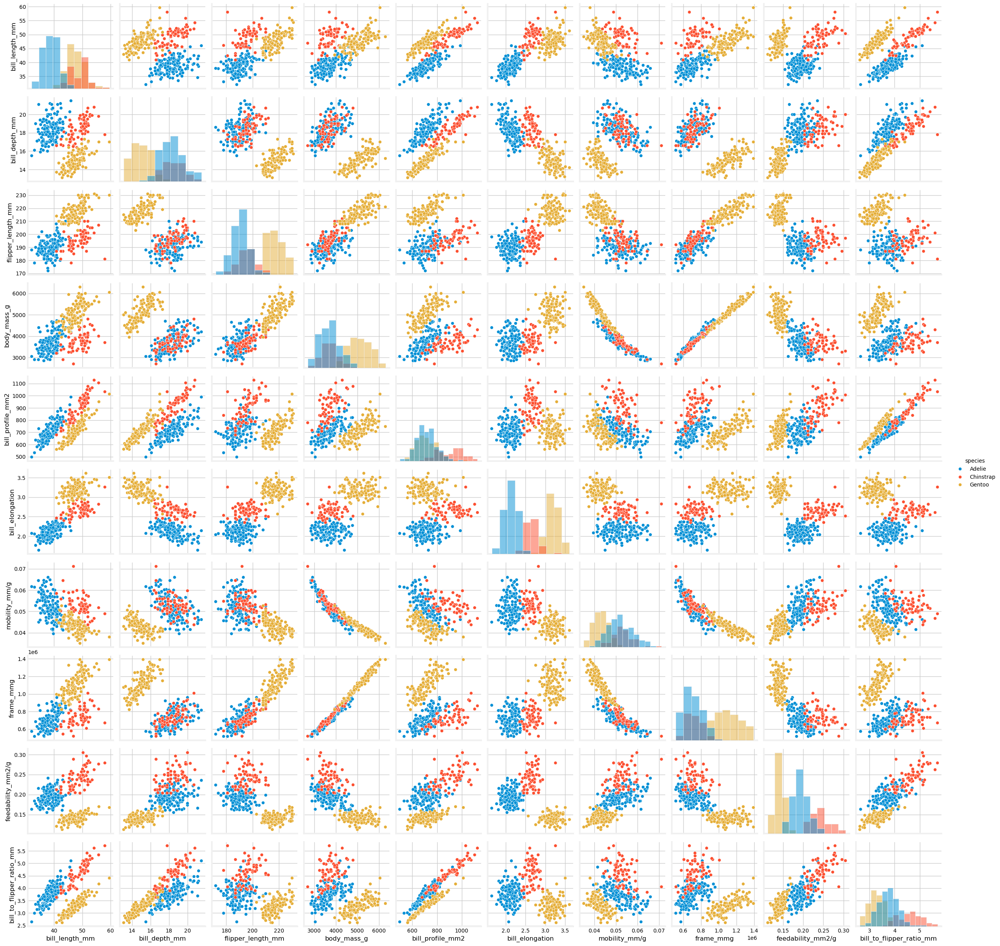

In [36]:
sns.pairplot(engineered_data, diag_kind='hist', hue='species')

Let us compute the MI with the target, and see which of the features appears to be more informative:

In [37]:
data_num = data.select_dtypes(exclude='object')
data_target = data['species']

# data_cat = ohe.transform(data.select_dtypes(include='object').drop(columns=['species']))
# data_target = le.transform(data['species'])

mi_scores = dict(zip(data_num.columns, mutual_info_classif(data_num, data_target, discrete_features=False, random_state=0)))
mi_scores = pd.DataFrame(mi_scores, index=['mi']).T
mi_scores = mi_scores.sort_values('mi', ascending=False)

print(mi_scores)

# print("MI (categorical)",dict(zip(data_cat.columns, mutual_info_classif(data_cat, data_target, discrete_features=True, random_state=0))))

del data_num, data_target, mi_scores

                         mi
flipper_length_mm  0.602667
bill_depth_mm      0.575365
bill_length_mm     0.531241
body_mass_g        0.500639


In [38]:
data_num = engineered_data.select_dtypes(exclude='object')
data_target = engineered_data['species']

# data_cat = ohe.transform(engineered_data.select_dtypes(include='object').drop(columns=['species']))
# data_cat = pd.concat([data_cat, data_cat[subspace]], axis=1)
# data_target = le.transform(engineered_data['species'])

mi_scores = dict(zip(data_num.columns, mutual_info_classif(data_num, data_target, discrete_features=False, random_state=0)))
mi_scores = pd.DataFrame(mi_scores, index=['mi']).T
mi_scores = mi_scores.sort_values('mi', ascending=False)

# adding the most useful features, in terms of MI
useful_features += list(mi_scores.index[:2])
useful_features = list(set(useful_features))

print(mi_scores)
print("\nMost useful features so far:", useful_features)

# print("MI (categorical)",dict(zip(data_cat.columns, mutual_info_classif(data_cat, data_target, discrete_features=True, random_state=0))))

del data_num, data_target#, mi_scores

                                mi
bill_elongation           0.950655
feedability_mm2/g         0.879134
flipper_length_mm         0.616423
bill_depth_mm             0.573452
bill_length_mm            0.548253
frame_mmg                 0.542821
body_mass_g               0.507231
bill_to_flipper_ratio_mm  0.427480
mobility_mm/g             0.358927
bill_profile_mm2          0.262173

Most useful features so far: ['feedability_mm2/g', 'bill_elongation', 'island']


It seems like bill elongation vs. feedability are very informative:

<Axes: xlabel='bill_elongation', ylabel='feedability_mm2/g'>

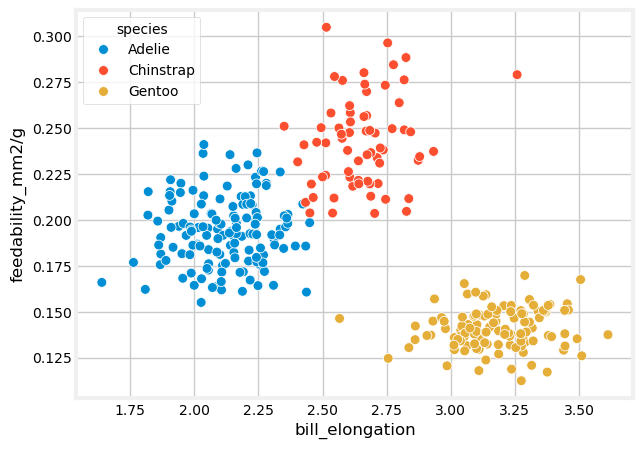

In [39]:
sns.scatterplot(engineered_data, x='bill_elongation', y='feedability_mm2/g', hue='species', s=50)

### New Features: PCA

Perhaps at this point it is useful to perform a PCA, in order to extract as much information from the highest-MI ranking features as possible.

To do this, we now need to split between features and target:

In [42]:
X = engineered_data.drop(columns=['species'])
y = engineered_data['species']

Now we encode the target:

In [43]:
le = LabelEncoder()
y_encoded = le.fit_transform(y)
y_encoded = pd.Series(y_encoded, name='encoded_'+y.name) # turning it into pandas Series 

And split the data into training and validation sets:

In [44]:
X_train, X_val, y_train, y_val = train_test_split(X, y_encoded, test_size=0.25, random_state=1)

Defining the PCA object, and performing the PCA for a given number of high-MI features:

In [45]:
pca = PCA()

In [46]:
mi_feats = 3 # how many high-MI features to keep?

pca_features = mi_scores.index[:mi_feats]

scaled_X_train = X_train[pca_features].select_dtypes(exclude='object').apply(lambda x: (x - x.mean()) / x.std())

scaled_X_train.head()

,bill_elongation,feedability_mm2/g,flipper_length_mm
286,0.967863,-0.856047,1.041931
188,0.114931,2.222487,-0.334048
70,-0.343771,0.064861,-0.678043
173,-0.003843,1.577357,-0.058852
106,-0.725203,0.894212,-0.540445


In [47]:
pca_X_train = pd.DataFrame(pca.fit_transform(scaled_X_train), columns=['pca0', 'pca1', 'pca2'], index=scaled_X_train.index)

pca_X_train.head()

,pca0,pca1,pca2
286,1.659734,0.011638,0.018587
188,-1.303122,1.831036,0.115886
70,-0.654487,-0.266748,-0.287436
173,-0.864837,1.292464,0.270419
106,-1.227588,0.250988,0.218282


Checking the correlation of the scaled features and the PCs:

In [48]:
scaled_X_train.corr().abs()

,bill_elongation,feedability_mm2/g,flipper_length_mm
bill_elongation,1.000000,0.509931,0.824547
feedability_mm2/g,0.509931,1.000000,0.638544
flipper_length_mm,0.824547,0.638544,1.000000


In [49]:
pca_X_train.corr().abs()

,pca0,pca1,pca2
pca0,1.000000e+00,3.030765e-16,1.117691e-15
pca1,3.030765e-16,1.000000e+00,5.012335e-16
pca2,1.117691e-15,5.012335e-16,1.000000e+00


Computing the PC loadings:

In [50]:
loadings = pd.DataFrame(pca.components_.T, columns=pca_X_train.columns, index=scaled_X_train.columns)

loadings

,pca0,pca1,pca2
bill_elongation,0.586461,0.519476,-0.621457
feedability_mm2/g,-0.523803,0.828460,0.198204
flipper_length_mm,0.617814,0.209282,0.757962


Now, computing the explained variance of each PC:

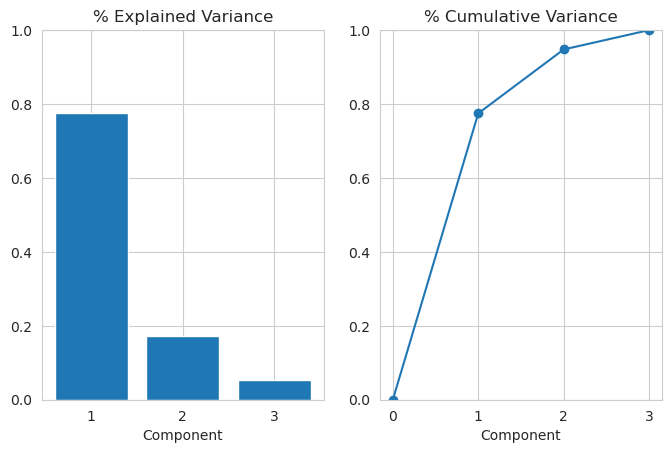

In [51]:
fig, axs = plt.subplots(1, 2)
n = pca.n_components_
grid = np.arange(1, n+1)

evr = pca.explained_variance_ratio_
axs[0].bar(grid, evr)
axs[0].set(xlabel='Component', title='% Explained Variance', ylim=(0., 1.))

cv = np.cumsum(evr)
axs[1].plot(np.r_[0,grid], np.r_[0,cv], "o-")
axs[1].set(xlabel='Component', title='% Cumulative Variance', ylim=(0., 1.))

fig.set(figwidth=8, dpi=100);

<Axes: xlabel='pca0', ylabel='pca1'>

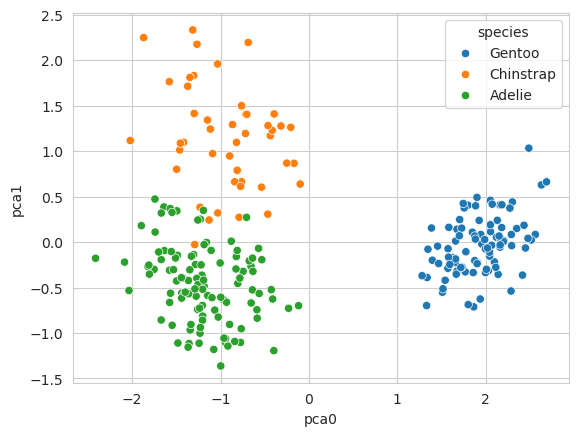

In [52]:
sns.scatterplot(pd.concat([pca_X_train, y], axis=1), x='pca0', y='pca1', hue='species')

Plotting how the PCs are distributed according to sex:

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


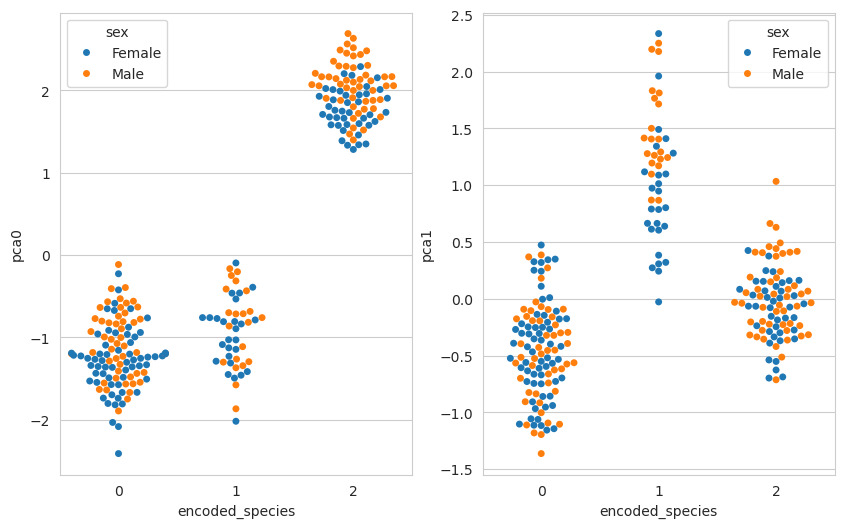

In [53]:
fig, axs = plt.subplots(1, 2, figsize=(10,6))

test = pd.concat([pca_X_train, X_train[['sex']], pd.DataFrame(y_train)], axis=1)

for i, ax in enumerate(axs):
    
    # sns.violinplot(test, x='encoded_species', y=pca_X_train.columns[i], hue='sex', ax=ax)
    sns.swarmplot(test, x='encoded_species', y=pca_X_train.columns[i], hue='sex', ax=ax)
    # sns.swarmplot(engineered_data, x='island', y=cont_feats[i,j], hue='species', ax=ax)

del test

And just species:

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

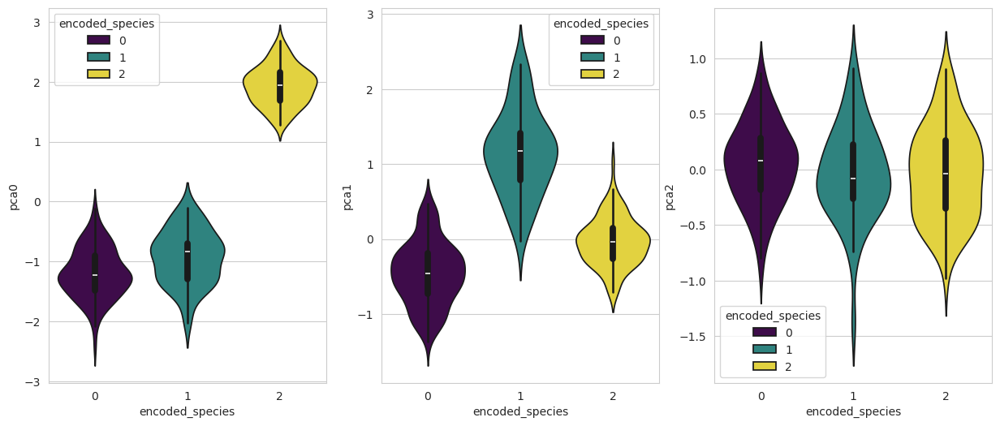

In [54]:
fig, axs = plt.subplots(1, len(pca_X_train.columns), figsize=(15,6))

test = pd.concat([pca_X_train, X_train[['sex']], pd.DataFrame(y_train)], axis=1)

for i, ax in enumerate(axs):
    
    sns.violinplot(test, x='encoded_species', y=pca_X_train.columns[i], hue='encoded_species', ax=ax, palette='viridis')

del test

### New Features: Clusters

Naively, one would think that the `sex` is not really important (it has low MI), but in reality it *is* important when considering its interactions with other features. Indeed, `sex` helps separate Chinstrap from Adelie, in the feedability vs. elongation axis.

<Axes: xlabel='bill_elongation', ylabel='feedability_mm2/g'>

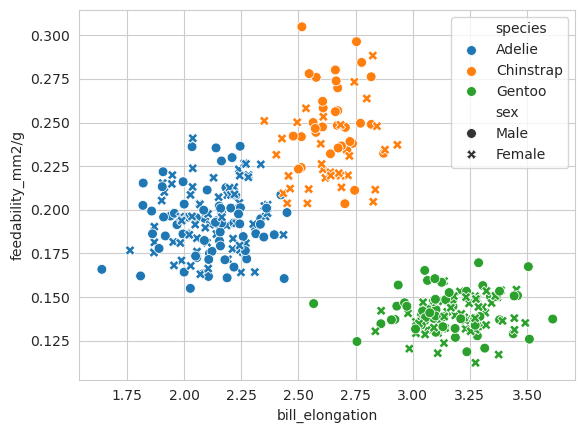

In [55]:
sns.scatterplot(engineered_data, x='bill_elongation', y='feedability_mm2/g', hue='species', style='sex', s=50)

In [56]:
useful_features += ['sex']
useful_features = list(set(useful_features))

In [57]:
useful_features

['island', 'bill_elongation', 'sex', 'feedability_mm2/g']

This begs for a clustering algorithm in order to add a new feature. We begin by one-hot encoding the categotical variables:

In [58]:
ohe = OneHotEncoder(sparse_output=False)
cat_feats = ['island', 'sex']
X_train_ohe = pd.DataFrame(ohe.fit_transform(X_train[cat_feats]), columns=['island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male'], index=X_train.index)

X_train_ohe.head()

,island_Biscoe,island_Dream,island_Torgersen,sex_Female,sex_Male
286,1.0,0.0,0.0,1.0,0.0
188,0.0,1.0,0.0,0.0,1.0
70,0.0,0.0,1.0,1.0,0.0
173,0.0,1.0,0.0,0.0,1.0
106,1.0,0.0,0.0,1.0,0.0


Now, we create the new training data, from which we can construct the clusters:

In [59]:
X_kmeans = pd.concat([X_train_ohe, pca_X_train], axis=1)

X_kmeans.head()

,island_Biscoe,island_Dream,island_Torgersen,sex_Female,sex_Male,pca0,pca1,pca2
286,1.0,0.0,0.0,1.0,0.0,1.659734,0.011638,0.018587
188,0.0,1.0,0.0,0.0,1.0,-1.303122,1.831036,0.115886
70,0.0,0.0,1.0,1.0,0.0,-0.654487,-0.266748,-0.287436
173,0.0,1.0,0.0,0.0,1.0,-0.864837,1.292464,0.270419
106,1.0,0.0,0.0,1.0,0.0,-1.227588,0.250988,0.218282


Now, we define the clustering model, and the new `cluster` feature:

In [60]:
kmeans = KMeans(n_clusters=3, n_init=10, random_state=0)

In [61]:
X_kmeans['cluster'] = kmeans.fit_predict(X_kmeans)

X_kmeans.head()

,island_Biscoe,island_Dream,island_Torgersen,sex_Female,sex_Male,pca0,pca1,pca2,cluster
286,1.0,0.0,0.0,1.0,0.0,1.659734,0.011638,0.018587,0
188,0.0,1.0,0.0,0.0,1.0,-1.303122,1.831036,0.115886,1
70,0.0,0.0,1.0,1.0,0.0,-0.654487,-0.266748,-0.287436,2
173,0.0,1.0,0.0,0.0,1.0,-0.864837,1.292464,0.270419,1
106,1.0,0.0,0.0,1.0,0.0,-1.227588,0.250988,0.218282,2


Creating violin plots for each cluster, and exploring how they are distributed according to species, island, and sex:

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

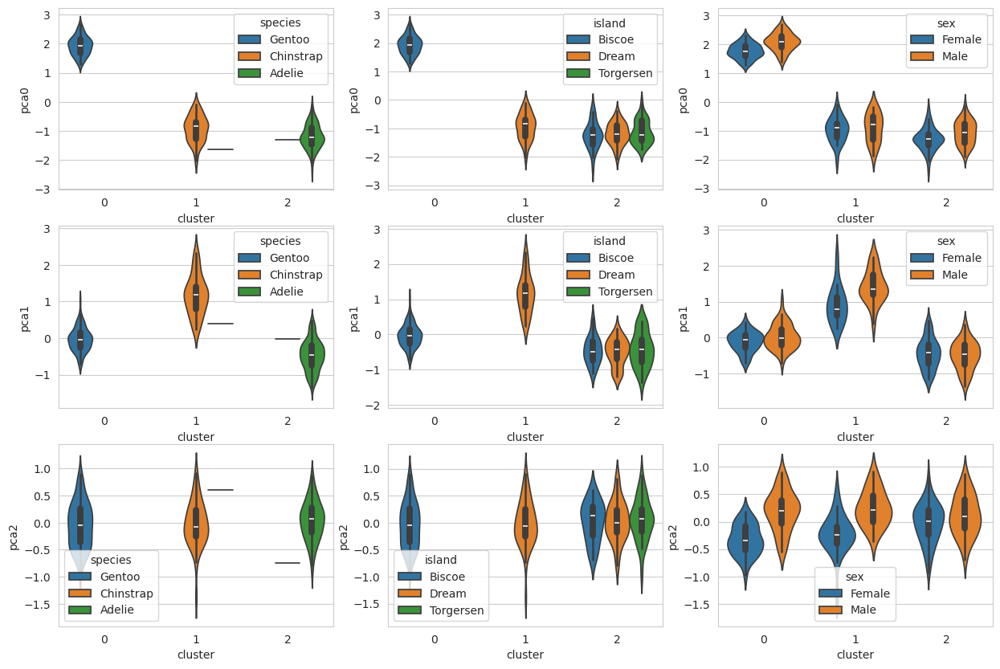

In [62]:
pca_cluster_data = pd.concat([X_train[cat_feats],
                              X_kmeans[pca_X_train.columns],
                              X_kmeans['cluster'],
                              data.iloc[y_train.index]['species']], axis=1)

pca_cluster_data['cluster'] = pca_cluster_data['cluster'].map(int)

fig, axs = plt.subplots(len(pca_X_train.columns), 3, figsize=(15,10))

for i, ypca in enumerate(pca_X_train.columns):
    sns.violinplot(pca_cluster_data, x='cluster', y=ypca, hue='species', ax=axs[i,0])
    sns.violinplot(pca_cluster_data, x='cluster', y=ypca, hue='island', ax=axs[i,1])
    sns.violinplot(pca_cluster_data, x='cluster', y=ypca, hue='sex', ax=axs[i,2])

    # sns.swarmplot(pca_cluster_data, x='cluster', y=ypca, hue='species', ax=axs[i,0])
    # sns.swarmplot(pca_cluster_data, x='cluster', y=ypca, hue='island', ax=axs[i,1])
    # sns.swarmplot(pca_cluster_data, x='cluster', y=ypca, hue='sex', ax=axs[i,2])

<Axes: xlabel='pca0', ylabel='pca1'>

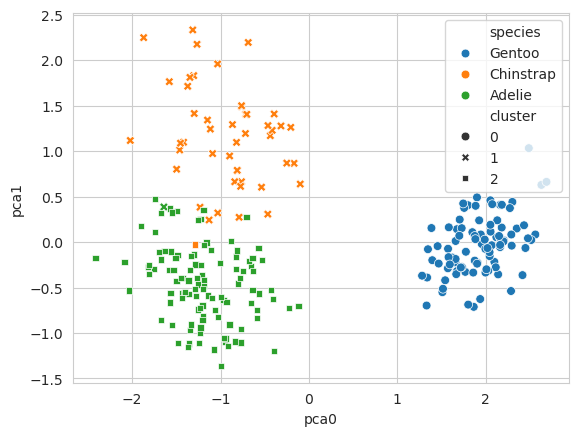

In [63]:
sns.scatterplot(pca_cluster_data, x='pca0', y='pca1', hue='species', style='cluster', s=40)

In [64]:
pca_cluster_data.describe(include='all')

,island,sex,pca0,pca1,pca2,cluster,species
count,249,249,2.490000e+02,2.490000e+02,2.490000e+02,249.000000,249
unique,3,2,NaN,NaN,NaN,NaN,3
top,Biscoe,Female,NaN,NaN,NaN,NaN,Adelie
freq,126,129,NaN,NaN,NaN,NaN,111
mean,NaN,NaN,-1.159269e-17,-1.070094e-17,-8.917454e-18,1.080321,NaN
std,NaN,NaN,1.524493e+00,7.203802e-01,3.961982e-01,0.898910,NaN
min,NaN,NaN,-2.413751e+00,-1.362757e+00,-1.375560e+00,0.000000,NaN
25%,NaN,NaN,-1.258810e+00,-4.551847e-01,-2.874359e-01,0.000000,NaN
50%,NaN,NaN,-7.620039e-01,-1.374415e-01,-5.775751e-03,1.000000,NaN
75%,NaN,NaN,1.745917e+00,3.202576e-01,2.726317e-01,2.000000,NaN


## 5. Preprocessing

### Importing modules

In [65]:
from sklearn.pipeline import Pipeline

from sklearn.base import BaseEstimator, TransformerMixin
# from sklearn.utils.validation import validate_data

from sklearn.compose import ColumnTransformer, make_column_selector

from sklearn.preprocessing import FunctionTransformer, MinMaxScaler, PowerTransformer, StandardScaler

# from sklearn.preprocessing import MinMaxScaler
# from scipy.stats import boxcox
# from sklearn.model_selection import cross_val_score

from sklearn.feature_selection import SelectKBest, RFE, RFECV

### Splitting: Features v. Target

Selecting the features (all columns) and the target:

In [66]:
# features vs. target
X = data.copy()
y = X.pop('species') # target

Unique target values:

In [67]:
classes = np.unique(y) # finding the unique values of the species, sorted
print("sorted out species/classes:", classes)

sorted out species/classes: ['Adelie' 'Chinstrap' 'Gentoo']


### Encoding Target data

We begin by label-encoding the targets:

In [68]:
le = LabelEncoder() # defining label encoder

y_encoded = le.fit_transform(y) # fitting and transforming validation data
y_encoded = pd.Series(y_encoded, name='encoded_'+y.name) # turning it into pandas Series 

Sanity check:

In [69]:
print("Disagreements between original data and its encoding: ", (le.inverse_transform(y_encoded) != y).any())

Disagreements between original data and its encoding:  False


### Splitting: Training vs. Validation

The data is to be split once, and then used in all models.

In [70]:
# training vs. validation
X_train, X_val, y_train, y_val = train_test_split(X, y_encoded, test_size=0.25, random_state=1)

In [71]:
print("X_train.head():\n"+"."*20+"\n", X_train.head())
print("-"*50)
print("y_train.head():\n"+"."*20+"\n", y_train.head())
print("-"*50)
print("y_train.value_counts():\n"+"."*20+"\n", y_train.value_counts())

X_train.head():
....................
         island  bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
286     Biscoe            46.4           15.0              216.0       4700.0   
188      Dream            50.9           19.1              196.0       3550.0   
70   Torgersen            40.9           16.8              191.0       3700.0   
173      Dream            49.5           19.0              200.0       3800.0   
106     Biscoe            39.7           17.7              193.0       3200.0   

        sex  
286  Female  
188    Male  
70   Female  
173    Male  
106  Female  
--------------------------------------------------
y_train.head():
....................
 286    2
188    1
70     0
173    1
106    0
Name: encoded_species, dtype: int64
--------------------------------------------------
y_train.value_counts():
....................
 0    111
2     91
1     47
Name: encoded_species, dtype: int64


Let us now define the numerical and categorical features:

In [72]:
num_cols = X_train.select_dtypes(exclude='object').columns
cat_cols = X_train.select_dtypes(include='object').columns

print("numerical columns:", list(num_cols))
print("categorical columns:", list(cat_cols))

numerical columns: ['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']
categorical columns: ['island', 'sex']


### Preprocessing steps:

#### Feature Engineering

So let us define our Feature Engineering class to include in our future pipeline:

In [73]:
class FeatureEngineer(BaseEstimator, TransformerMixin):
    """
    A scikit-learn compatible transformer that applies a feature engineering function
    to a pandas DataFrame X and returns an expanded DataFrame including new features.
    """
    def __init__(self, func=None):
        """
        Parameters
        ----------
        func : callable
            A function that takes a pandas DataFrame X and returns a pandas DataFrame
            of new features (with the same index as X) or an empty DataFrame.
        """
        self.func = func

    def fit(self, X, y=None):

        # No fitting necessary
        
        return self

    def transform(self, X):
        
        # 1. Check we got a DataFrame
        if not isinstance(X, pd.DataFrame):
            raise ValueError("FeatureAdder.transform input must be a pandas DataFrame")

        if self.func == None:
            X_out = X.copy() # just pass through!

        else:
            # 2. Compute new features
            X_new = self.func(X.copy())

            if not isinstance(X_new, pd.DataFrame):
                raise ValueError("func must return a pandas DataFrame")

            # 3. Ensure no name collisions:
            overlap = set(X.columns).intersection(X_new.columns)
            if overlap:
                # raise ValueError(f"Naming collision between original and new features: {overlap}")
                return X

            # 4. Concatenate side by side
            X_out = pd.concat([X, X_new], axis=1)

        return X_out

#### Selector

Adding so many engineered features, while useful, leads to a much higher dimensionality space, which may be detrimental to a model's performace. In order to avoid this, we must select the most promising features.

We do this with our own selector

In [74]:
class FeatureSelector(BaseEstimator, TransformerMixin):
    """Select features by mutual information with y."""
    
    def __init__(self, n_features=None, random_state=None):
        """
        Parameters
        ----------
        n_features : int, or None
            Maximum number of features to select. If None, selects all features. If 0, selects only the original features.
        random_state : int or None
            For mutual_info_classif sampling reproducibility.
        """

        base_num_feature_names = data.select_dtypes(exclude='object').columns.tolist() # base numeric features
        
        self.n_features = n_features
        self.base_num_feature_names = base_num_feature_names
        self.random_state = random_state
        
    def fit(self, X, y):
        """
        Fit the selector: compute MI scores of the numerical columns, and select n_features.
        
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
        y : array-like, shape (n_samples,)
        """
        X = pd.DataFrame(X, index=X.index)  # ensures column indexing
        self.feature_names_ = X.columns.tolist() # names of all features
        
        X_num = X.select_dtypes(exclude='object') # numerical data only
        self.num_feature_names = X_num.columns.tolist() # names of all numerical features

        X_cat = X.select_dtypes(include='object') # categorical data only
        self.cat_feature_names = X_cat.columns.tolist() # names of all categorical features
        
        # 1. Compute mutual information for each feature
        mi = mutual_info_classif(X_num, y, random_state=self.random_state)
        mi_series = pd.Series(mi, index=self.num_feature_names)
        
        # 2. Sort features by descending MI
        candidates = mi_series.sort_values(ascending=False).index.tolist()

        # 3. Selecting the features:

        selected = []
        selected += self.cat_feature_names # always include the categorical features, which are important for this dataset

        # now adding the numerical features
        if self.n_features == None:
            selected += self.num_feature_names
        elif self.n_features == 0:
            selected += self.base_num_feature_names
        elif self.n_features < 0:
            raise ValueError(f"Argument `n_features` must be >= 0, you passed {self.n_features}.")
        else:
            selected += candidates[:self.n_features]
        
        self.selected_features_ = selected
        return self
    
    def transform(self, X):
        """
        Reduce X to the selected features.
        
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
        """
        X = pd.DataFrame(X, index=X.index)
        return X[self.selected_features_]#.values
    
    def get_support(self):
        """Mask of selected features (boolean array)."""
        mask = [f in self.selected_features_ for f in self.feature_names_]
        return np.array(mask)
    
    def get_feature_names_out(self, input_features=None):
        """Names of the selected features."""
        return np.array(self.selected_features_)


#### Complete Column Transformer

We need to transform the numerical and categorical columns:

- _Numerical Columns:_ Best if we normalize them; we will need `StandardScaler`.
- _Categorical Columns:_ We use a One-Hot Encoder.

We can now put together the numerical and categorical preprocessors:

In [75]:
def column_preprocessor(verbose_feature_names_out=False, remainder='drop'):

    # pipeline for numerical columns
    num_pipe = Pipeline([('scaler', StandardScaler())])
    # selector of numerical columns
    num_col_sel = make_column_selector(dtype_include=np.number)

    # pipeline for categorical columns
    cat_pipe = Pipeline([('ohe', OneHotEncoder(sparse_output=False))])
    # selector of categorical columns
    cat_col_sel = make_column_selector(dtype_exclude=np.number)

    ct = ColumnTransformer(transformers=[('num', num_pipe, num_col_sel),
                                         ('cat', cat_pipe, cat_col_sel)],
                           remainder=remainder,
                           verbose_feature_names_out=verbose_feature_names_out)

    return ct

Important: this is the number of OHE categorical features, will be needed in later in order to ensure that the PCA is not applied to these:

In [76]:
number_of_ohe_cat_feats = X_train.select_dtypes(include='object').describe().loc['unique'].sum(axis=0)
print("no. of categorical features that have been OHE:", number_of_ohe_cat_feats)

no. of categorical features that have been OHE: 5


#### K-means Cluster Feature Creator

First, we create a subclass in charge of creating a `cluster` feature with KMeans. Note that if `n_clusters=0`, then we will not do anything!

In [77]:
class KMeansFeature(TransformerMixin, BaseEstimator):
    
    def __init__(self, n_clusters=None, max_iter=300, n_init=10, random_state=0):
        
        self.n_clusters   = n_clusters
        self.max_iter     = max_iter
        self.n_init       = n_init
        self.random_state = random_state

    def fit(self, X, y=None):

        if self.n_clusters == None:
            pass # override: no need to fit KMeans!
        
        else:
            self.km_ = KMeans(n_clusters=self.n_clusters,
                              random_state=self.random_state
                              ).fit(X)
        return self

    def transform(self, X):

        # 1. Check we got a DataFrame
        if not isinstance(X, pd.DataFrame):
            raise ValueError("FeatureAdder.transform input must be a pandas DataFrame")

        X_out = X.copy() # copying data!

        if self.n_clusters == None:
            pass

        else:
            # column of cluster‐labels (as integers)
            X_clusters = self.km_.predict(X)#.reshape(-1, 1)
            X_out['cluster'] = X_clusters # adding clusters column!
        
        return X_out

To put that in a pipeline, we first need to process the DataFrame (we apply a PCA, then a StandardScaler):

In [78]:
def pre_cluster_preprocessor(verbose_feature_names_out=False,
                             drop_last_no_cols=number_of_ohe_cat_feats, random_state=0):

    # selector of numerical columns
    num_col_sel = make_column_selector(dtype_include=np.number)

    # scaler column transformer
    scaler_ct = ColumnTransformer(transformers=[('scaler',
                                                 StandardScaler(),
                                                 slice(0,-drop_last_no_cols))],
                                  remainder='passthrough',
                                  verbose_feature_names_out=verbose_feature_names_out)

    # PCA column transformer
    pca_ct = ColumnTransformer(transformers=[('pca',
                                              PCA(random_state=random_state),
                                              slice(0,-drop_last_no_cols))],
                               remainder='passthrough',
                               verbose_feature_names_out=verbose_feature_names_out)

    # putting everything into a pipeline:
    pre_pipe = Pipeline([('scaler', scaler_ct),
                         ('pca', pca_ct)])

    return pre_pipe

Then apply the cluster creator:

In [79]:
def cluster_preprocessor(n_clusters=None, max_iter=300, n_init=10, random_state=0):

    # For any value of n_clusters, we pass the KMeans cluster creator, which for n_cluster=None does nothing:
    cluster_step = KMeansFeature(n_clusters=n_clusters,
                                 max_iter=max_iter,
                                 n_init=n_init,
                                 random_state=random_state)

    return cluster_step

And, finally, OHE the clusters:

In [80]:
def post_cluster_preprocessor(verbose_feature_names_out=False):

    # Cluster OHE transformer
    post_cluster_ct = ColumnTransformer(transformers=[('ohe',
                                                       OneHotEncoder(sparse_output=False),
                                                       ['cluster'])],
                                        remainder='passthrough',
                                        verbose_feature_names_out=verbose_feature_names_out)

    post_pipe = Pipeline([('ohe', post_cluster_ct)])

    return post_pipe

#### Final Preprocessing Pipelines

In [81]:
from sklearn.base import clone

Putting together the preprocessing steps into a single pipeline:

In [82]:
raw_pipe = Pipeline(steps=[('feature_engineer', FeatureEngineer(func=None)),
                           ('col_preproc', column_preprocessor(verbose_feature_names_out=False,
                                                               remainder='drop'))])

eng_pipe = Pipeline(steps=[('feature_engineer', FeatureEngineer(func=new_features)),
                           ('selector', FeatureSelector(random_state=0)),
                           ('col_preproc', column_preprocessor(verbose_feature_names_out=False,
                                                               remainder='drop'))])

clus_pipe = Pipeline(steps=[('feature_engineer', FeatureEngineer(func=new_features)),
                            ('selector', FeatureSelector(random_state=0)),
                            ('col_preproc', column_preprocessor(verbose_feature_names_out=False,
                                                                remainder='drop')),
                            ('pre_cluster',
                             pre_cluster_preprocessor(verbose_feature_names_out=False,
                                                                     random_state=0)),
                            ('cluster', cluster_preprocessor(random_state=0, n_clusters=3)),
                            ('post_cluster',
                             post_cluster_preprocessor(verbose_feature_names_out=False))])

final_preproc = {'raw':raw_pipe, 'eng':eng_pipe, 'clus':clus_pipe}

Let us compare pipelines. First, the raw case (still scaled and OHE!):

In [83]:
preproc = clone(final_preproc['raw'])

proc_data = preproc.fit_transform(X_train, y_train)

print(proc_data.head())

del preproc, proc_data

     bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
286        0.471586      -1.093098           1.044030     0.599694   
188        1.284152       1.058741          -0.334721    -0.795289   
70        -0.521551      -0.148388          -0.679408    -0.613335   
173        1.031354       1.006258          -0.058971    -0.492032   
106       -0.738235       0.323967          -0.541533    -1.219849   

     island_Biscoe  island_Dream  island_Torgersen  sex_Female  sex_Male  
286            1.0           0.0               0.0         1.0       0.0  
188            0.0           1.0               0.0         0.0       1.0  
70             0.0           0.0               1.0         1.0       0.0  
173            0.0           1.0               0.0         0.0       1.0  
106            1.0           0.0               0.0         1.0       0.0  


Next, the engineered case, with the most informative features selected:

In [84]:
preproc = clone(final_preproc['eng'])

preproc.set_params(selector__n_features = 2)

proc_data = preproc.fit_transform(X_train, y_train)

print(proc_data.head())

del preproc, proc_data

     bill_elongation  feedability_mm2/g  island_Biscoe  island_Dream  \
286         0.969813          -0.857771            1.0           0.0   
188         0.115163           2.226964            0.0           1.0   
70         -0.344464           0.064991            0.0           0.0   
173        -0.003851           1.580533            0.0           1.0   
106        -0.726663           0.896013            1.0           0.0   

     island_Torgersen  sex_Female  sex_Male  
286               0.0         1.0       0.0  
188               0.0         0.0       1.0  
70                1.0         1.0       0.0  
173               0.0         0.0       1.0  
106               0.0         1.0       0.0  


Finally, the case where PCA is performed and clusters are created:

In [85]:
preproc = clone(final_preproc['clus'])
preproc.set_params(selector__n_features = 3)
preproc.set_params(cluster__n_clusters = 4)

proc_data = preproc.fit_transform(X_train, y_train)

print(proc_data.head())

del preproc, proc_data

     cluster_0  cluster_1  cluster_2  cluster_3      pca0      pca1      pca2  \
286        1.0        0.0        0.0        0.0  1.663077  0.011661  0.018624   
188        0.0        1.0        0.0        0.0 -1.305746  1.834724  0.116119   
70         0.0        0.0        1.0        0.0 -0.655805 -0.267286 -0.288015   
173        0.0        1.0        0.0        0.0 -0.866579  1.295067  0.270964   
106        0.0        0.0        1.0        0.0 -1.230060  0.251494  0.218722   

     island_Biscoe  island_Dream  island_Torgersen  sex_Female  sex_Male  
286            1.0           0.0               0.0         1.0       0.0  
188            0.0           1.0               0.0         0.0       1.0  
70             0.0           0.0               1.0         1.0       0.0  
173            0.0           1.0               0.0         0.0       1.0  
106            1.0           0.0               0.0         1.0       0.0  


## 6. Pipelines

### Importing Modules

In [86]:
# cross-validation
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold

# scoring and evaluation
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# checking if model is fitted
from sklearn.utils.validation import check_is_fitted
from sklearn.exceptions import NotFittedError

# ML explainability
import shap
from sklearn.inspection import permutation_importance, partial_dependence
from scipy.stats import gaussian_kde
from sklearn.tree import plot_tree
from xgboost import plot_tree as xgb_plot_tree

# MODELS
# tree-based
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
# need scaling, or at least it doesn't hurt
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(


### Useful Definitions

We begin by defining a verbosity function:

In [87]:
# verbosity function
def verbosity(verbose, message):
    """
    A function that helps us print a message only when asked.
    """
    if verbose:
        print(message)
    else:
        pass

Now, some important dictionaries that we will fill during model evaluation:

In [88]:
# defining some important dictionaries, whose keys are the models we will study

pipe = {} # dictionary of model pipelines

# for cross-validation (CV):
param_grid = {} # dictionary of model hyperparameter grids

search = {} # dictionary of model CV searches

best_cv = {} # dictionary of model with best CV performance

Finally, the score dataframe which we will fill up:

In [89]:
# Create a score dataframe
scorecard = pd.DataFrame(index = ['Precision Train', 'Precision Validation',
                                  'Recall Train', 'Recall Validation',
                                  'Accuracy Train', 'Accuracy Validation',
                                  'F1 Train', 'F1 Validation'])

### Evaluation

We will do cross-validation, and also perform some basic hyperparameter optimization. For that, we need to define a function that defines the pipeline, evaluates the model with cross-validation, computes the metrics, spits out some plots (_e.g._, the confussion matrix), and allocates results to a dictionary. Must take a model/pipeline for argument, the hyperparameter grid, and the CV arguments and such. Also flags for if we want plots, SHAP, permutation importance, etc.

In [94]:
def model_evaluation(model_name, Xytv, avg='macro', perform_cv_randomized=(False,False), scoring='f1_macro', verbose=False, plots=False, random_state=0, n_jobs=safe_cpus, **kwargs):
    """
    A function that evaluates a given model. Pass the model name and data, it will read out its pipeline (and param grid, if CV; all of them must have been previously defined), and perform the model_name evaluation according to the scoring requested. May also show plots and describe each step it takes, if the flags are set to True.
    """

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # splitting the CV and randomized flags
    perform_cv, randomized = perform_cv_randomized

    # the validation key
    val_key = '_cv' if perform_cv else '_no_cv'

    #-------------------------------------------
    # no cross-validation
    if not perform_cv:
        verbosity(verbose, (":"*70) + f"\nWe will evaluate model={model_name} with standard validation.\n" + ":"*70)

        # checking if model is fitted:
        try:
            check_is_fitted(pipe[model_name+'_no_cv'].steps[-1][-1])
            verbosity(verbose, "\n -> Model is already fitted!")

        # if not, fit:
        except NotFittedError:
            verbosity(verbose, "\n -> Fitting the model")
            pipe[model_name+'_no_cv'].fit(Xt, yt)
            verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        yt_pred = pipe[model_name+'_no_cv'].predict(Xt)
        yv_pred = pipe[model_name+'_no_cv'].predict(Xv)
        
        verbosity(verbose, "......Done!")

    #-------------------------------------------
    # cross-validation
    else:
        verbosity(verbose, f"We will evaluate {model_name} with cross-validation.")

        # RSKF
        verbosity(verbose, "\n -> Creating instance of `RepeatedStratifiedKFold`")

        sig = inspect.signature(RepeatedStratifiedKFold)
        default_rskf_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RepeatedStratifiedKFold
        rskf_kwargs = {k:v for k, v in kwargs.items() if k in default_rskf_kwargs} # picking arguments in kwargs that are meant for RepeatedStratifiedKFold
        rskf = RepeatedStratifiedKFold(random_state=random_state, **rskf_kwargs)
        
        verbosity(verbose, "......Done!")

        # creating the CV search
        verbosity(verbose, " -> Creating the CV search")
        
        # randomized search
        if randomized:
            sig = inspect.signature(RandomizedSearchCV)
            default_cvsearch_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RandomizedSearchCV
            cvsearch_kwargs = {k:v for k, v in kwargs.items() if k in default_cv_search_kwargs} # picking arguments in kwargs that are meant for RandomizedSearchCV

            searcher = RandomizedSearchCV(pipe[model_name],
                                          param_grid=param_grid[model_name],
                                          cv=rskf,
                                          scoring=scoring,
                                          n_jobs=n_jobs,
                                          random_state=random_state,
                                          # error_score="raise",
                                          **cvsearch_kwargs)

        # grid search
        else:
            searcher = GridSearchCV(pipe[model_name],
                                    param_grid=param_grid[model_name],
                                    cv=rskf,
                                    scoring=scoring,
                                    # error_score="raise",
                                    n_jobs=n_jobs)

        verbosity(verbose, "......Done!")

        # checking if model is fitted:
        # first, check that the model_name is in the 'search' dictionary, and that it has attribute "best_estimator_" (which indicates it is fitted)
        if (model_name in search.keys()) and hasattr(search[model_name], "best_estimator_"):
            verbosity(verbose, "\n -> Model is already fitted!")
        else:
            # then it is either not in the 'search' dictionary, or it is but it is not fit:
            search[model_name] = searcher
            verbosity(verbose, "\n -> Fitting the model")
            search[model_name].fit(Xt, yt)
            verbosity(verbose, "......Done!")

        # picking the best from CV
        best_cv[model_name] = {}
        best_cv[model_name]['pipe'] = search[model_name].best_estimator_
        best_cv[model_name]['model'] = best_cv[model_name]['pipe'].named_steps['model']
        best_cv[model_name]['score'] = search[model_name].best_score_
        best_cv[model_name]['params'] = search[model_name].best_params_

        if verbose:
            print(" -> CV Results:")
            print(f"\t\tbest {scoring}: {best_cv[model_name]['score']}")
            print(f"\t\tbest params: {best_cv[model_name]['params']}")
            # print("\n")
            # print("."*100)
            # for score, std, params in zip(search[model_name].cv_results_['mean_test_score'], search[model_name].cv_results_['std_test_score'], search[model_name].cv_results_['params']):
            #     print(f"mean CV {scoring} score: {score:.4f} +- {std:.4e} --> {params}")
            verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        yt_pred = best_cv[model_name]['pipe'].predict(Xt)
        yv_pred = best_cv[model_name]['pipe'].predict(Xv)
        
        verbosity(verbose, "......Done!")


    #-------------------------------------------
    # classification report
    verbosity(verbose, " -> Creating Classification Reports")
    
    cr_train = classification_report(y_true=yt, y_pred=yt_pred, output_dict=True)
    cr_val = classification_report(y_true=yv, y_pred=yv_pred, output_dict=True)
    
    verbosity(verbose, "......Done!")

    # printing classification reports
    if verbose:
        print("\n")
        cr_train2 = pd.DataFrame(cr_train).T
        print("Classification Report: Training\n"+"."*50)
        print(cr_train2.to_markdown())
        print("\n")
        cr_val2 = pd.DataFrame(cr_val).T
        print("Classification Report: Validation\n"+"."*50)
        print(cr_val2.to_markdown())

    #-------------------------------------------
    # computing scores:
    verbosity(verbose, "\n -> Computing Scores")
        
    precision_train = cr_train[avg+' avg']['precision']
    precision_val = cr_val[avg+' avg']['precision']

    recall_train = cr_train[avg+' avg']['recall']
    recall_val = cr_val[avg+' avg']['recall']

    acc_train = accuracy_score(y_true=yt, y_pred=yt_pred)
    acc_val = accuracy_score(y_true=yv, y_pred=yv_pred)

    F1_train = cr_train[avg+' avg']['f1-score']
    F1_val = cr_val[avg+' avg']['f1-score']

    model_score = [precision_train, precision_val, recall_train, recall_val, acc_train, acc_val, F1_train, F1_val]
        
    verbosity(verbose, "......Done!")

    #-------------------------------------------
    # compare more f1's
    if verbose:
        print("\n"+"*"*50 + "\nDetailed Validation F1 scores:")
        print("."*50)
        for species, f1 in zip(classes, f1_score(yv, yv_pred, average=None)):
            print(species+" f1 score:\t", f1) # compute F1 for each class
        print("."*50)
        for method in ['micro', 'macro', 'weighted']:
            print(method+":", f1_score(y_true=yv, y_pred=yv_pred, average=method)) # compute F1 for each different kind of average

    #-------------------------------------------
    if plots:
        # calculate confusion matrix
        cm_train = confusion_matrix(yt, yt_pred)
        cm_val = confusion_matrix(yv, yv_pred)

        fig, ax = plt.subplots(1, 2, figsize=(11,4))

        print("*"*50 + "\nConfusion Matrices:")
        sns.heatmap(cm_train, annot=True, xticklabels=classes, yticklabels=classes, cmap="Reds", fmt='.4g', ax=ax[0])
        ax[0].set_xlabel("Predicted Label")
        ax[0].set_ylabel("True Label")
        ax[0].set_title("Training Confusion Matrix")

        sns.heatmap(cm_val, annot=True, xticklabels=classes, yticklabels=classes, cmap="Greens", fmt='.4g', ax=ax[1])
        ax[1].set_xlabel("Predicted Label")
        ax[1].set_ylabel("True Label")
        ax[1].set_title("Validation Confusion Matrix")

        plt.tight_layout()
        plt.show()

    #-------------------------------------------
    # updating scorecard
    scorecard[model_name+val_key] = model_score

    #-------------------------------------------
    # returning the model's score

    return model_score 

### Explanation

We begin by defining a function that helps us visualize a model, by plotting some useful figures:

In [95]:
def model_visualization(fitted_pipeline, Xytv,
                        feature_names, target_names,
                        selected_features=None, tree_idx=0):
    """
    Visualize various diagnostics for classification models.

    Parameters:
    - model_name: name of the model in question
    - fitted_pipeline: complete pipeline, trained
    - Xytv: training and validation feature and target data arrays (X_train, X_val, y_train, y_val)
    - feature_names: list or Index of feature names
    - target_names: list or Index of target class names
    - selected_features: optional tuple of two feature names for 2D plots
    - tree_idx: index denoting the tree to plot, in tree-based, forest models
    """

    # splitting the pipeline into preprocessing steps and the actual model
    preproc = fitted_pipeline[:-1] # all preprocessing steps
    model = fitted_pipeline[-1] # model

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # processing the features with the fitted pipeline
    Xt = preproc.transform(Xt)
    Xv = preproc.transform(Xv)
    
    # Ensure feature_names and target_names are list
    if isinstance(feature_names, (pd.Index, np.ndarray)):
        feature_names = list(feature_names)
    if isinstance(target_names, (pd.Index, np.ndarray)):
        target_names = list(target_names)

    # finding the numerical names of the first two selected columns/features
    first_feat_idx = Xt.columns.get_loc(selected_features[0])
    second_feat_idx = Xt.columns.get_loc(selected_features[1])

    # Determine which plots apply
    plots = []
    if isinstance(model, DecisionTreeClassifier):
        plots += ['tree', 'pdp']
    elif isinstance(model, RandomForestClassifier):
        plots += ['rf_tree', 'pdp']
    elif isinstance(model, XGBClassifier):
        plots += ['xgb_tree', 'pdp']
    elif isinstance(model, LogisticRegression):
        plots += ['coef_heatmap', 'pdp']
    elif isinstance(model, SVC):
        plots += ['svm_sv', 'pdp']
    elif isinstance(model, KNeighborsClassifier):
        plots += ['knn_dist', 'pdp']
    elif isinstance(model, GaussianNB):
        plots += ['nb_kde', 'pdp']
    elif isinstance(model, MLPClassifier):
        plots += ['mlp_arch', 'pdp']

    # Setup plot grid
    nplots = len(plots)
    ncols = 2
    nrows = int(np.ceil(nplots / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
    axes = axes.flatten()

    # setup palette
    palette = sns.color_palette('hls', n_colors=len(classes))

    # Plot loop
    for ax, ptype in zip(axes, plots):
        if ptype == 'tree':
            # decision tree plot for DT
            plot_tree(model, filled=True, feature_names=feature_names,
                      class_names=target_names, ax=ax)
            ax.set_title('Decision Tree')

        elif ptype == 'rf_tree':
            # decision tree plot for one of the RF trees
            plot_tree(model.estimators_[tree_idx], filled=True,
                      feature_names=feature_names, class_names=target_names,
                      ax=ax)
            ax.set_title('RandomForest First Tree')

        elif ptype == 'xgb_tree':
            # decision tree plot for one of the XGB trees
            xgb_plot_tree(model, num_trees=tree_idx, ax=ax)
            ax.set_title('XGBoost First Tree')

        elif ptype == 'coef_heatmap':
            # Heatmap of the log-regression coefficients
            coef_mat = model.coef_
            sns.heatmap(coef_mat, xticklabels=feature_names, yticklabels=target_names, annot=True, ax=ax)
            ax.set_title('LogReg Coef Heatmap')

        elif ptype == 'svm_sv':

            # concatenating the training data, for easier color identification based on target
            Xyt = pd.concat([Xt, yt], axis=1)

            # scatterplot of training data
            sns.scatterplot(data=Xyt, x=selected_features[0], y=selected_features[1], hue=yt.name, palette=palette, hue_order=list(le.transform(classes)), ax=ax)

            # support vectors (SVs) from SVM model
            sv = model.support_vectors_        

            # selecting the indices of those rows in the training data corresponding to the SVs
            mask = [(Xt==sv[i]).all(axis=1).reindex(Xt.index) for i in range(sv.shape[0])]
            idxs = [Xyt[mask[i]].index[0] for i in range(sv.shape[0])]

            # locating SVs (and their target values) in the training data
            sv_ys = Xyt.loc[idxs]
            # selecting the target names
            sv_ys = sv_ys[[yt.name]]
            # turning SVs arrays into pd.DataFrame
            sv = pd.DataFrame(sv, index=idxs)
            # plugging their target values
            svy = pd.concat([sv, sv_ys], axis=1)
            # defining the SVs' column names
            svy.columns=Xyt.columns
            
            # scatterplot of the SVs, with hues given by their real targets values (given by y_train); superimposed on previous scatterplot
            sns.scatterplot(data=svy, x=selected_features[0], y=selected_features[1], hue=yt.name, palette=palette, hue_order=list(le.transform(classes)), marker='s', s=50, ax=ax)
            ax.set_xlabel(selected_features[0])
            ax.set_ylabel(selected_features[1])
            ax.set_title('SVM Support Vectors')

        elif ptype == 'knn_dist':
            # neighbors of KNN model
            nbrs = NearestNeighbors(n_neighbors=model.n_neighbors).fit(Xt)
            # distances
            dists, _ = nbrs.kneighbors(Xt)
            kth = dists[:, -1]
            # histogram of distances
            sns.histplot(kth, bins=20, ax=ax)
            ax.set_title(f'KNN Distances (k={model.n_neighbors})')
            ax.set_xlabel('Distance to k-th neighbor')

        elif ptype == 'nb_kde':

            # 2D-grid size
            grid_size = 101

            # concatenating X_train and y_train
            Xyt = pd.concat([Xt, yt], axis=1)

            # scatterplot of the training data, with hues given by the training target values
            sns.scatterplot(data=Xyt, x=selected_features[0], y=selected_features[1], hue=yt.name, palette=palette, ax=ax, hue_order=list(le.transform(classes)))

            # Define grid over feature space
            x_min, x_max = Xt[selected_features[0]].min() - 1, Xt[selected_features[0]].max() + 1
            y_min, y_max = Xt[selected_features[1]].min() - 1, Xt[selected_features[1]].max() + 1
            xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_size),
                                 np.linspace(y_min, y_max, grid_size)
                                 )
            grid = np.column_stack([xx.ravel(), yy.ravel()])
    
            # Overlay Gaussian contours per class
            for idx, cls in enumerate(model.classes_):
                mu = np.array([model.theta_[idx, first_feat_idx], model.theta_[idx, second_feat_idx]])
                var = np.array([model.var_[idx, first_feat_idx], model.var_[idx, second_feat_idx]])
                rv = multivariate_normal(mean=mu, cov=var)
                zz = rv.pdf(grid).reshape(grid_size, grid_size)

                # gaussian contours, with the same hues as the scatterplot above
                ax.contour(xx, yy, zz, levels=5, linewidths=1.5,
                            colors=[palette[idx]])
            
            ax.legend(fontsize='small')
            ax.set_title('NB Feature KDE')

        elif ptype == 'mlp_arch':
            # MLP architecture (very simple)
            ax.axis('off')
            arch = [Xt.shape[1]] + list([model.hidden_layer_sizes]) + [len(target_names)]
            txt = '\n'.join(f'Layer {i}: {n} neurons' for i, n in enumerate(arch))
            ax.text(0.1, 0.5, txt, fontsize=12)
            ax.set_title('MLP Architecture')

        elif ptype == 'pdp': # partial dependence plots

            # selecting the feature whose PDP we want to study
            feature_name = selected_features[0] # pick only the most important feature

            # computing partial dependences
            pdp_results = partial_dependence(model, Xv, [feature_name],
                                             feature_names=[feature_name],
                                             kind='average', grid_resolution=100)
            
            # extracting the data from the above results
            grid_values   = pdp_results['grid_values'][0] # pick 1D array of feature values
            averages = pdp_results['average'] # shape = (n_classes, len(grid))

            # for each class, we compute the PDP curves
            for i, class_idx in enumerate(list(le.transform(classes))):

                class_name = le.inverse_transform(np.array([class_idx]))[0]

                # PDP curve
                ax.plot(grid_values, averages[i], label=str(class_idx)+ f" ({class_name})", color=palette[i])

            ax.legend(title='Target class')
            ax.set_title(f'PDP of "{feature_name}" for each class')
            ax.set_xlabel(feature_name)
            ax.set_ylabel('Partial dependence')

    # Remove unused axes
    for j in range(len(plots), len(axes)):
        axes[j].axis('off')

    fig.tight_layout()
    plt.show()

Now, defining a function to explain the model

In [96]:
def explain_model(model_name, fitted_pipeline, Xytv, selected_features=None, tree_idx=0, random_state=0):
    """
    A function that performs ML explainability on a given model.
    - model_name: name of the model in question
    - fitted_pipeline: complete pipeline, trained
    - Xytv: training and validation feature and target data arrays (X_train, X_val, y_train, y_val)
    - selected_features: optional tuple of two feature names for 2D plots
    - tree_idx: index denoting the tree to plot, in tree-based, forest models
    """

    # splitting the pipeline into preprocessing steps and the actual model
    preproc = fitted_pipeline[:-1] # preprocessing
    model = fitted_pipeline[-1] # model

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # processing the features with the fitted pipeline
    Xt_processed = preproc.transform(Xt)
    # Xt = Xt_processed
    Xv_processed = preproc.transform(Xv)

    # Permutation Importance
    print("*"*100 + "\nPerforming Permutation Importance:\n" + "."*50)

    # computing importances
    perm_import = permutation_importance(model, Xv_processed, yv, random_state=random_state)

    # zipping feature names and the means and stds of the importances
    feat_import = zip(Xv_processed.columns, perm_import['importances_mean'], perm_import['importances_std'])

    # sorting from highest to lowest means
    feat_import = sorted(feat_import, key=itemgetter(1), reverse=True)

    # printing
    print("The model's features are:\n")
    print([feat for feat, _, _ in feat_import])
    print("The most important features are:\n")
    for feat, mean, std in feat_import:
        print("\t"+feat+":", mean, "+-", std)
    print("\n" + ("*"*100) + "\n")

    # preparing for the explanatory plots
    # selecting the two most important features
    important_features = [column for column, importance, _ in feat_import][:2]

    # the featuresto plot: if selected_features == None pick the two most important ones
    feats_to_plot = important_features if selected_features == None else selected_features

    # plots from model_visualization function
    model_visualization(fitted_pipeline, Xytv,
                        Xv_processed.columns, classes,
                        selected_features=feats_to_plot, tree_idx=tree_idx)
    

    # SHAP
    tree_model = any([isinstance(model, DecisionTreeClassifier), isinstance(model, RandomForestClassifier), isinstance(model, XGBClassifier)])
    
    if tree_model:
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(Xv_processed)
    elif 'logreg' in model_name:
        smaller_Xt = shap.sample(Xt_processed, 50)
        explainer = shap.LinearExplainer(model, smaller_Xt)
        shap_values = explainer.shap_values(Xv_processed)
    elif any([('svc' in model_name), ('knn' in model_name)]):
        smaller_Xt = shap.sample(Xt_processed, 50)
        explainer = shap.KernelExplainer(model.predict_proba, smaller_Xt, link='logit')
        shap_values = explainer.shap_values(Xv_processed)
    elif 'mlp' in model_name:
        smaller_Xt = shap.sample(Xt_processed, 50)
        # explainer = shap.DeepExplainer(model, smaller_Xt)
        explainer = shap.KernelExplainer(model.predict_proba, smaller_Xt, link='logit')
        shap_values = explainer.shap_values(Xv_processed)
    else:
        pass

    # for a GaussianNB() model, we cannot compute the SHAP values, and thus we cannot make the corresponding plots
    if 'gnb' not in model_name:

        for i in range(len(classes)):
            plt.figure()
            shap.summary_plot(shap_values[:,:,i], Xv_processed, show=False)
            plt.title('Class: '+f'{le.transform([classes[i]])[0]} ('+classes[i]+')')
            plt.tight_layout()
            plt.show()

    pass

## 7. Models

### Model 0: Baseline (`RandomForestClassifier`)

In [97]:
model = 'rfc'

model_name = model+'_base' # full model name

preproc_pipe = clone(final_preproc['raw'])

pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                            ('model', RandomForestClassifier(random_state=0))])

***************************************************************************
rfc_base 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfc_base with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |  

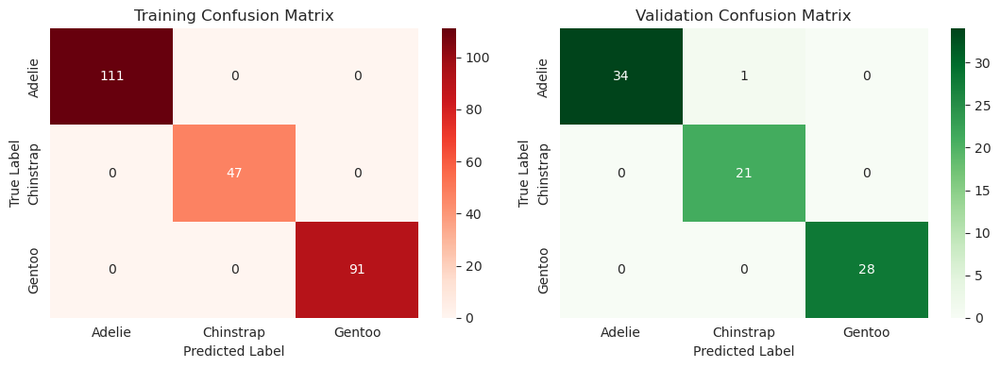

[1.0,
 0.9848484848484849,
 1.0,
 0.9904761904761905,
 1.0,
 0.9880952380952381,
 1.0,
 0.9874171441411077]

In [98]:
print("*"*75)
print(model_name, "\n")
print("*"*75)

model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                 perform_cv_randomized=(False, False),
                 verbose=True, plots=True)

In [99]:
scorecard

,rfc_base_no_cv
Precision Train,1.000000
Precision Validation,0.984848
Recall Train,1.000000
Recall Validation,0.990476
Accuracy Train,1.000000
Accuracy Validation,0.988095
F1 Train,1.000000
F1 Validation,0.987417


### Model 1: `DecisionTreeClassifier`

Defining the pipelines and hyperparameter grids:

In [100]:
model = 'dtc'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', DecisionTreeClassifier(random_state=0))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                                ('model', DecisionTreeClassifier(random_state=0))])

    # defining the hyperparameter grid
    param_grid[model_name] = {'model__max_leaf_nodes': list(range(2, 11))+[None],
                              'model__max_depth': list(range(1,11))+[None]}
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

Performing the evaluation and explanation of the model:

***************************************************************************
dtc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |     

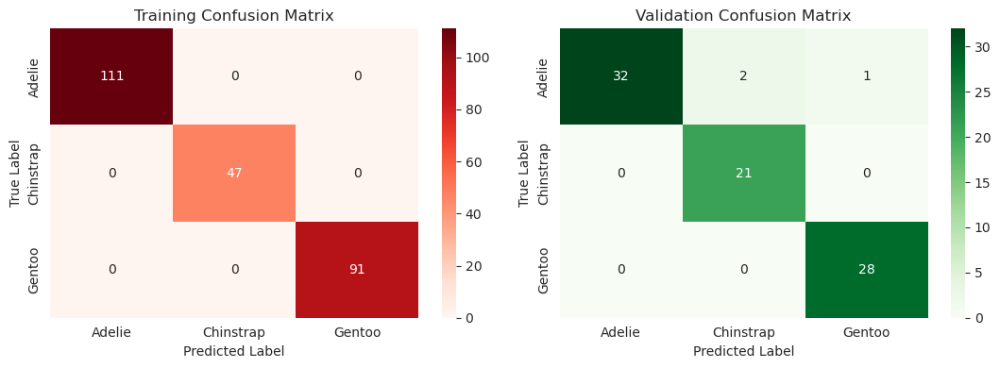






***************************************************************************
dtc_raw , 	CV: True 

***************************************************************************
We will evaluate dtc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9650174970669446
		best params: {'model__max_depth': 4, 'model__max_leaf_nodes': 8}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.982301 | 1        |   0.991071 | 111        |
| 1            |    1        | 0.957447 |   0.978261 |  47        |
| 2            |    1        | 1        |   1        |  91      

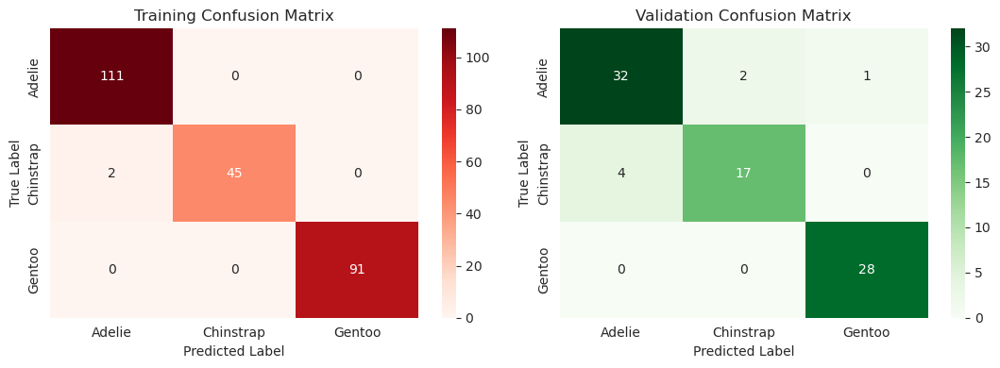



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['island_Dream', 'flipper_length_mm', 'bill_length_mm', 'body_mass_g', 'sex_Female', 'bill_depth_mm', 'island_Biscoe', 'island_Torgersen', 'sex_Male']
The most important features are:

	island_Dream: 0.2595238095238095 +- 0.024281045302822796
	flipper_length_mm: 0.18095238095238092 +- 0.055532875189002844
	bill_length_mm: 0.1738095238095238 +- 0.022080044036894536
	body_mass_g: 0.04999999999999993 +- 0.024281045302822796
	sex_Female: 0.01666666666666663 +- 0.012140522651411386
	bill_depth_mm: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



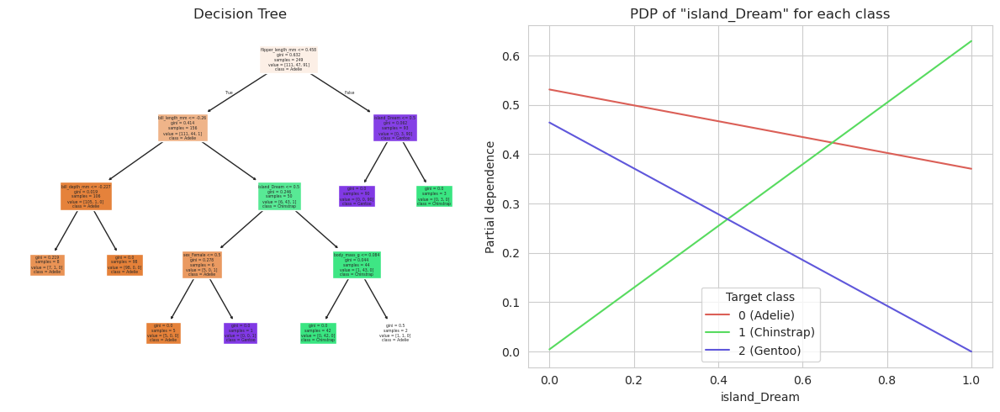

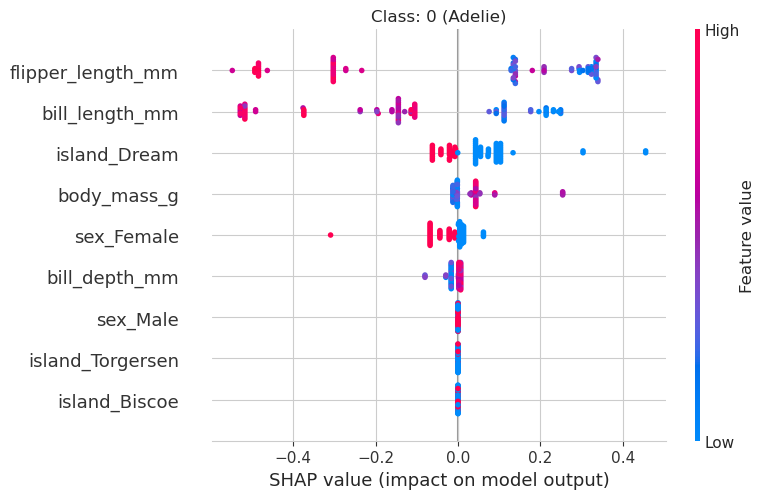

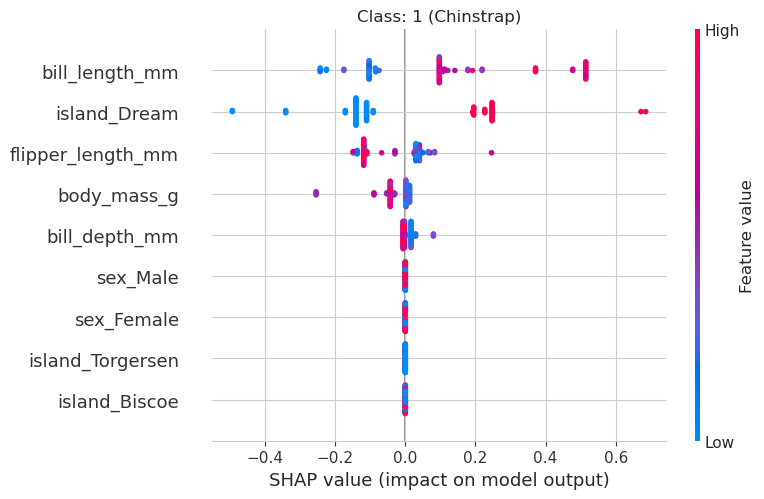

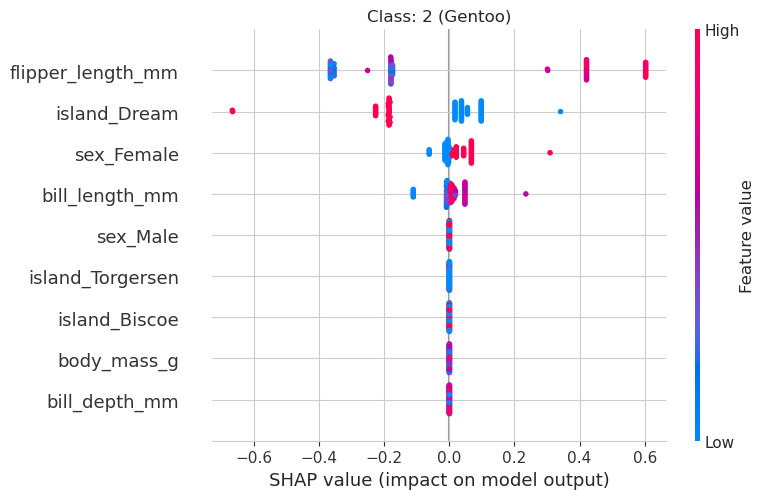




***************************************************************************
dtc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |  

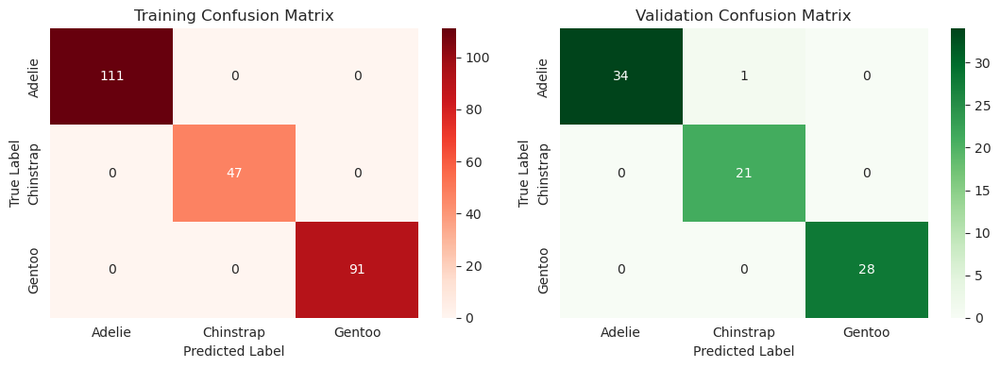






***************************************************************************
dtc_eng , 	CV: True 

***************************************************************************
We will evaluate dtc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9765748385850463
		best params: {'model__max_depth': 3, 'model__max_leaf_nodes': 5, 'preprocessor__selector__n_features': None}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |        

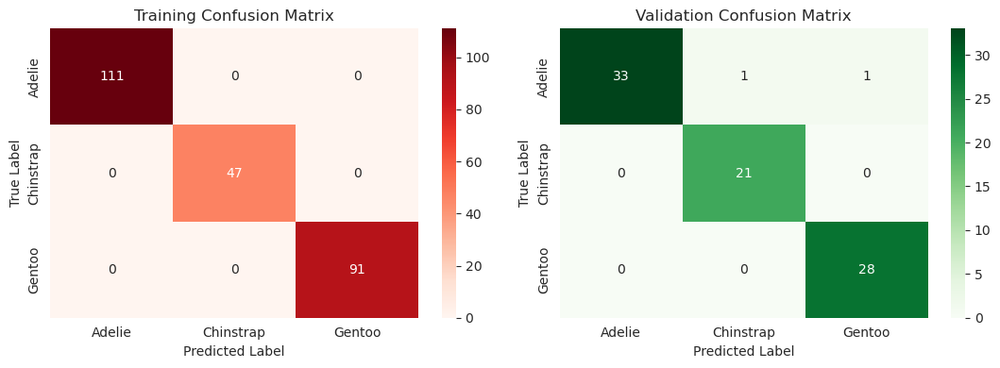



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'island_Dream', 'bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g', 'bill_profile_mm2', 'mobility_mm/g', 'frame_mmg', 'bill_to_flipper_ratio_mm', 'island_Biscoe', 'island_Torgersen', 'sex_Female', 'sex_Male', 'feedability_mm2/g']
The most important features are:

	bill_elongation: 0.38809523809523805 +- 0.059571409539032415
	island_Dream: 0.28809523809523807 +- 0.0230841897972206
	bill_length_mm: 0.026190476190476163 +- 0.013883218797250713
	bill_depth_mm: 0.0 +- 0.0
	flipper_length_mm: 0.0 +- 0.0
	body_mass_g: 0.0 +- 0.0
	bill_profile_mm2: 0.0 +- 0.0
	mobility_mm/g: 0.0 +- 0.0
	frame_mmg: 0.0 +- 0.0
	bill_to_flipper_ratio_mm: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 

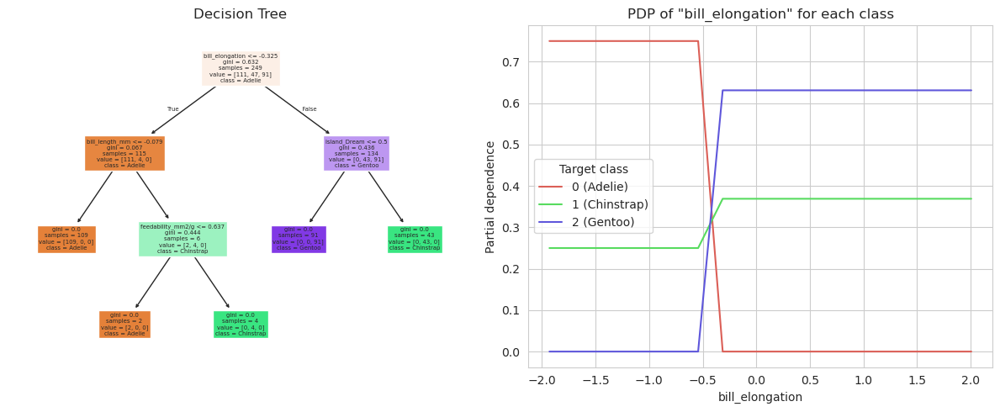

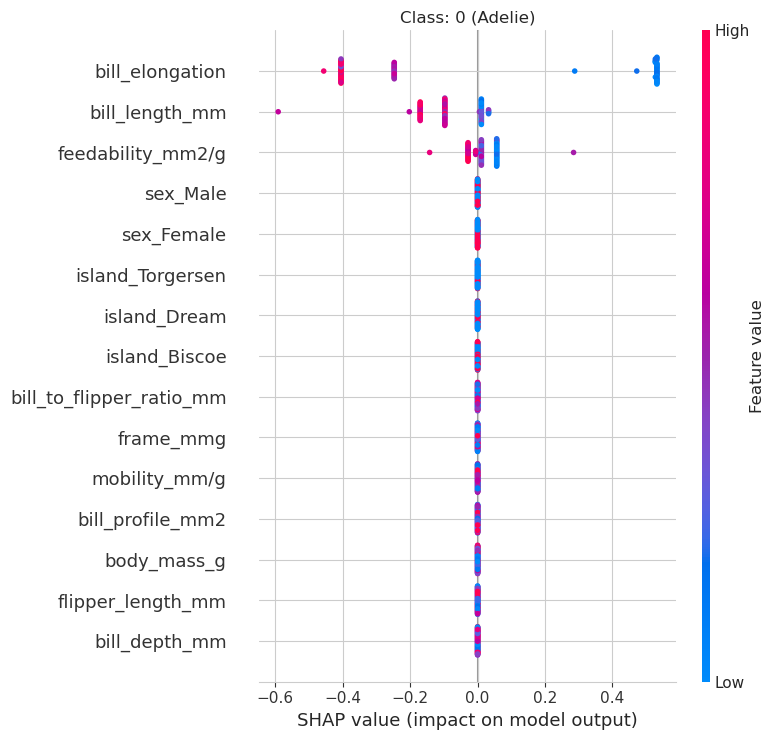

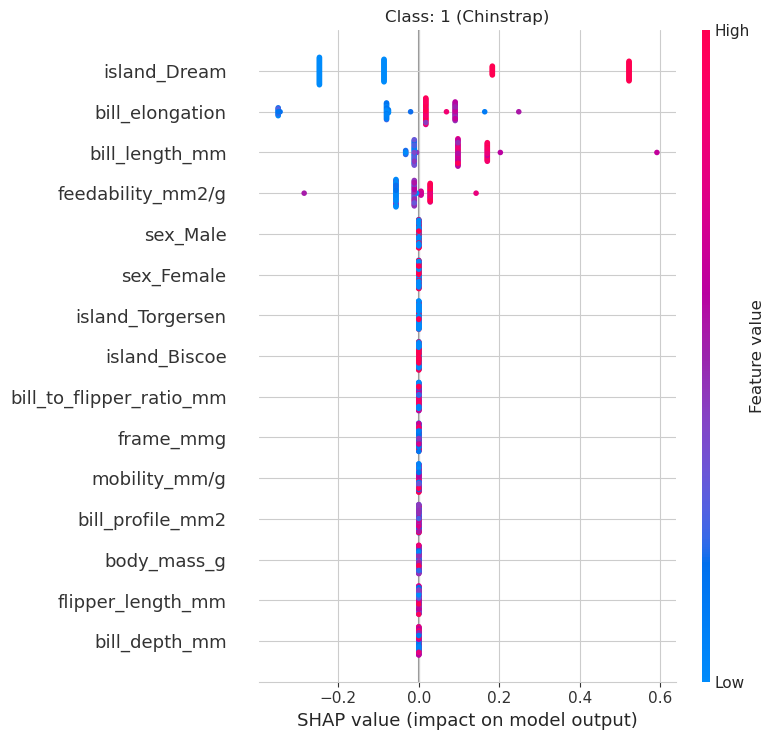

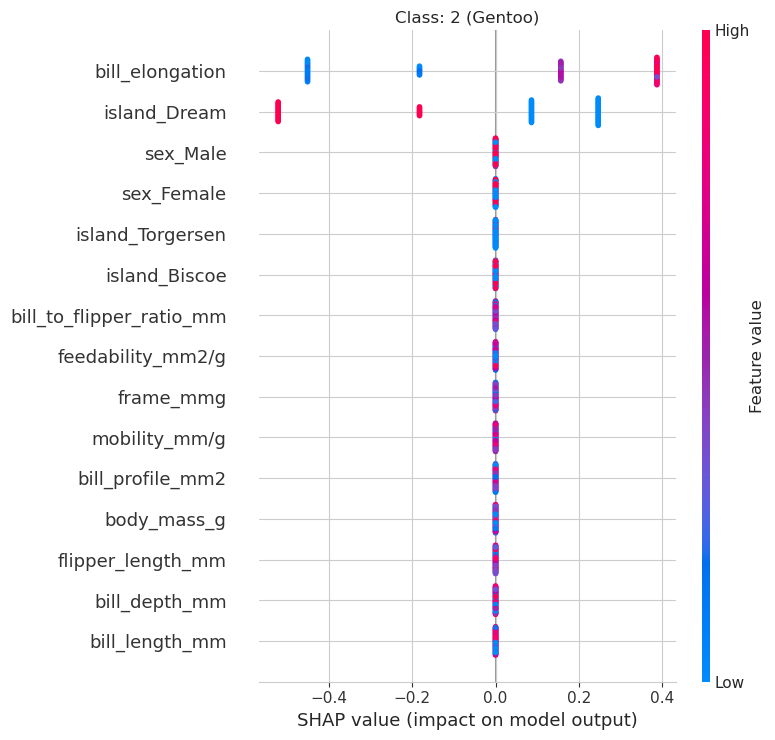




***************************************************************************
dtc_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtc_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |

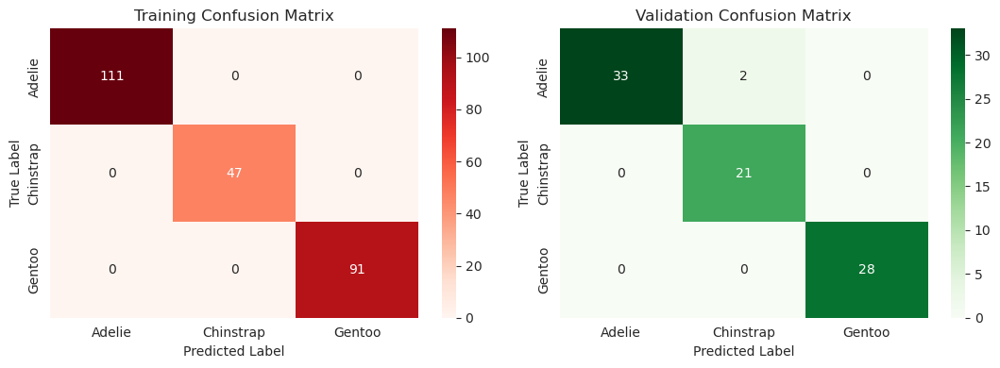






***************************************************************************
dtc_clus , 	CV: True 

***************************************************************************
We will evaluate dtc_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9808523826803731
		best params: {'model__max_depth': 2, 'model__max_leaf_nodes': 3, 'preprocessor__cluster__n_clusters': 4, 'preprocessor__selector__n_features': 3}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.990991 | 0.990991 |   0.990991 | 111        |
| 1            |    0.978723 | 0.978723 |   0.978

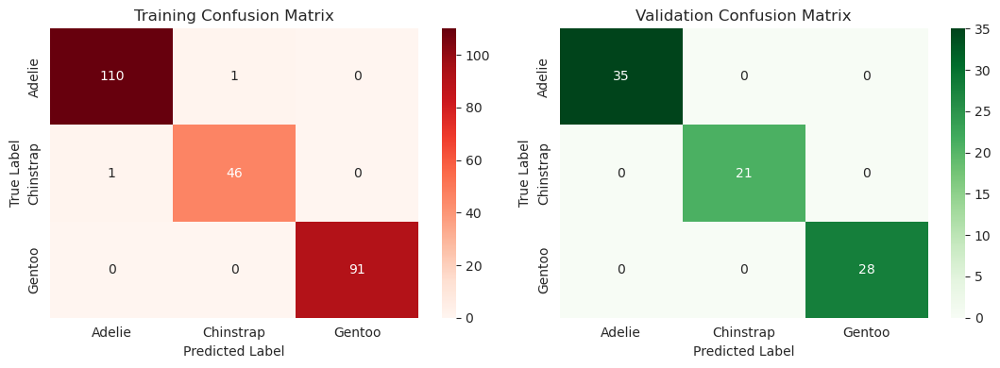



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['cluster_2', 'island_Dream', 'cluster_0', 'cluster_1', 'cluster_3', 'pca0', 'pca1', 'pca2', 'island_Biscoe', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	cluster_2: 0.5142857142857142 +- 0.06666666666666667
	island_Dream: 0.28809523809523807 +- 0.02308418979722061
	cluster_0: 0.0 +- 0.0
	cluster_1: 0.0 +- 0.0
	cluster_3: 0.0 +- 0.0
	pca0: 0.0 +- 0.0
	pca1: 0.0 +- 0.0
	pca2: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



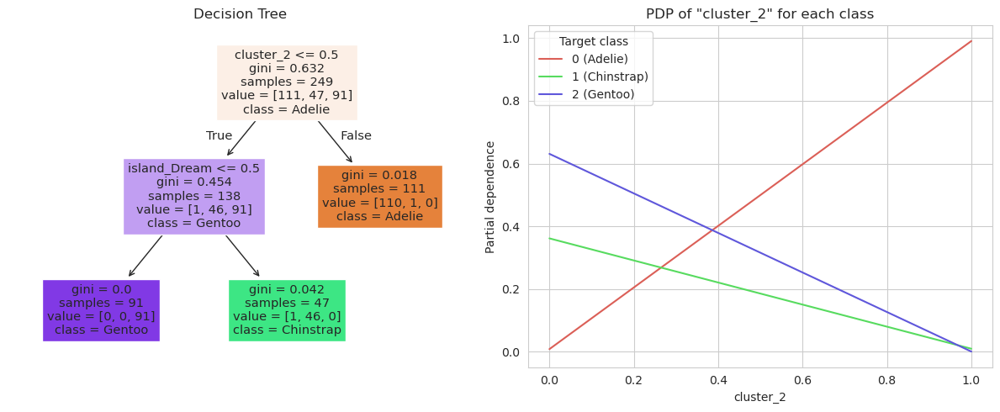

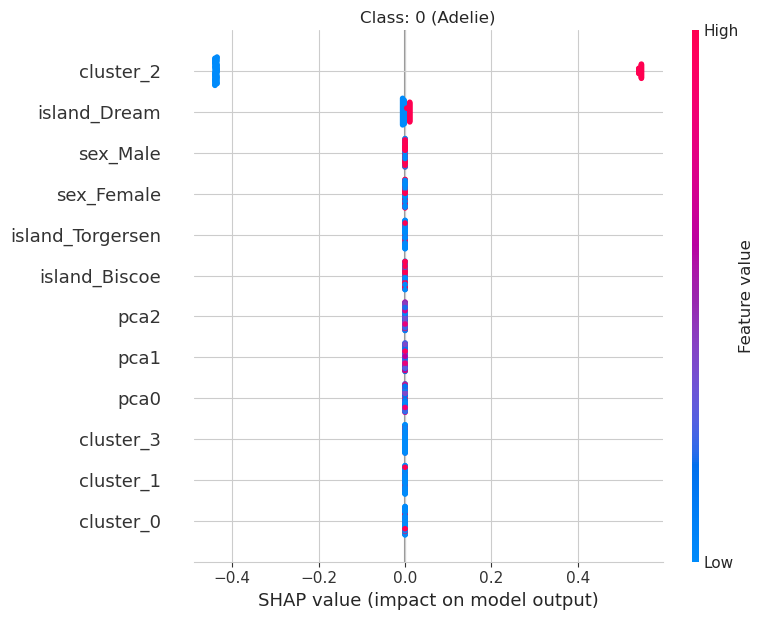

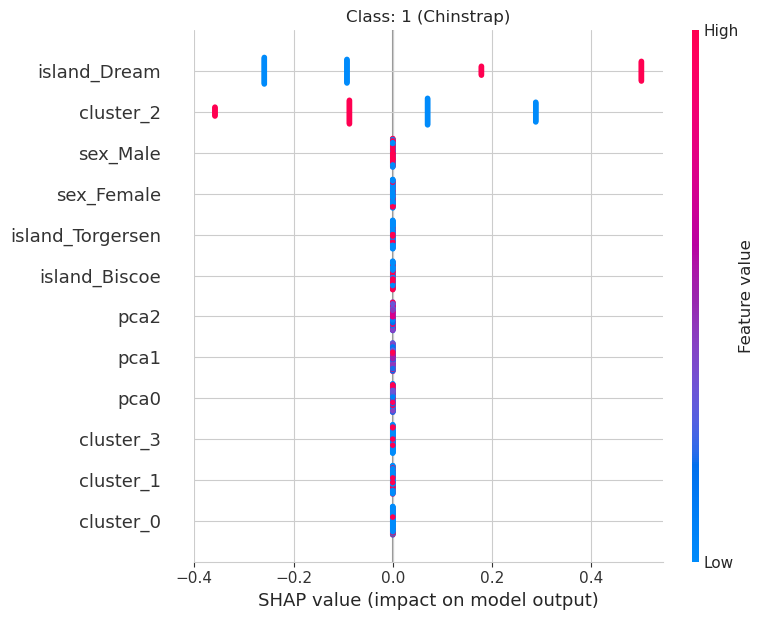

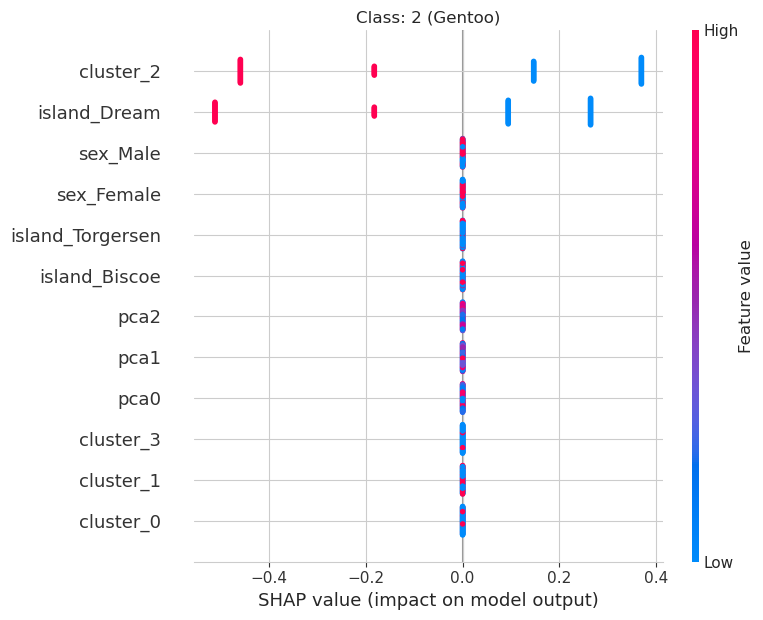

In [101]:
model = 'dtc'

for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, False),
                         n_splits=5, n_repeats=3,
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [102]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [103]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=3,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                                                                     slice(0, -5, None))],
                                                     

In [104]:
best_cv[model+'_clus']['params']

{'model__max_depth': 2,
 'model__max_leaf_nodes': 3,
 'preprocessor__cluster__n_clusters': 4,
 'preprocessor__selector__n_features': 3}

In [105]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=3, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c19fd990>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [106]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g  flipper_length_mm
286     Biscoe  Female         3.093333           0.148085              216.0
188      Dream    Male         2.664921           0.273856              196.0
70   Torgersen  Female         2.434524           0.185708              191.0
173      Dream    Male         2.605263           0.247500              200.0
106     Biscoe  Female         2.242938           0.219591              193.0
..         ...     ...              ...                ...                ...
203      Dream    Male         2.477387           0.242240              203.0
255     Biscoe  Female         3.306569           0.144328              210.0
72   Torgersen  Female         2.248447           0.164175              187.0
235     Biscoe  Female         3.110345           0.130790              215.0
37       Dream  Female         1.945946           0.214839              186.0

[249 rows x 5 columns]


In [107]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=3, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c19fd990>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=4)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [108]:
del best_preproc, best_feats

### Model 2: `RandomForestClassifier`

In [109]:
model = 'rfc'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', RandomForestClassifier(random_state=0))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                                ('model', RandomForestClassifier(random_state=0))])

    # defining the hyperparameter grid
    param_grid[model_name] = {'model__n_estimators': [100*i for i in range(1, 11)],
                              'model__max_depth': list(range(1,11))+[None]}
    
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

***************************************************************************
rfc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |     

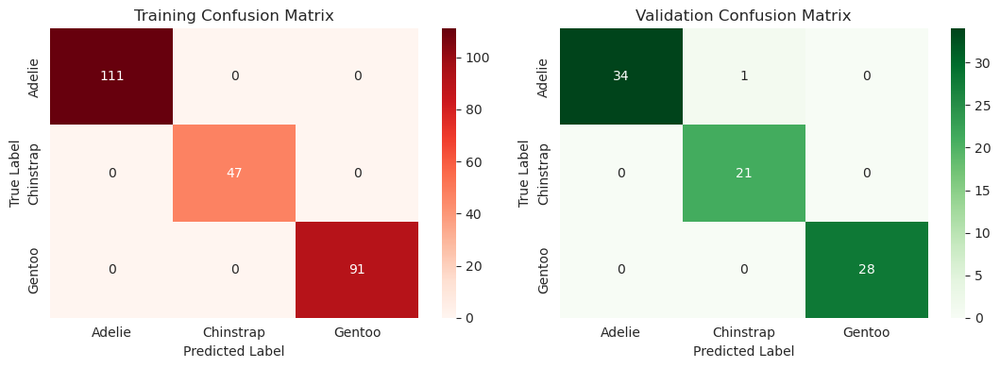






***************************************************************************
rfc_raw , 	CV: True 

***************************************************************************
We will evaluate rfc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9848938886988182
		best params: {'model__max_depth': 4, 'model__n_estimators': 1000}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.990991 | 0.990991 |   0.990991 | 111        |
| 1            |    0.978723 | 0.978723 |   0.978723 |  47        |
| 2            |    1        | 1        |   1        |  91     

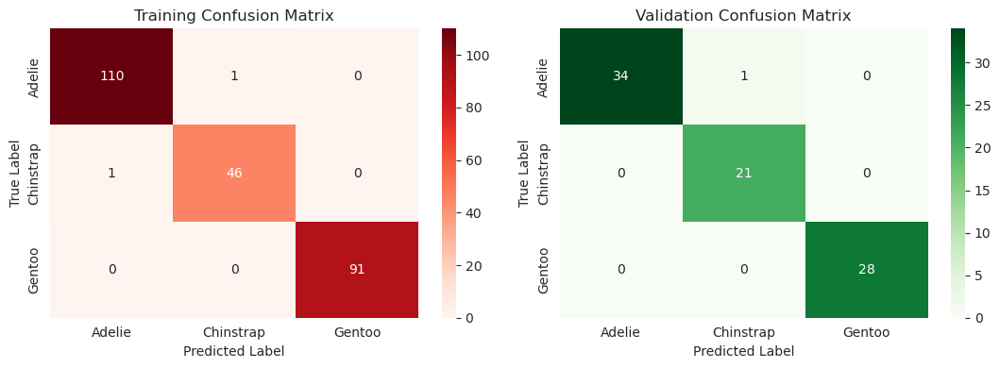



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_length_mm', 'island_Dream', 'flipper_length_mm', 'bill_depth_mm', 'island_Torgersen', 'island_Biscoe', 'sex_Female', 'sex_Male', 'body_mass_g']
The most important features are:

	bill_length_mm: 0.18095238095238095 +- 0.019047619047619025
	island_Dream: 0.1190476190476191 +- 0.016835875742536865
	flipper_length_mm: 0.05476190476190481 +- 0.016148404721726812
	bill_depth_mm: 0.014285714285714323 +- 0.008908708063747483
	island_Torgersen: 0.007142857142857184 +- 0.005832118435198077
	island_Biscoe: 0.0023809523809524167 +- 0.008908708063747495
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0
	body_mass_g: -0.004761904761904745 +- 0.0058321184351980224

****************************************************************************************************



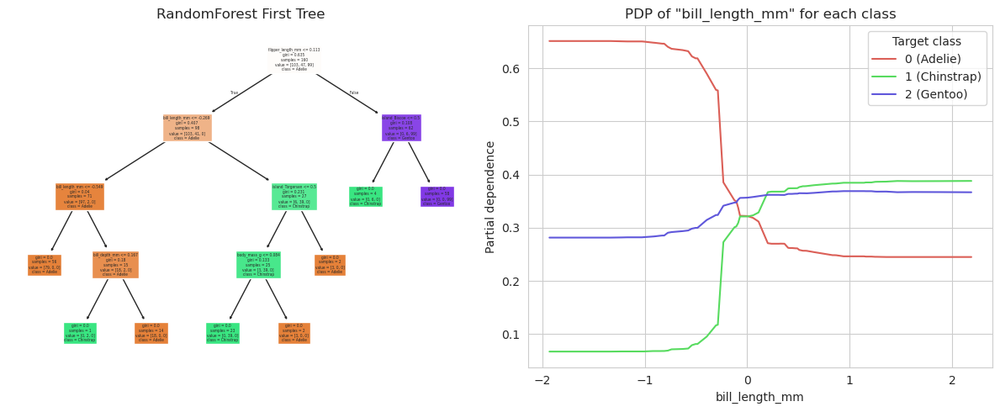

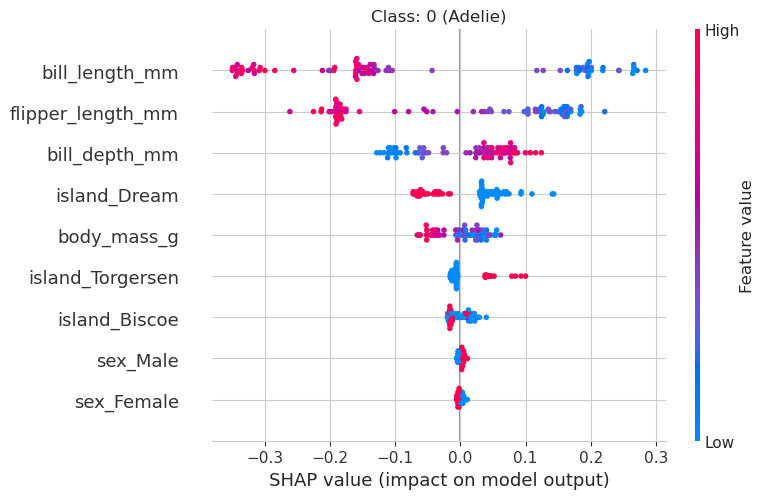

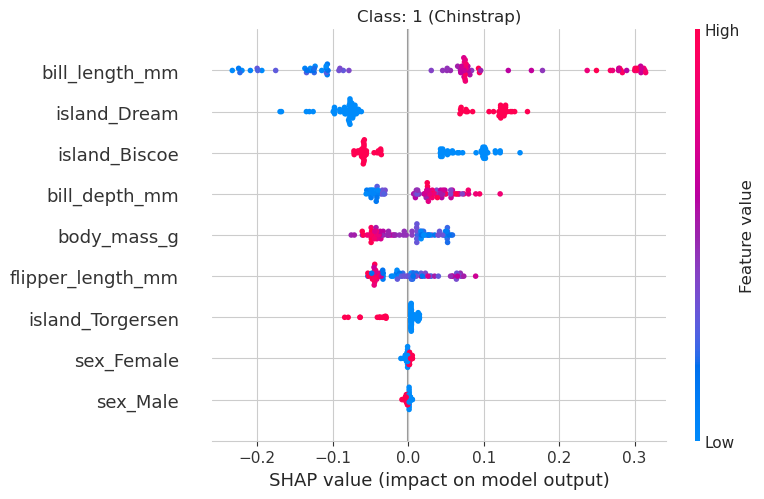

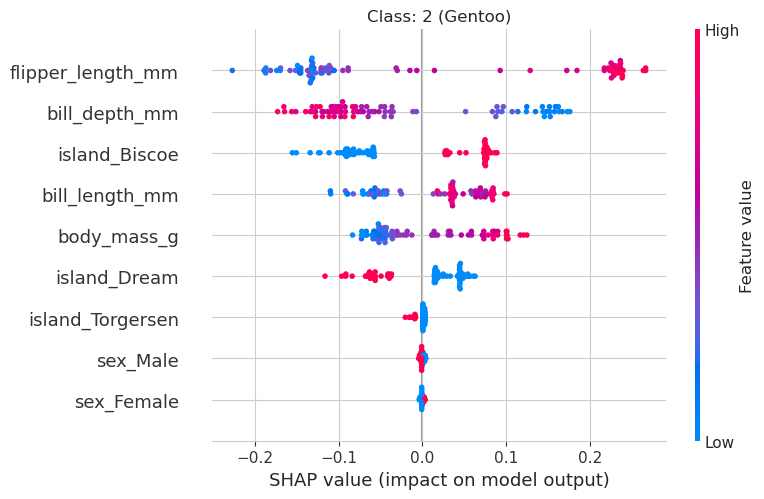




***************************************************************************
rfc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |  

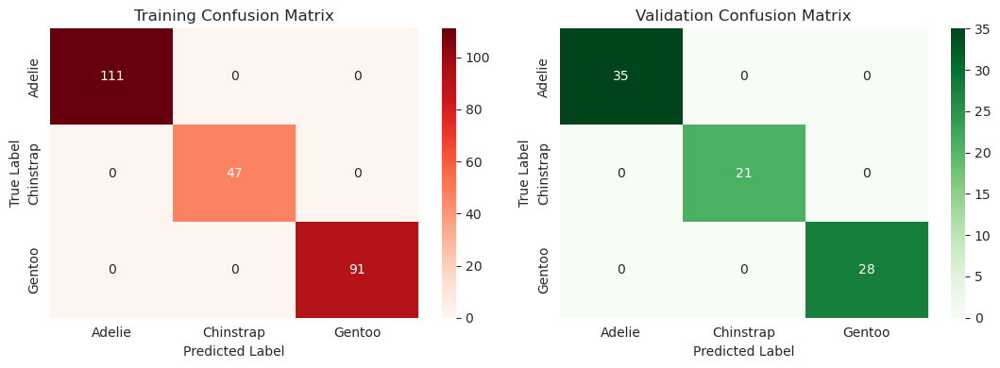






***************************************************************************
rfc_eng , 	CV: True 

***************************************************************************
We will evaluate rfc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9947345487902763
		best params: {'model__max_depth': 4, 'model__n_estimators': 200, 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           

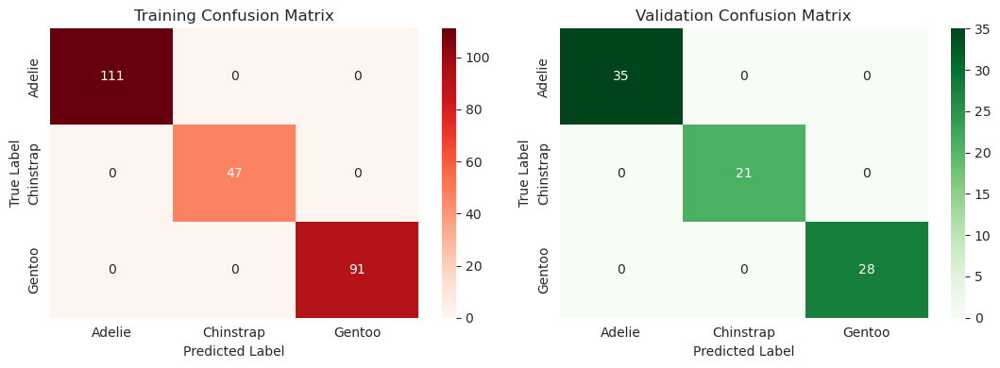



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'feedability_mm2/g', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_elongation: 0.39047619047619053 +- 0.03794613678692675
	feedability_mm2/g: 0.0071428571428571175 +- 0.0058321184351980224
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



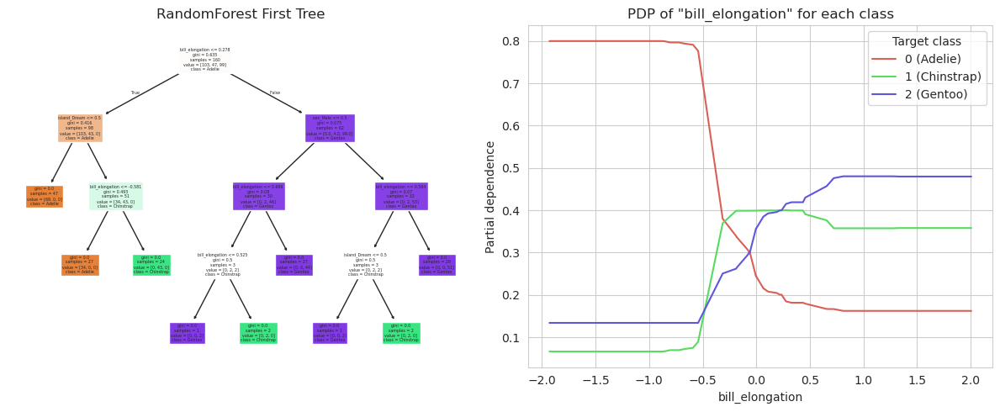

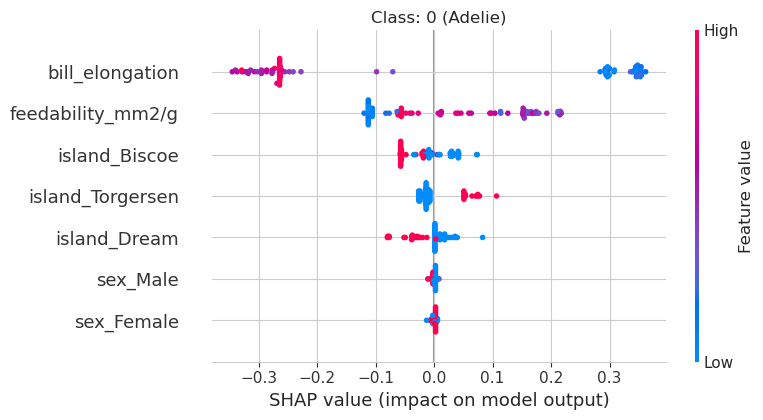

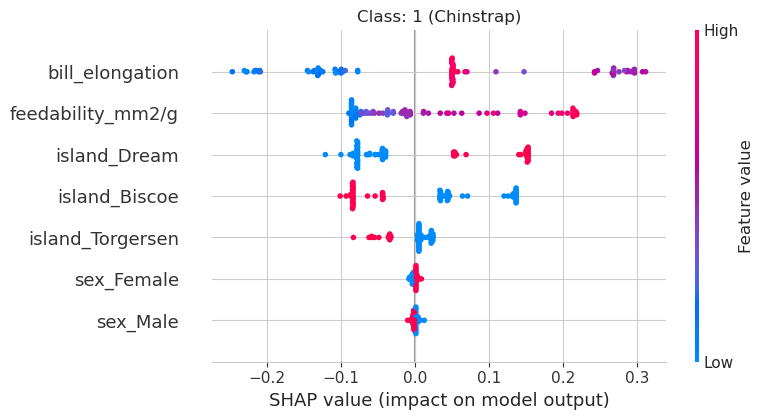

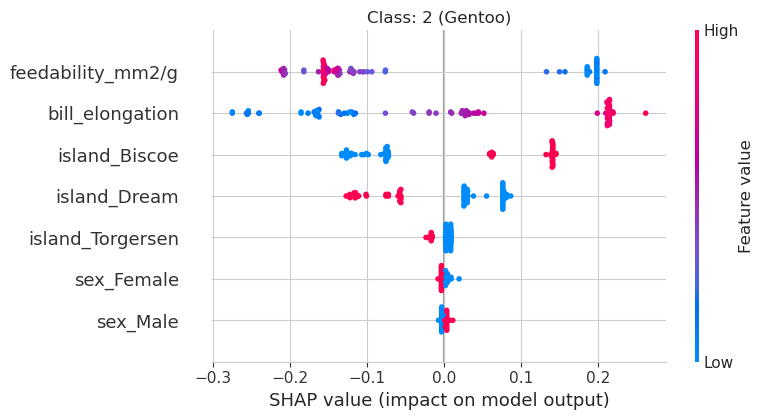




***************************************************************************
rfc_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfc_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |

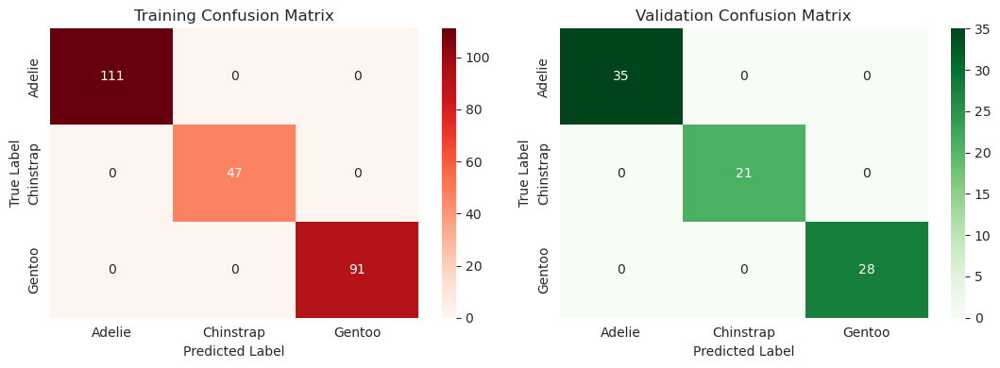






***************************************************************************
rfc_clus , 	CV: True 

***************************************************************************
We will evaluate rfc_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9880579088700624
		best params: {'model__max_depth': 5, 'model__n_estimators': 300, 'preprocessor__cluster__n_clusters': 3, 'preprocessor__selector__n_features': 3}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.991071 | 1        |   0.995516 | 111        |
| 1            |    1        | 0.978723 |   0.989

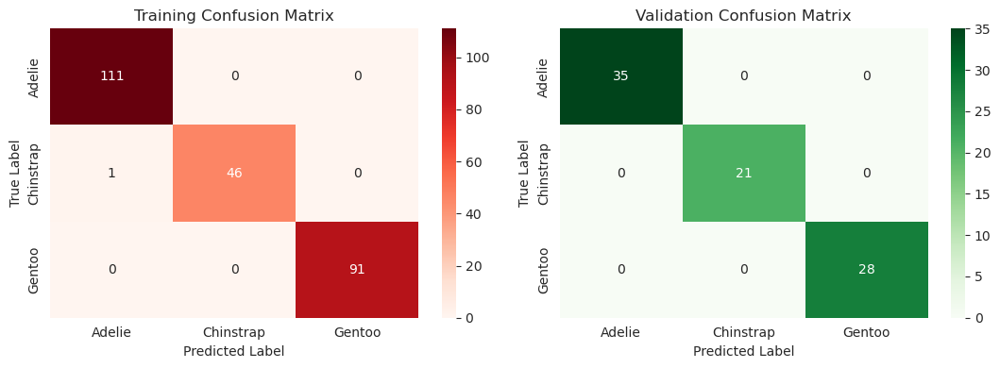



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['cluster_2', 'cluster_0', 'cluster_1', 'pca0', 'pca1', 'pca2', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	cluster_2: 0.014285714285714301 +- 0.0116642368703961
	cluster_0: 0.0 +- 0.0
	cluster_1: 0.0 +- 0.0
	pca0: 0.0 +- 0.0
	pca1: 0.0 +- 0.0
	pca2: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



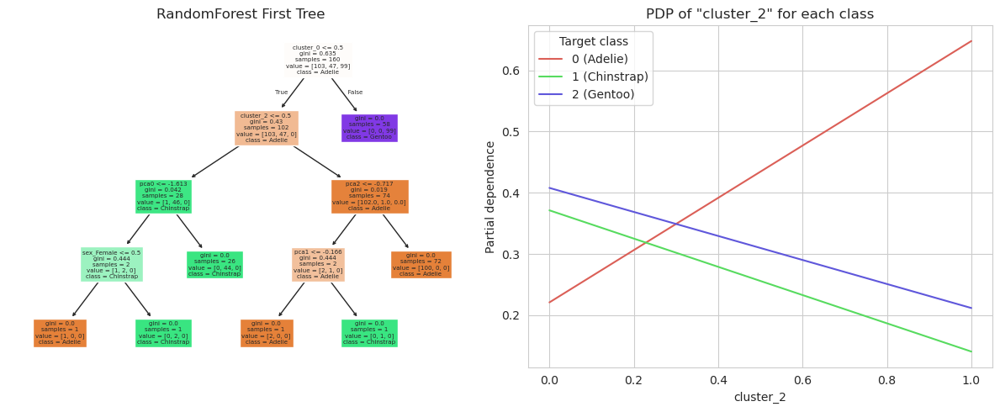

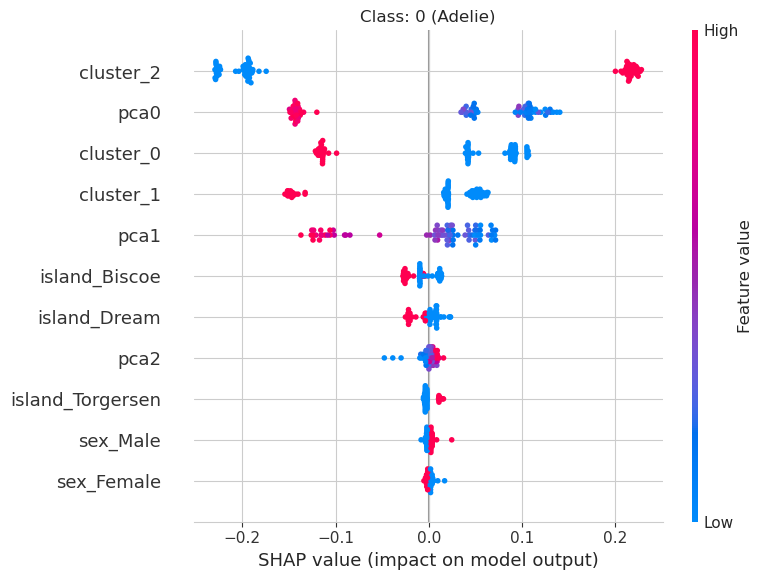

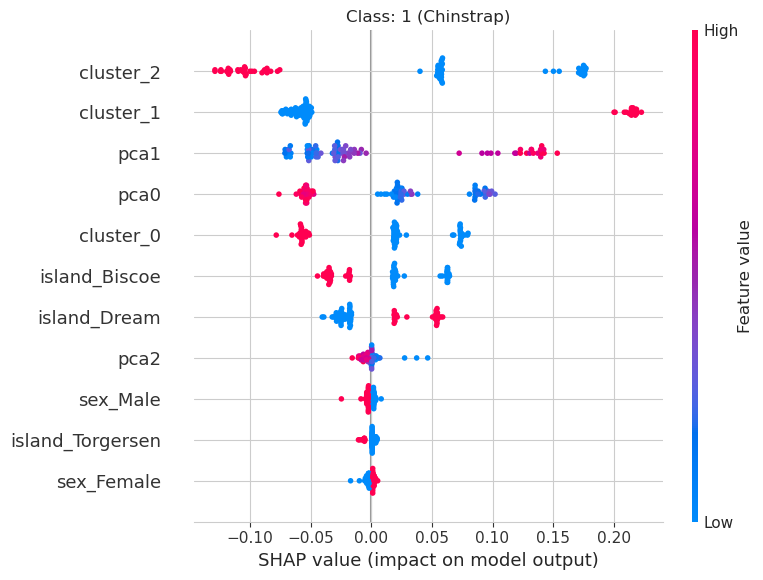

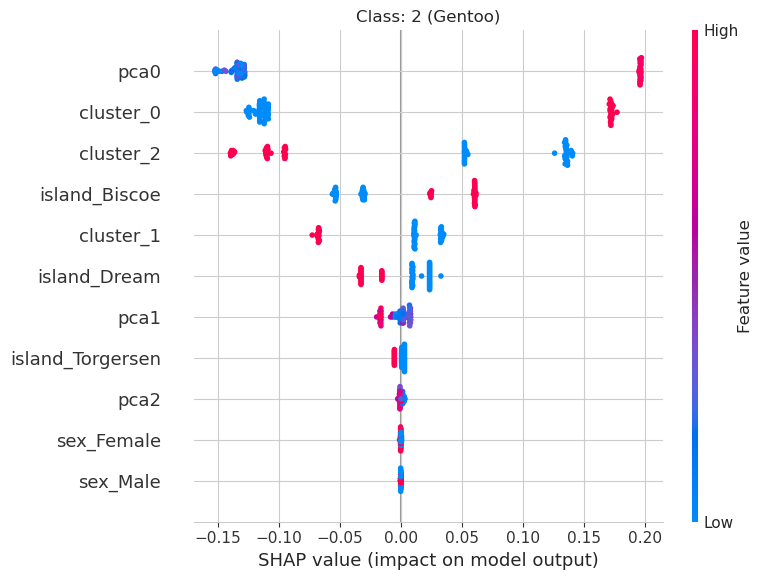

In [110]:
model = 'rfc'

for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [111]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,rfc_eng_cv,rfc_clus_no_cv,rfc_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,1.0,1.0,0.997024
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000,0.984848,0.984848,1.0,1.0,1.0,1.000000
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,1.0,1.0,0.992908
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000,0.990476,0.990476,1.0,1.0,1.0,1.000000
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968,1.000000,0.991968,1.0,1.0,1.0,0.995984
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000,0.988095,0.988095,1.0,1.0,1.0,1.000000
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,1.0,1.0,0.994921
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000,0.987417,0.987417,1.0,1.0,1.0,1.000000


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [112]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=3,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                                                                     slice(0, -5, None))],
                                                     

In [113]:
best_cv[model+'_clus']['params']

{'model__max_depth': 5,
 'model__n_estimators': 300,
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__selector__n_features': 3}

In [114]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=3, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c1258690>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [115]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g  flipper_length_mm
286     Biscoe  Female         3.093333           0.148085              216.0
188      Dream    Male         2.664921           0.273856              196.0
70   Torgersen  Female         2.434524           0.185708              191.0
173      Dream    Male         2.605263           0.247500              200.0
106     Biscoe  Female         2.242938           0.219591              193.0
..         ...     ...              ...                ...                ...
203      Dream    Male         2.477387           0.242240              203.0
255     Biscoe  Female         3.306569           0.144328              210.0
72   Torgersen  Female         2.248447           0.164175              187.0
235     Biscoe  Female         3.110345           0.130790              215.0
37       Dream  Female         1.945946           0.214839              186.0

[249 rows x 5 columns]


In [116]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=3, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c1258690>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=3)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [117]:
del best_preproc, best_feats

### Model 3: `XGBClassifier`

In [118]:
model = 'xgbc'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', XGBClassifier(random_state=0))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                                ('model', XGBClassifier(random_state=0))])

    
    # defining the hyperparameter grid
    param_grid[model_name] = {'model__n_estimators': [100*i for i in range(1, 21)],
                              'model__learning_rate': [0.01*i for i in range(1,5)]+[0.05*i for i in range(1,11)]}
    
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

***************************************************************************
xgbc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=xgbc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |   

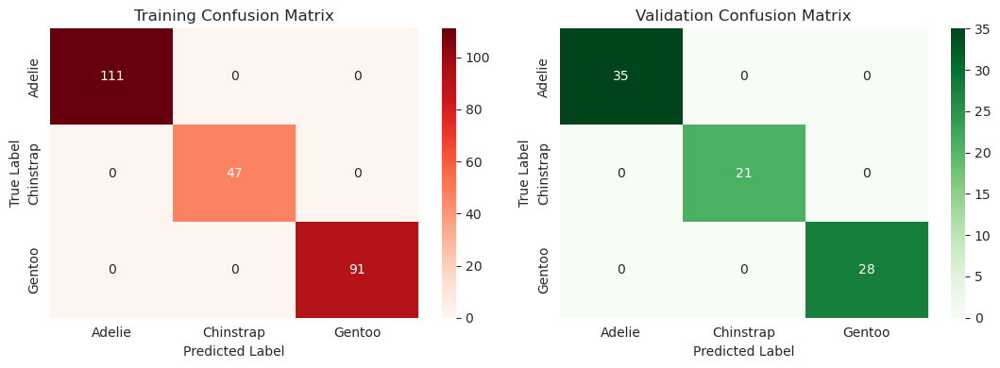






***************************************************************************
xgbc_raw , 	CV: True 

***************************************************************************
We will evaluate xgbc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(
/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoos

......Done!
 -> CV Results:
		best f1_macro: 0.9773655007935337
		best params: {'model__learning_rate': 0.01, 'model__n_estimators': 700}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       249 |
| weighted avg |           1 |        1 |          1 |       249 |


Classification Report: Validation
..................................................
|              |   precision |   recall |   f1-score |   su

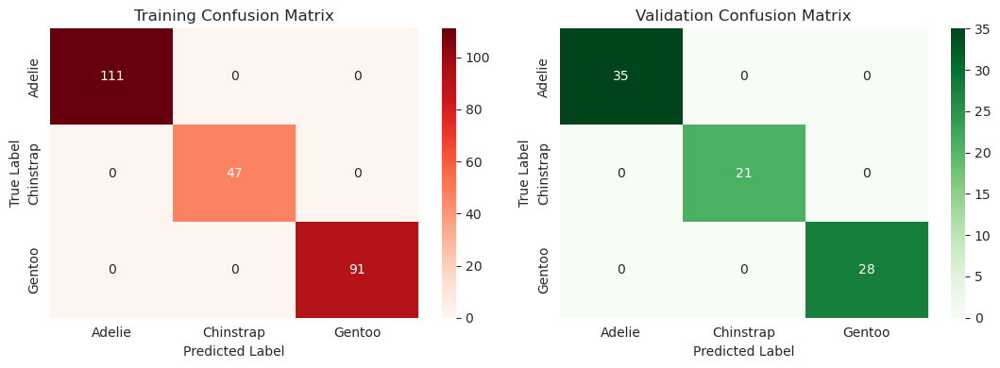



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_length_mm', 'island_Dream', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g', 'island_Biscoe', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_length_mm: 0.22142857142857145 +- 0.012140522651411417
	island_Dream: 0.15714285714285717 +- 0.013883218797250699
	bill_depth_mm: 0.06190476190476191 +- 0.02048172682629196
	flipper_length_mm: 0.019047619047619046 +- 0.012140522651411398
	body_mass_g: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/plotting.py:267: FutureWarning: The `num_trees` parameter is deprecated, use `tree_idx` insetad. 
  warnings.warn(


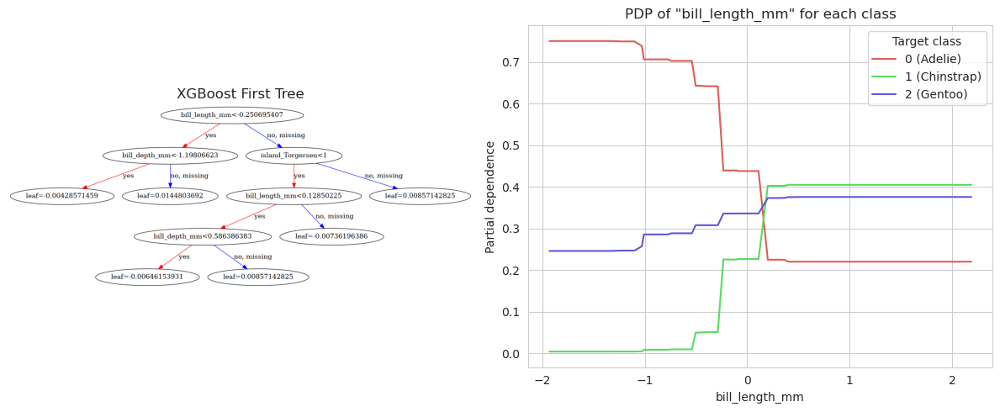

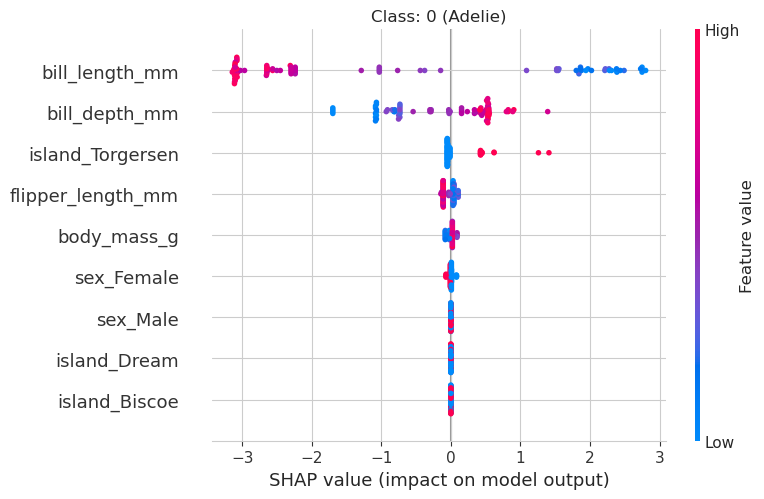

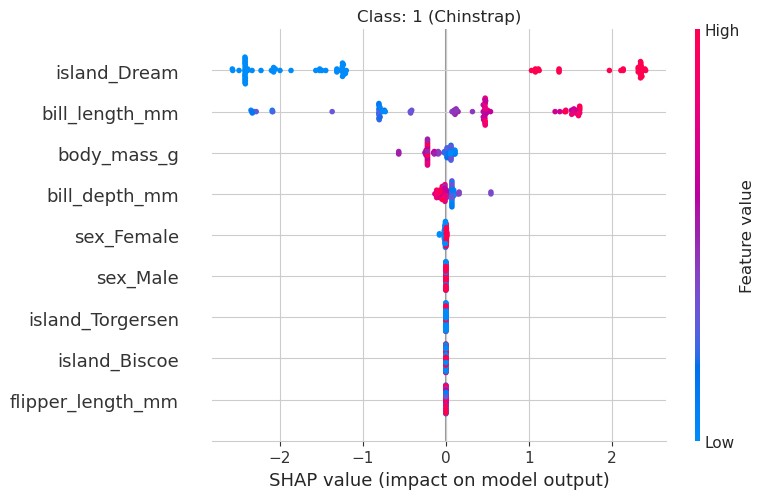

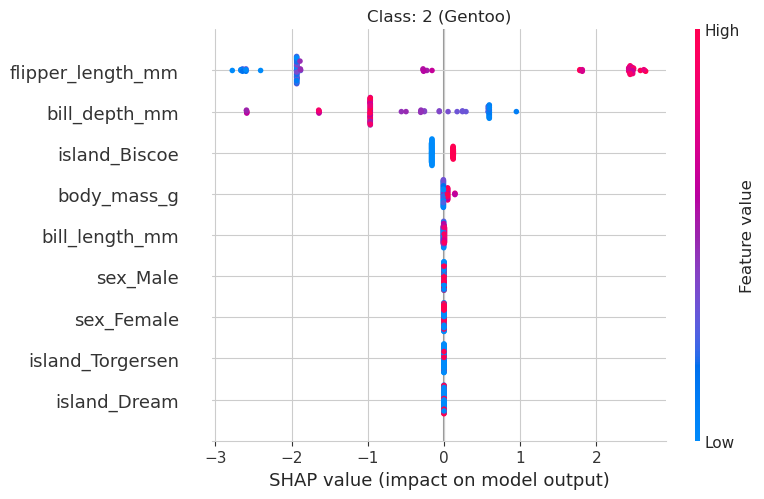




***************************************************************************
xgbc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=xgbc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |

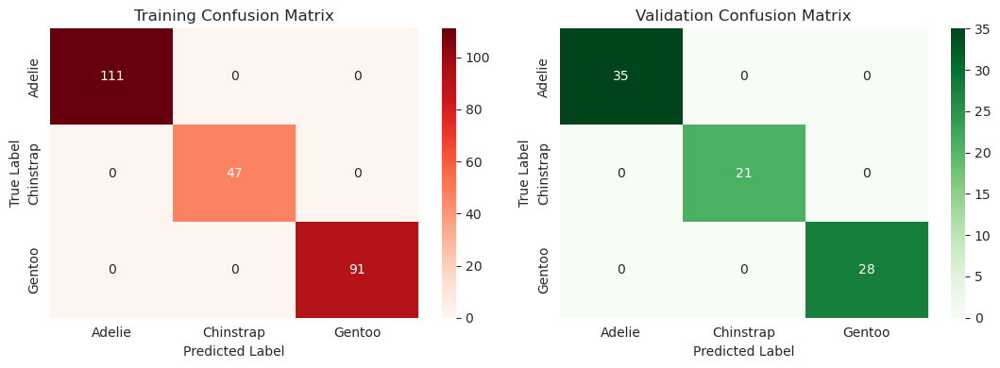






***************************************************************************
xgbc_eng , 	CV: True 

***************************************************************************
We will evaluate xgbc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9828277844056357
		best params: {'model__learning_rate': 0.01, 'model__n_estimators': 400, 'preprocessor__selector__n_features': None}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            

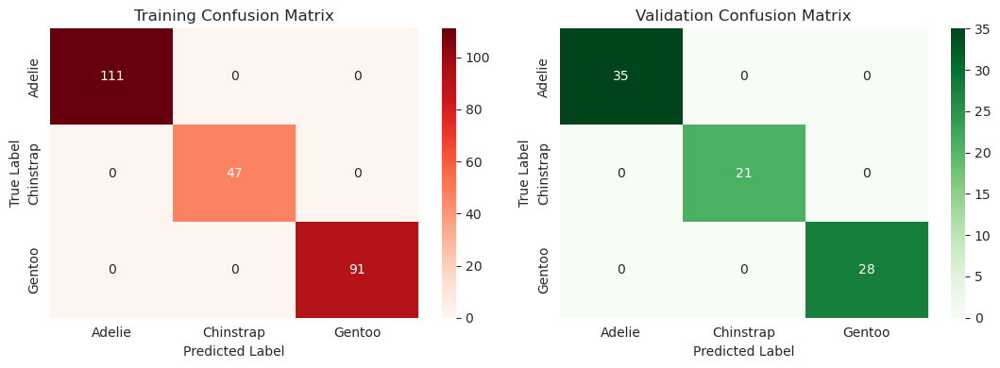



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'feedability_mm2/g', 'island_Dream', 'bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g', 'bill_profile_mm2', 'mobility_mm/g', 'frame_mmg', 'bill_to_flipper_ratio_mm', 'island_Biscoe', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_elongation: 0.4666666666666667 +- 0.056040963313999145
	feedability_mm2/g: 0.18095238095238095 +- 0.017496355305594145
	island_Dream: 0.004761904761904745 +- 0.0058321184351980224
	bill_length_mm: 0.0 +- 0.0
	bill_depth_mm: 0.0 +- 0.0
	flipper_length_mm: 0.0 +- 0.0
	body_mass_g: 0.0 +- 0.0
	bill_profile_mm2: 0.0 +- 0.0
	mobility_mm/g: 0.0 +- 0.0
	frame_mmg: 0.0 +- 0.0
	bill_to_flipper_ratio_mm: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Fema

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/plotting.py:267: FutureWarning: The `num_trees` parameter is deprecated, use `tree_idx` insetad. 
  warnings.warn(


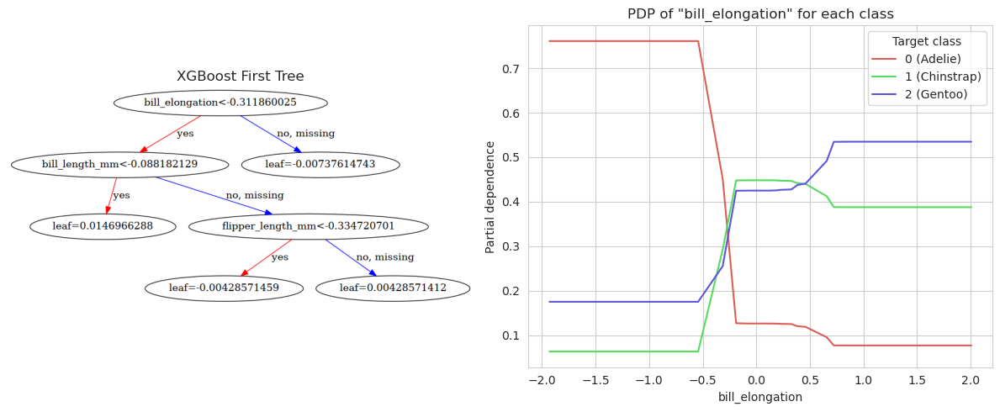

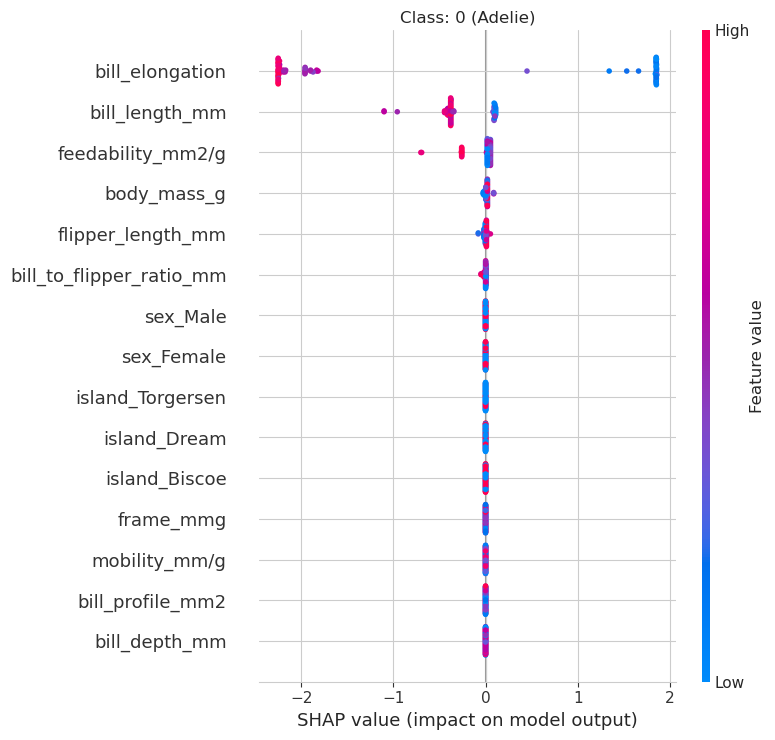

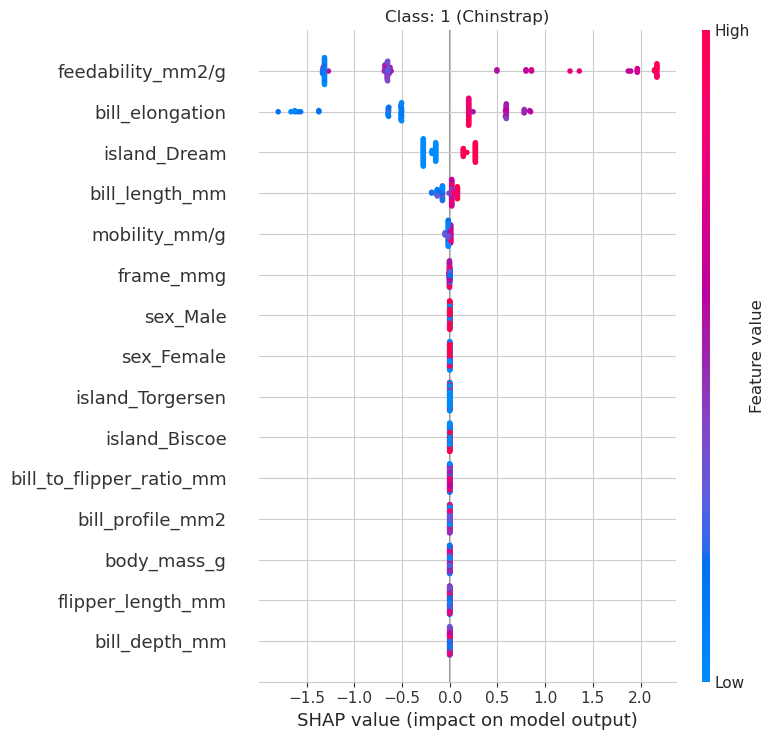

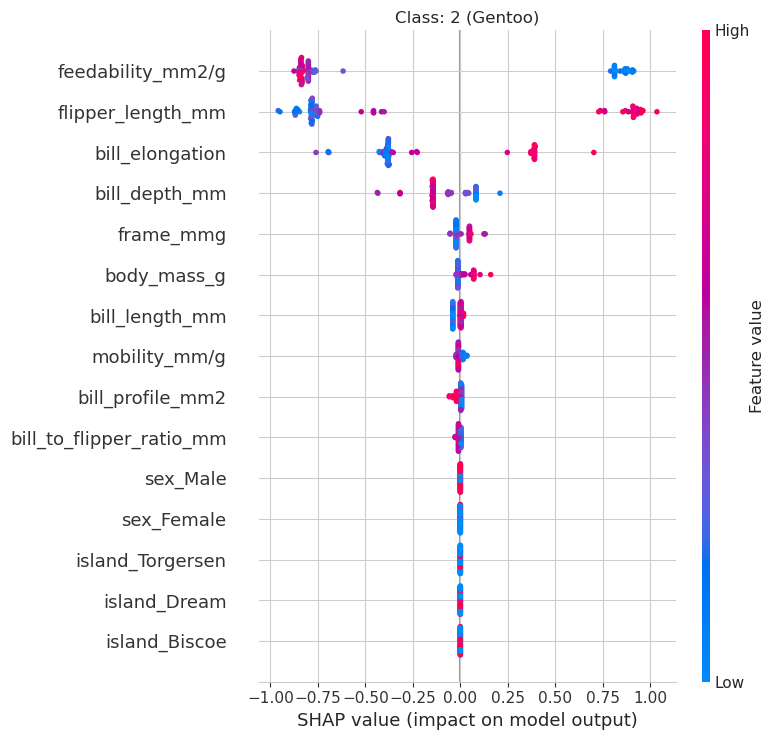




***************************************************************************
xgbc_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=xgbc_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg   

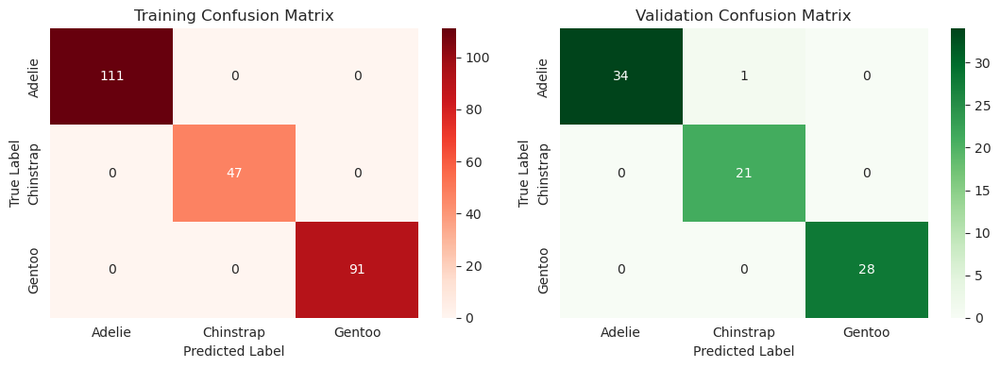






***************************************************************************
xgbc_clus , 	CV: True 

***************************************************************************
We will evaluate xgbc_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9863944910662937
		best params: {'model__learning_rate': 0.01, 'model__n_estimators': 800, 'preprocessor__cluster__n_clusters': 3, 'preprocessor__selector__n_features': 3}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |  

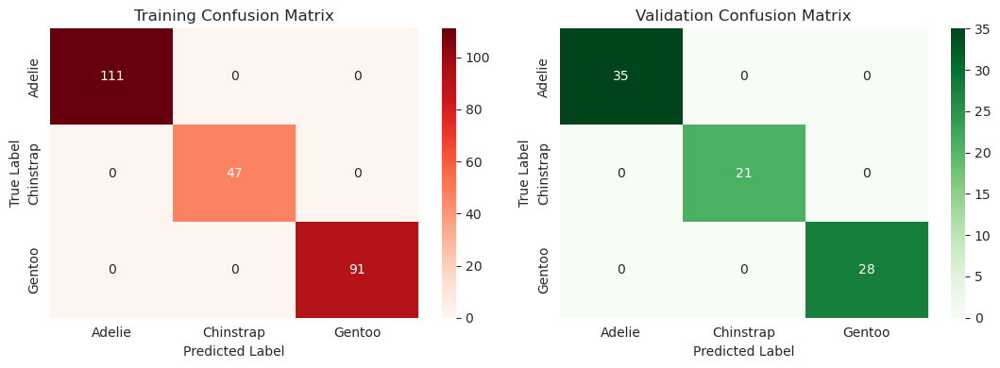



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['cluster_0', 'cluster_2', 'cluster_1', 'pca0', 'pca1', 'pca2', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	cluster_0: 0.40714285714285714 +- 0.02756151643521482
	cluster_2: 0.02857142857142858 +- 0.012140522651411413
	cluster_1: 0.009523809523809513 +- 0.008908708063747483
	pca0: 0.0 +- 0.0
	pca1: 0.0 +- 0.0
	pca2: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/plotting.py:267: FutureWarning: The `num_trees` parameter is deprecated, use `tree_idx` insetad. 
  warnings.warn(


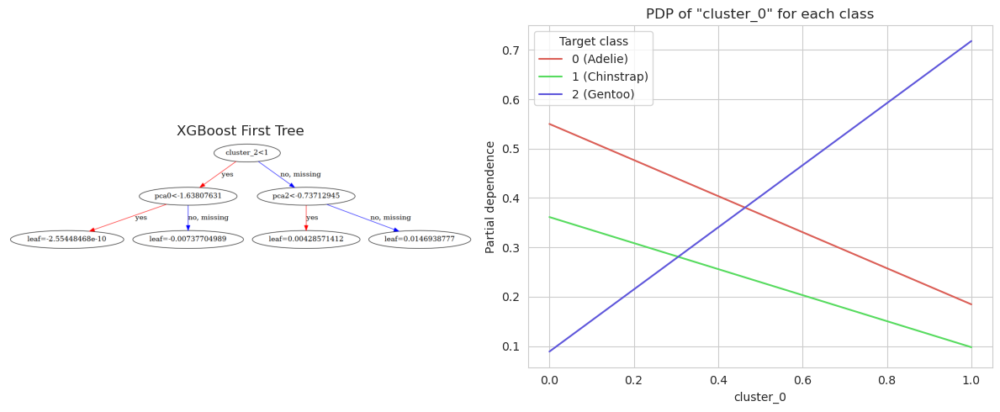

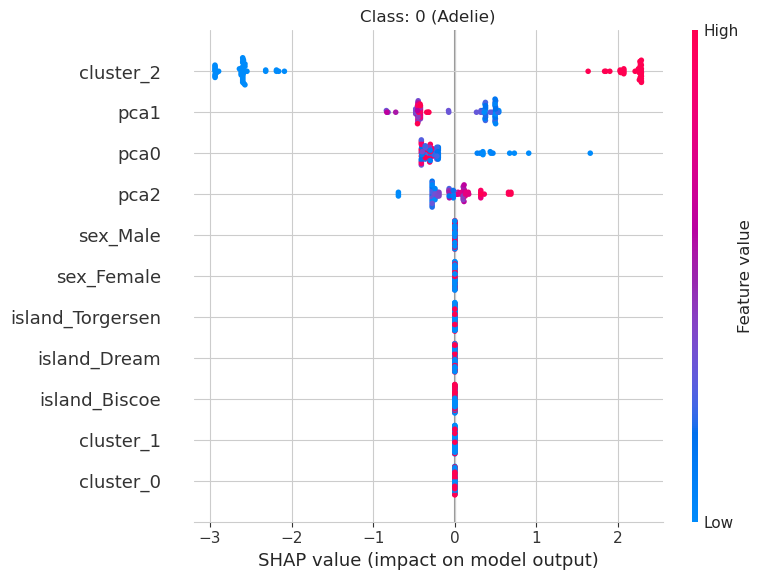

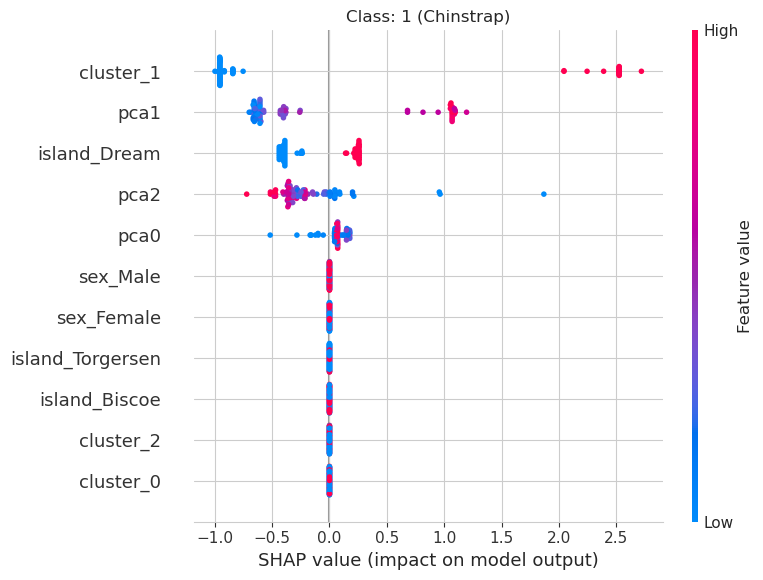

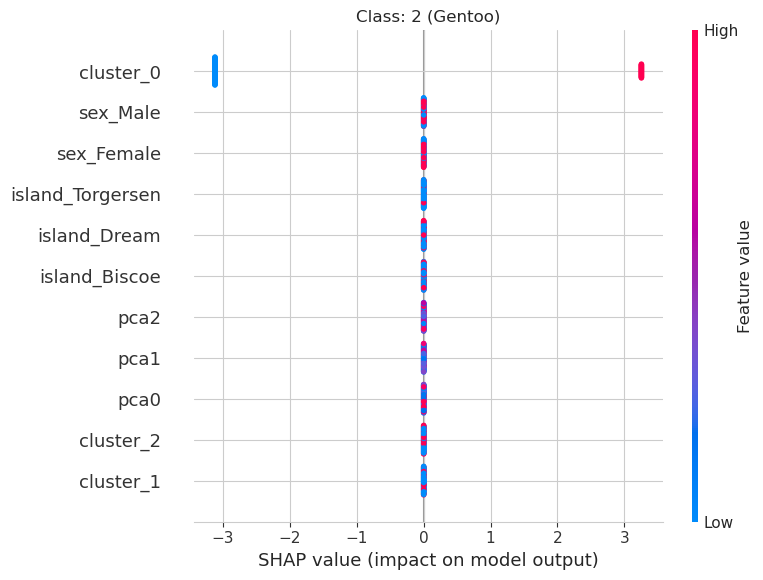

In [119]:
model = 'xgbc'

for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [120]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,rfc_eng_cv,rfc_clus_no_cv,rfc_clus_cv,xgbc_raw_no_cv,xgbc_raw_cv,xgbc_eng_no_cv,xgbc_eng_cv,xgbc_clus_no_cv,xgbc_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,1.0,1.0,0.997024,1.0,1.0,1.0,1.0,1.000000,1.0
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000,0.984848,0.984848,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,0.984848,1.0
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,1.0,1.0,0.992908,1.0,1.0,1.0,1.0,1.000000,1.0
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000,0.990476,0.990476,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,0.990476,1.0
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968,1.000000,0.991968,1.0,1.0,1.0,0.995984,1.0,1.0,1.0,1.0,1.000000,1.0
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000,0.988095,0.988095,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,0.988095,1.0
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,1.0,1.0,0.994921,1.0,1.0,1.0,1.0,1.000000,1.0
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000,0.987417,0.987417,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,0.987417,1.0


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [121]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=3,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                feature_types=None, feature_weights=None,
                                gamma=None, grow_policy=None,
                        

In [122]:
best_cv[model+'_clus']['params']

{'model__learning_rate': 0.01,
 'model__n_estimators': 800,
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__selector__n_features': 3}

In [123]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=3, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9b8707f10>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [124]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g  flipper_length_mm
286     Biscoe  Female         3.093333           0.148085              216.0
188      Dream    Male         2.664921           0.273856              196.0
70   Torgersen  Female         2.434524           0.185708              191.0
173      Dream    Male         2.605263           0.247500              200.0
106     Biscoe  Female         2.242938           0.219591              193.0
..         ...     ...              ...                ...                ...
203      Dream    Male         2.477387           0.242240              203.0
255     Biscoe  Female         3.306569           0.144328              210.0
72   Torgersen  Female         2.248447           0.164175              187.0
235     Biscoe  Female         3.110345           0.130790              215.0
37       Dream  Female         1.945946           0.214839              186.0

[249 rows x 5 columns]


In [125]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=3, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9b8707f10>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=3)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [126]:
del best_preproc, best_feats

### Model 4: `LogisticRegression`

In [127]:
model = 'logreg'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', LogisticRegression(fit_intercept=True, max_iter=10000, random_state=0))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', LogisticRegression(fit_intercept=True, max_iter=10000, random_state=0))])


    # defining the hyperparameter grid
    param_grid[model_name] = {'model__C': [0.5*i for i in range(1,21)],
                              'model__solver': ['lbfgs', 'saga'],
                              'model__penalty': ['l2', 'l1']}
    
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

***************************************************************************
logreg_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=logreg_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.991071 | 1        |   0.995516 | 111        |
| 1            |    1        | 0.978723 |   0.989247 |  47        |
| 2            |    1        | 1        |   1        |  91        |
| accuracy     |    0.995984 | 0.995984 |   0.995984 |   0.995984 |
| macro a

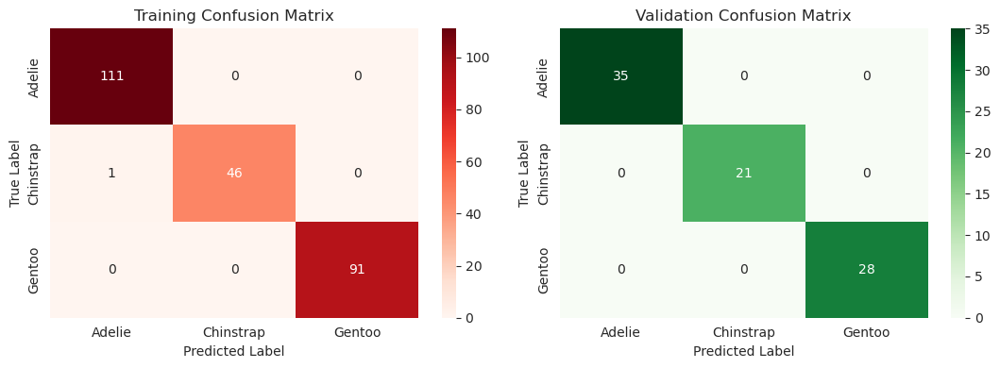






***************************************************************************
logreg_raw , 	CV: True 

***************************************************************************
We will evaluate logreg_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
300 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
300 fits failed with the following error:
Traceback (most recent call last):
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/pipeline

......Done!
 -> CV Results:
		best f1_macro: 0.9932741820605118
		best params: {'model__C': 1.5, 'model__penalty': 'l1', 'model__solver': 'saga'}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       249 |
| weighted avg |           1 |        1 |          1 |       249 |


Classification Report: Validation
..................................................
|              |   precision |   recall |   f1-scor

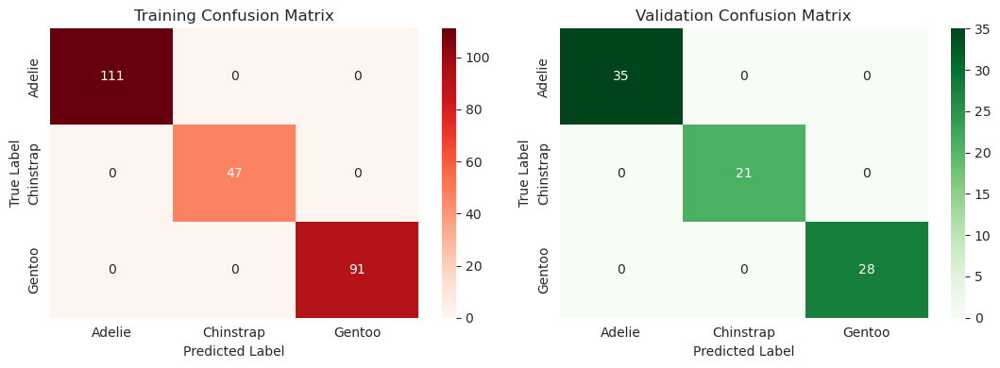



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_length_mm', 'bill_depth_mm', 'body_mass_g', 'flipper_length_mm', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_length_mm: 0.3833333333333334 +- 0.039411774660111525
	bill_depth_mm: 0.1857142857142857 +- 0.016148404721726812
	body_mass_g: 0.03333333333333335 +- 0.008908708063747484
	flipper_length_mm: 0.0071428571428571175 +- 0.0058321184351980224
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



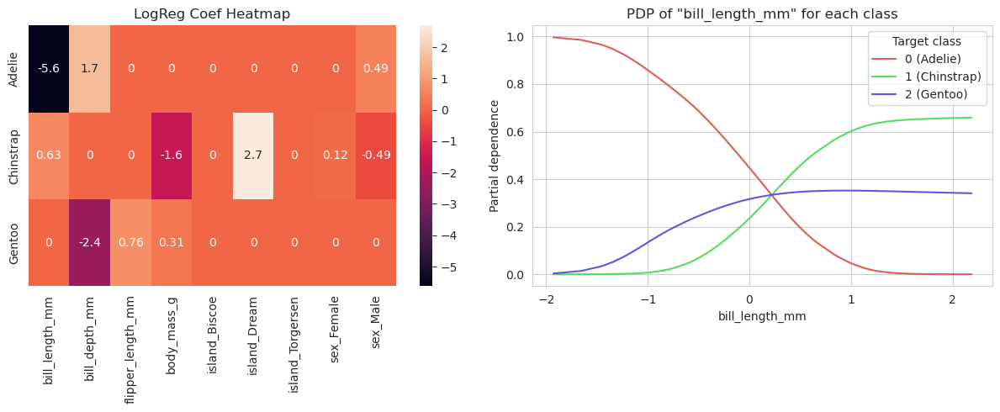

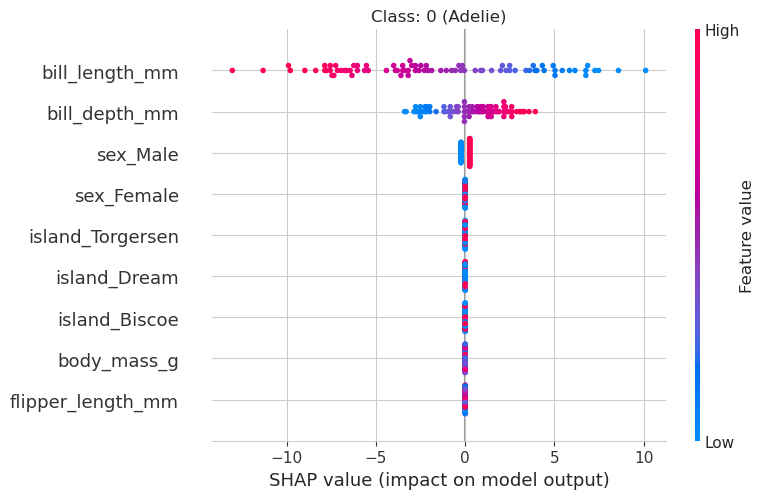

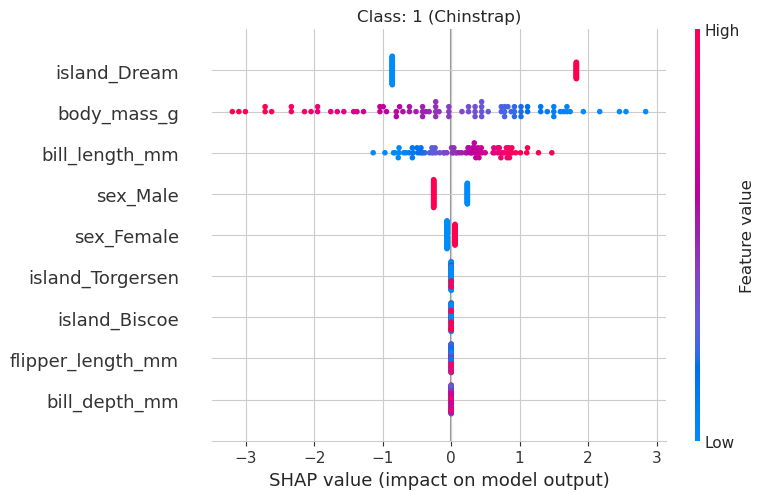

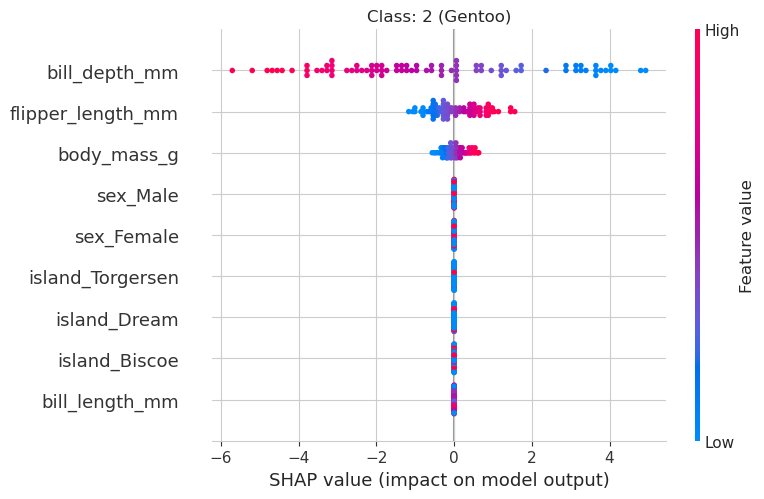




***************************************************************************
logreg_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=logreg_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg 

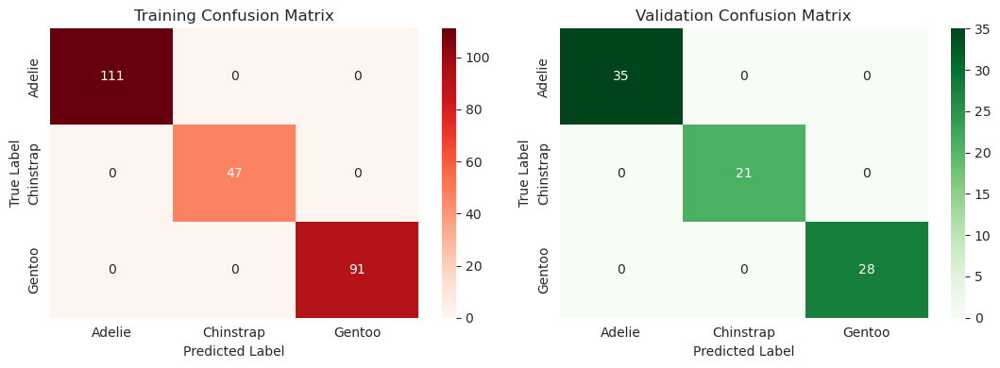






***************************************************************************
logreg_eng , 	CV: True 

***************************************************************************
We will evaluate logreg_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
1200 fits failed out of a total of 4800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1200 fits failed with the following error:
Traceback (most recent call last):
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/pipeli

......Done!
 -> CV Results:
		best f1_macro: 0.9983365821962313
		best params: {'model__C': 2.0, 'model__penalty': 'l1', 'model__solver': 'saga', 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       249 |
| weighted avg |           1 |        1 |          1 |       249 |


Classification Report: Validation
..................................................
|         

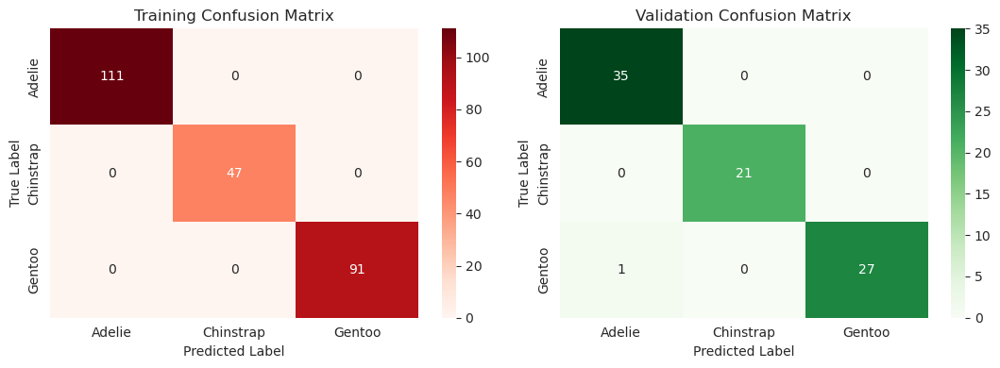



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'feedability_mm2/g', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_elongation: 0.48571428571428577 +- 0.051837002516850576
	feedability_mm2/g: 0.22857142857142865 +- 0.020481726826291975
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



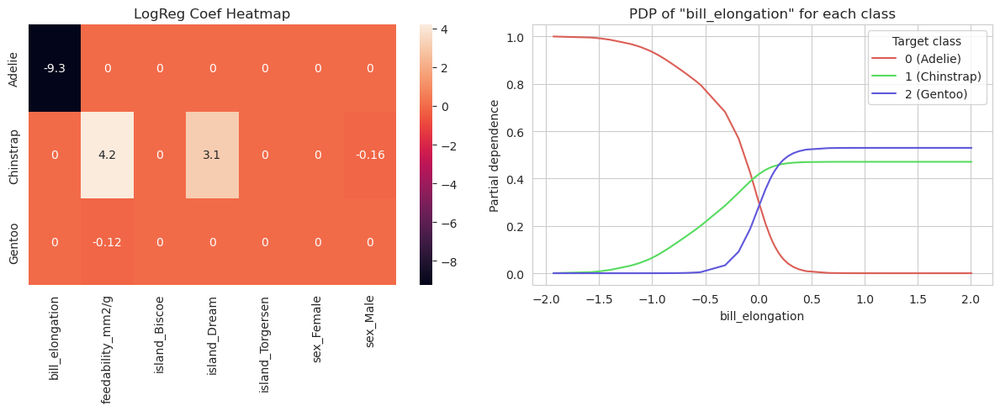

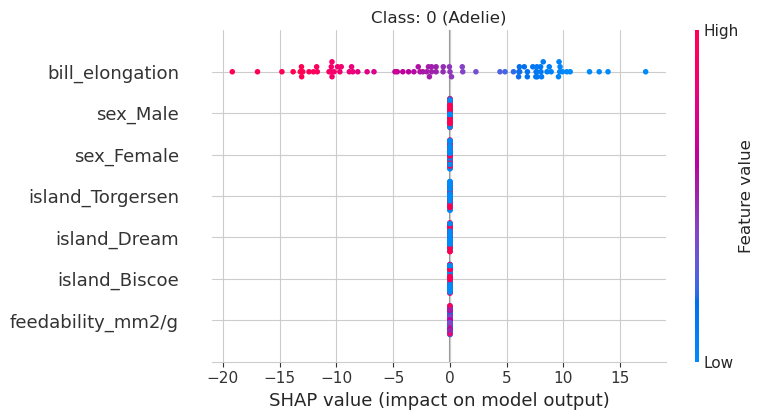

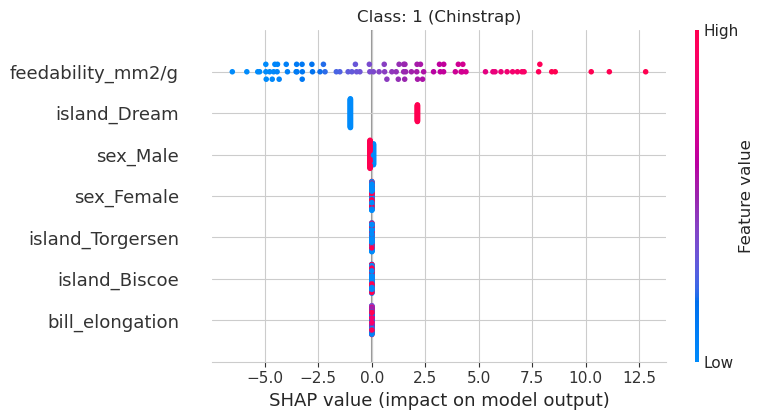

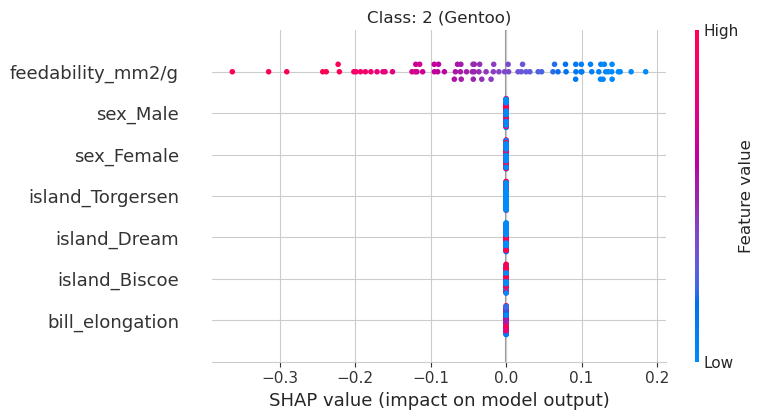




***************************************************************************
logreg_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=logreg_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro av

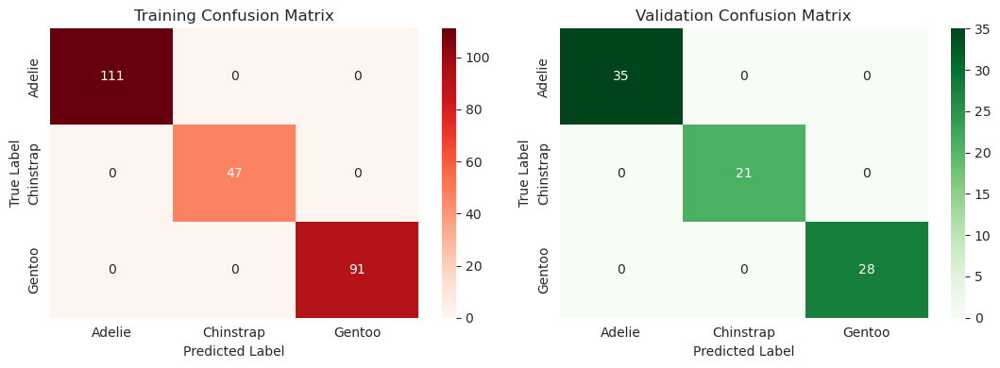






***************************************************************************
logreg_clus , 	CV: True 

***************************************************************************
We will evaluate logreg_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
4800 fits failed out of a total of 19200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4800 fits failed with the following error:
Traceback (most recent call last):
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/pipel

......Done!
 -> CV Results:
		best f1_macro: 0.9967195767195768
		best params: {'model__C': 6.0, 'model__penalty': 'l2', 'model__solver': 'lbfgs', 'preprocessor__cluster__n_clusters': 6, 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       249 |
| weighted avg |           1 |        1 |          1 |       249 |


Classification Report: Validation
....................

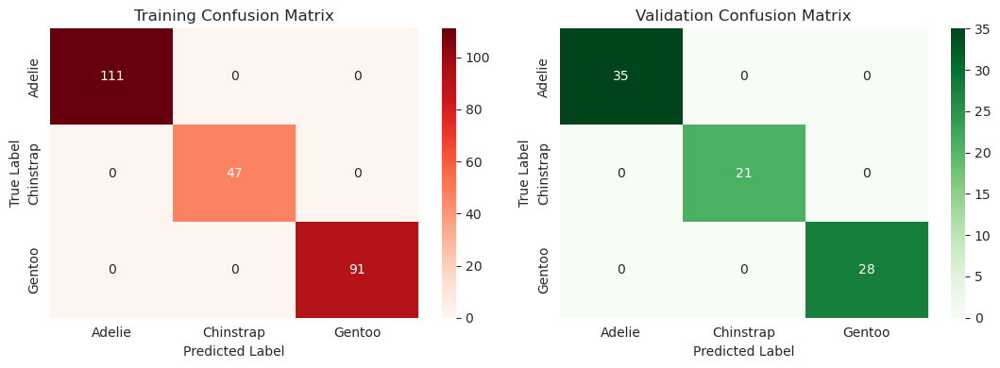



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca1', 'cluster_2', 'cluster_1', 'cluster_0', 'cluster_3', 'cluster_4', 'cluster_5', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	pca0: 0.34285714285714286 +- 0.041513323271815936
	pca1: 0.1976190476190476 +- 0.0357935628056498
	cluster_2: 0.0071428571428571175 +- 0.0058321184351980224
	cluster_1: 0.0023809523809523725 +- 0.004761904761904744
	cluster_0: 0.0 +- 0.0
	cluster_3: 0.0 +- 0.0
	cluster_4: 0.0 +- 0.0
	cluster_5: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



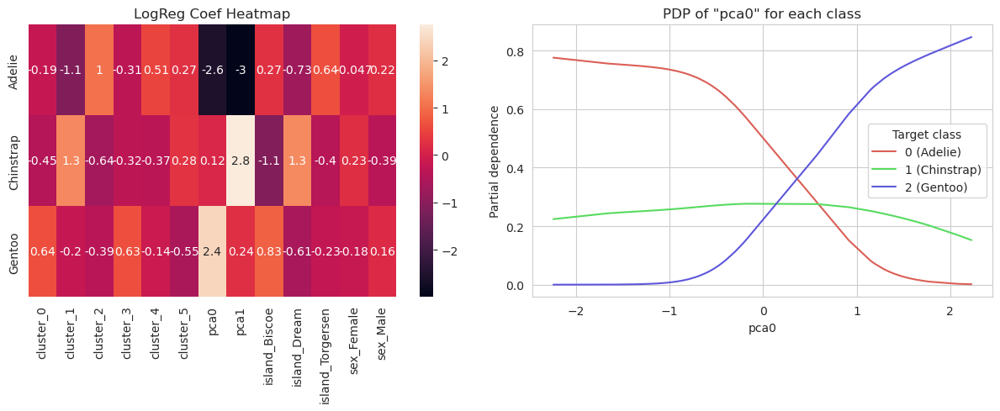

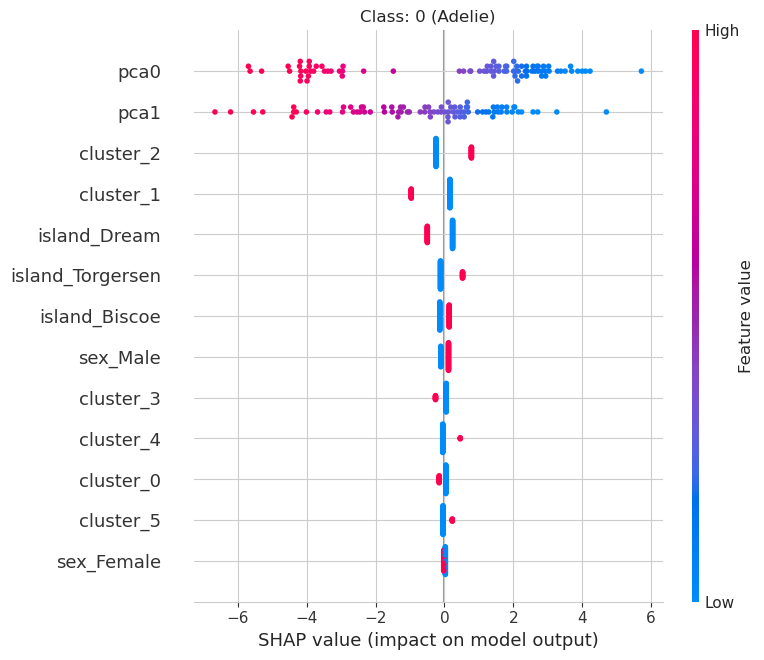

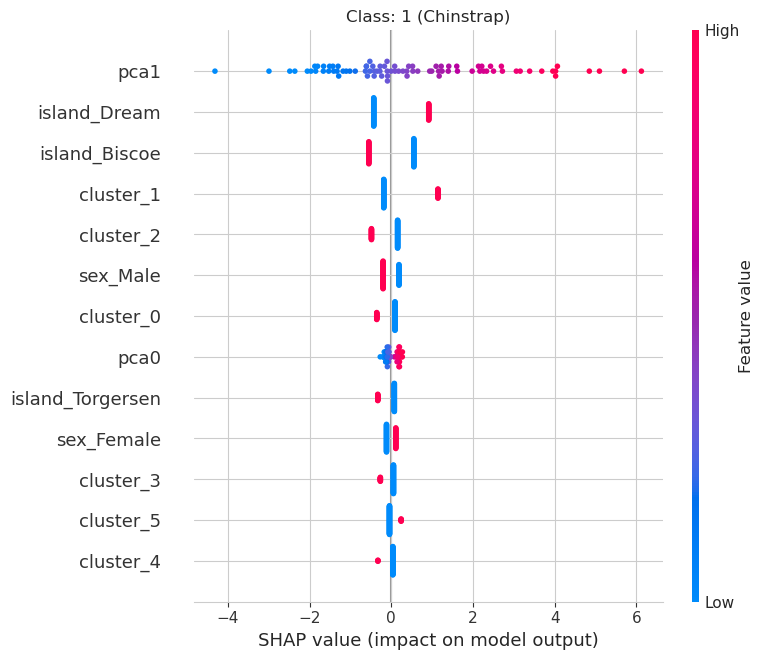

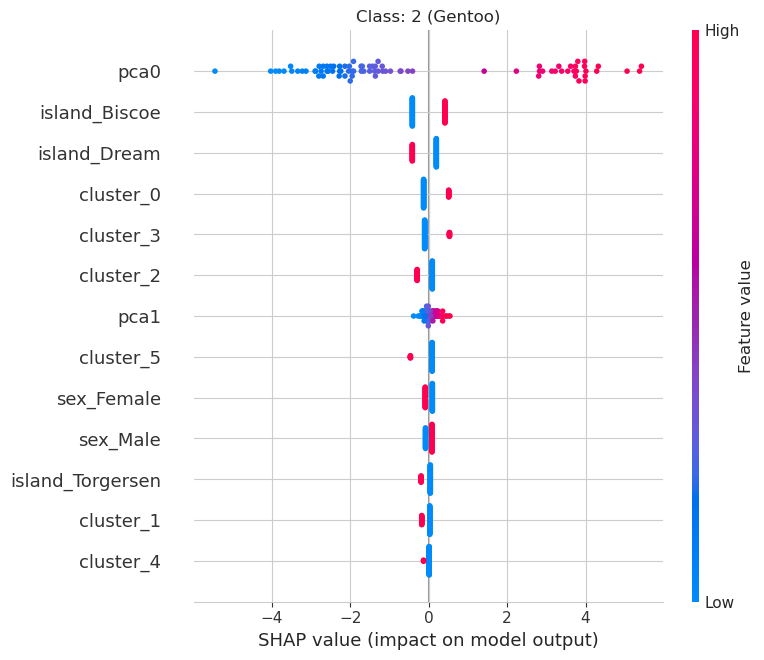

In [128]:
model = 'logreg'

for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [129]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,...,xgbc_eng_no_cv,xgbc_eng_cv,xgbc_clus_no_cv,xgbc_clus_cv,logreg_raw_no_cv,logreg_raw_cv,logreg_eng_no_cv,logreg_eng_cv,logreg_clus_no_cv,logreg_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,1.0,1.0,1.000000,1.0,0.997024,1.0,1.0,1.000000,1.0,1.0
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000,0.984848,0.984848,1.0,...,1.0,1.0,0.984848,1.0,1.000000,1.0,1.0,0.990741,1.0,1.0
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,1.0,1.0,1.000000,1.0,0.992908,1.0,1.0,1.000000,1.0,1.0
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000,0.990476,0.990476,1.0,...,1.0,1.0,0.990476,1.0,1.000000,1.0,1.0,0.988095,1.0,1.0
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968,1.000000,0.991968,1.0,...,1.0,1.0,1.000000,1.0,0.995984,1.0,1.0,1.000000,1.0,1.0
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000,0.988095,0.988095,1.0,...,1.0,1.0,0.988095,1.0,1.000000,1.0,1.0,0.988095,1.0,1.0
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,1.0,1.0,1.000000,1.0,0.994921,1.0,1.0,1.000000,1.0,1.0
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000,0.987417,0.987417,1.0,...,1.0,1.0,0.987417,1.0,1.000000,1.0,1.0,0.989245,1.0,1.0


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [130]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=2,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                                                                     slice(0, -5, None))],
                                                     

In [131]:
best_cv[model+'_clus']['params']

{'model__C': 6.0,
 'model__penalty': 'l2',
 'model__solver': 'lbfgs',
 'preprocessor__cluster__n_clusters': 6,
 'preprocessor__selector__n_features': 2}

In [132]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=2, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c1a37f10>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [133]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g
286     Biscoe  Female         3.093333           0.148085
188      Dream    Male         2.664921           0.273856
70   Torgersen  Female         2.434524           0.185708
173      Dream    Male         2.605263           0.247500
106     Biscoe  Female         2.242938           0.219591
..         ...     ...              ...                ...
203      Dream    Male         2.477387           0.242240
255     Biscoe  Female         3.306569           0.144328
72   Torgersen  Female         2.248447           0.164175
235     Biscoe  Female         3.110345           0.130790
37       Dream  Female         1.945946           0.214839

[249 rows x 4 columns]


In [134]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=2, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c1a37f10>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=6)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [135]:
del best_preproc, best_feats

### Model 5: `SVC`

In [136]:
model = 'svc'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', SVC(random_state=0, probability=True))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', SVC(random_state=0, probability=True))])

    # defining the hyperparameter grid
    param_grid[model_name] = {'model__C': [0.5*i for i in range(1,21)],
                              'model__kernel': ['rbf', 'linear'],
                              'model__gamma': ['scale', 'auto']}
    
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

***************************************************************************
svc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=svc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |     

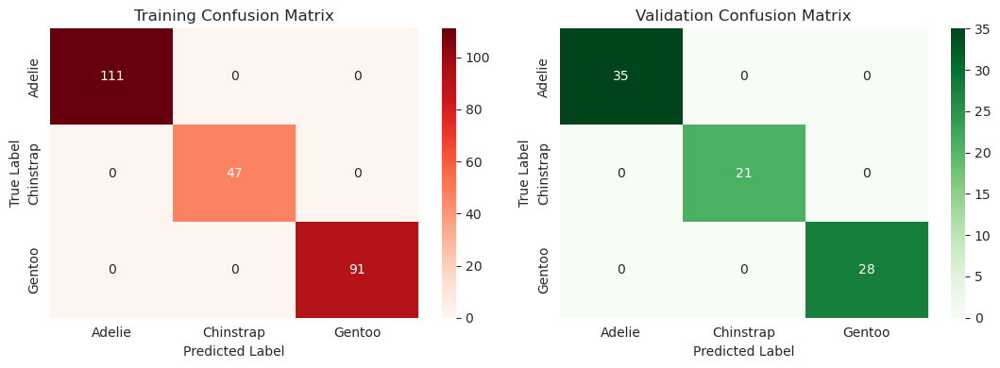






***************************************************************************
svc_raw , 	CV: True 

***************************************************************************
We will evaluate svc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9948491789843459
		best params: {'model__C': 1.5, 'model__gamma': 'scale', 'model__kernel': 'rbf'}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 

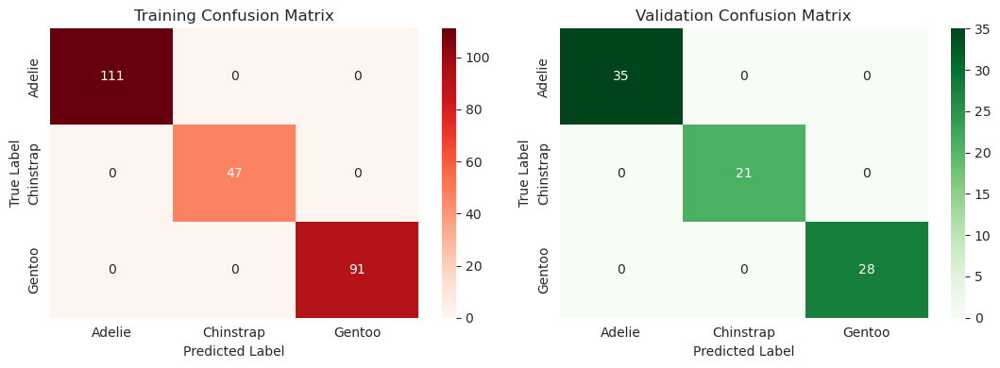



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_length_mm: 0.2571428571428571 +- 0.03579356280564979
	bill_depth_mm: 0.14523809523809525 +- 0.017496355305594145
	flipper_length_mm: 0.011904761904761908 +- 0.01064794274999901
	body_mass_g: 0.00952380952380949 +- 0.004761904761904744
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



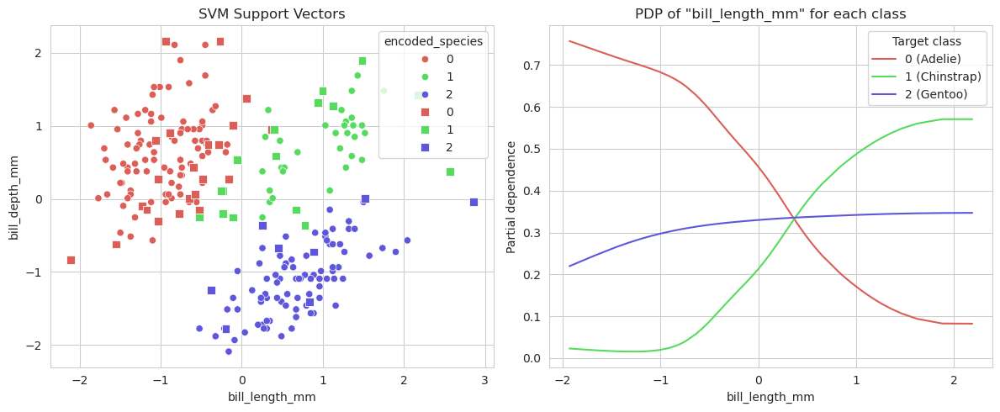

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([ 1.28286454,  1.27515132,  0.92742767,  0.48541896,  0.02350041,
        0.2186091 , -0.01987346,  0.23134792,  0.23134792])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([-1.75497807, -0.06842838, -0.28098997, -0.07761164, -0.10220248,
       -0.43218981,  0.04485832, -0.38311236, -0.38311236])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([-7.02545840e-01, -1.94133091e+00, -1.33650306e+00, -8.24713231e-01,
        6.01406123e-02, -1.99296068e-02, -1.58810274e-03, -6.74754933e-02,
       -6.74754933e-02])
num_full_subsets = 4
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([-0.74808294, -1.96622634, -0.95168801, -0.29461647, -0.18731594,
        0.01964925, -0.11770435, -0.16709423, -0.16709423])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([ 0.13757347, -1.19027985, -0.43829511, -0.45140247, -0.48974203,
       -0.53228115, 

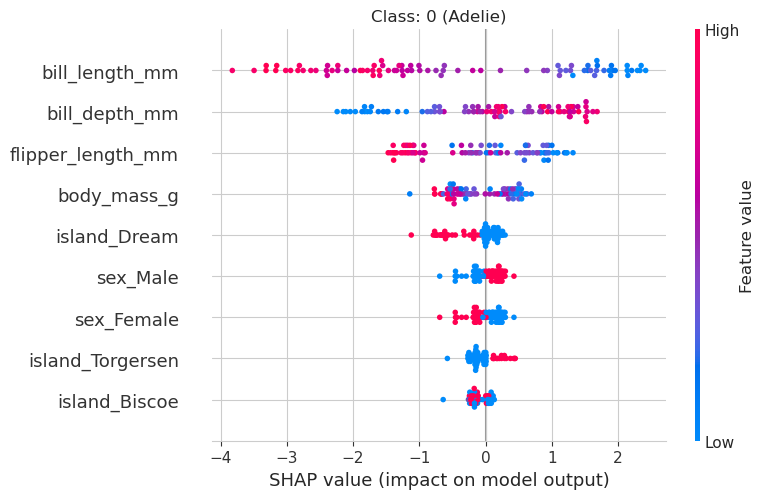

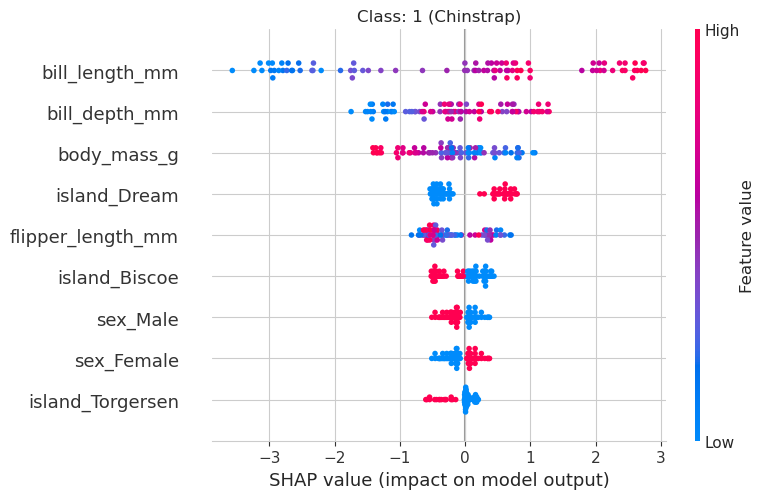

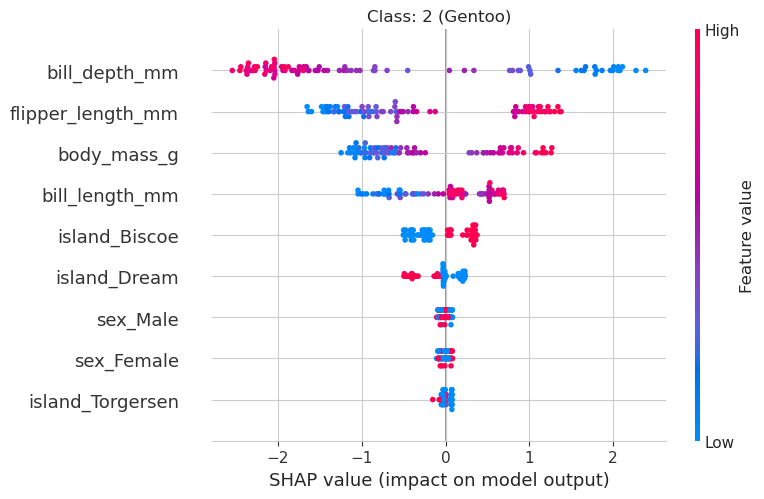




***************************************************************************
svc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=svc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.982301 | 1        |   0.991071 | 111        |
| 1            |    1        | 0.957447 |   0.978261 |  47        |
| 2            |    1        | 1        |   1        |  91        |
| accuracy     |    0.991968 | 0.991968 |   0.991968 |   0.991968 |
| macro avg 

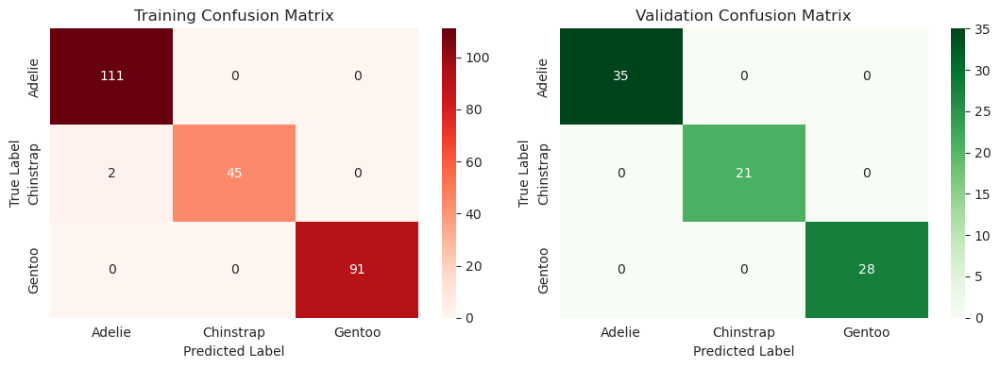






***************************************************************************
svc_eng , 	CV: True 

***************************************************************************
We will evaluate svc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.998313613491092
		best params: {'model__C': 0.5, 'model__gamma': 'auto', 'model__kernel': 'rbf', 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2           

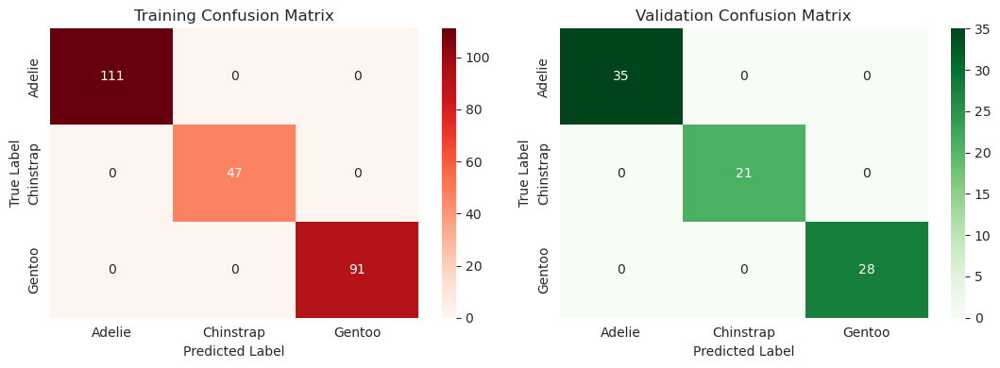



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'feedability_mm2/g', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_elongation: 0.3880952380952381 +- 0.047974861141928275
	feedability_mm2/g: 0.2261904761904762 +- 0.032819163695452916
	island_Biscoe: 0.004761904761904745 +- 0.0058321184351980224
	island_Dream: 0.004761904761904745 +- 0.0058321184351980224
	island_Torgersen: 0.004761904761904745 +- 0.0058321184351980224
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



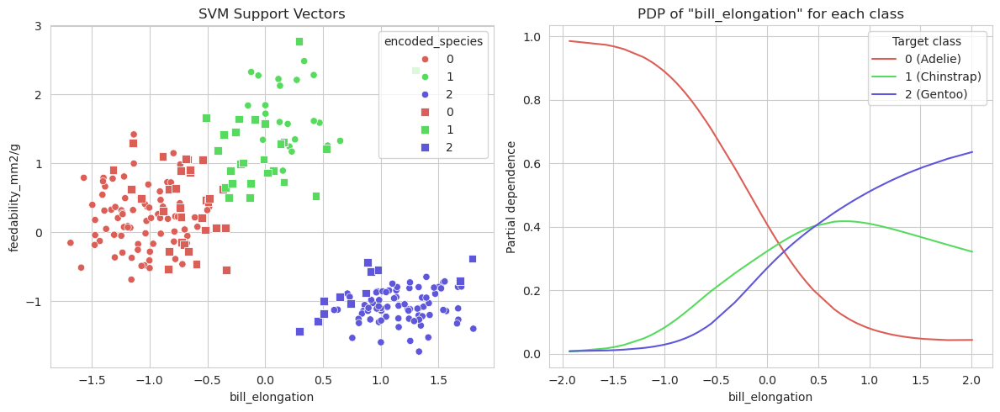

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 3
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([ 2.22838039,  1.33287744, -0.00305259,  0.21334222, -0.02177664,
        0.01891959,  0.01891959])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([-1.03055599, -1.37160288, -0.21928214, -0.60029758,  0.03644497,
       -0.09523715, -0.09523715])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([-2.48678786, -1.20061901,  0.12792065,  0.01841668,  0.01198898,
        0.01853206,  0.01853206])
num_full_subsets = 3
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([-3.39492751, -0.53961731, -0.2885221 , -0.05122374, -0.16445764,
        0.02023044,  0.02023044])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([ 0.70319579, -2.70031062, -0.55974616, -0.5382882 , -0.01263002,
        0.08143512,  0.08143512])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999

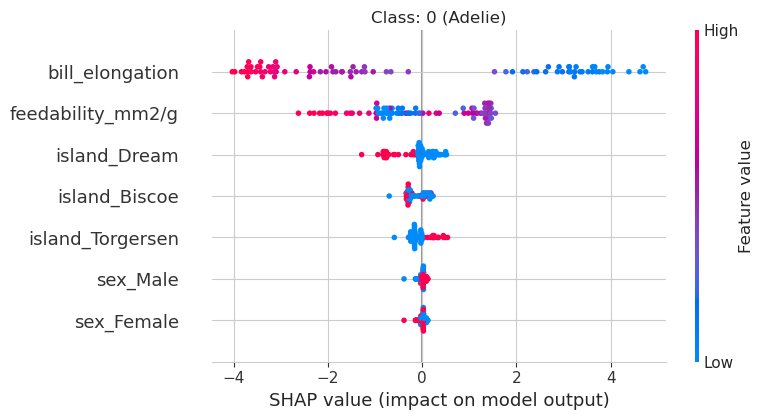

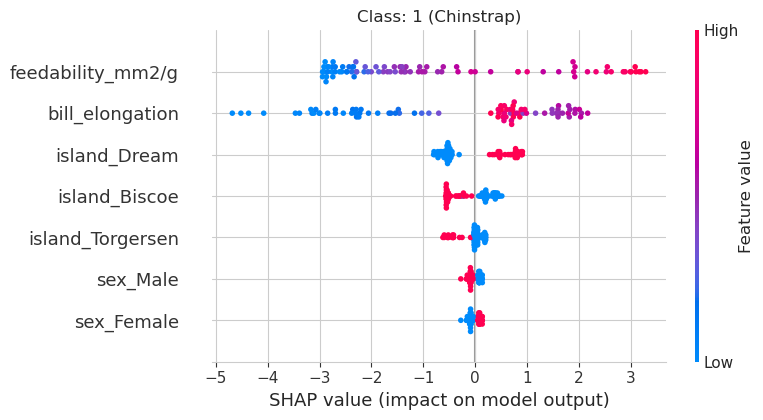

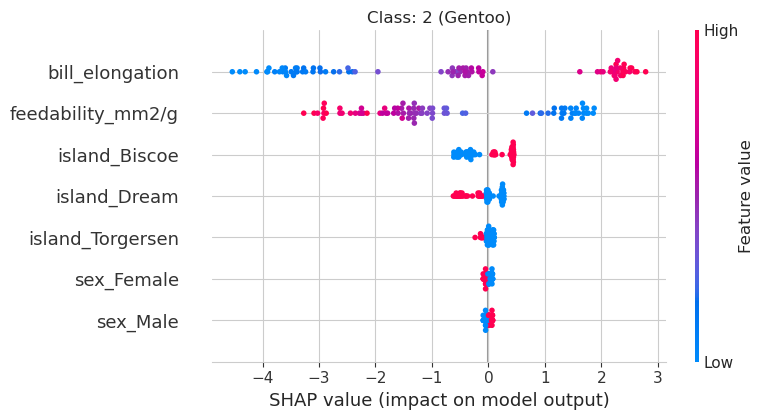




***************************************************************************
svc_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=svc_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.982301 | 1        |   0.991071 | 111        |
| 1            |    1        | 0.957447 |   0.978261 |  47        |
| 2            |    1        | 1        |   1        |  91        |
| accuracy     |    0.991968 | 0.991968 |   0.991968 |   0.991968 |
| macro av

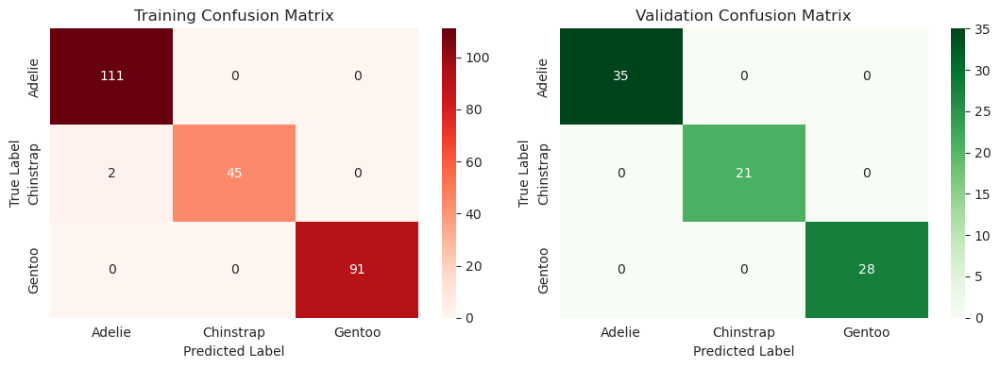






***************************************************************************
svc_clus , 	CV: True 

***************************************************************************
We will evaluate svc_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9967195767195768
		best params: {'model__C': 6.5, 'model__gamma': 'scale', 'model__kernel': 'linear', 'preprocessor__cluster__n_clusters': 5, 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |    

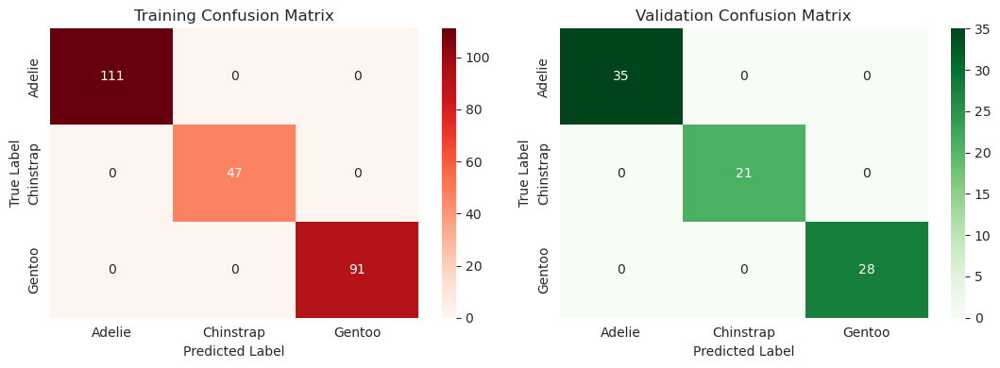



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca1', 'cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	pca0: 0.36666666666666664 +- 0.03941177466011153
	pca1: 0.29523809523809524 +- 0.049601587276189664
	cluster_0: 0.0 +- 0.0
	cluster_1: 0.0 +- 0.0
	cluster_2: 0.0 +- 0.0
	cluster_3: 0.0 +- 0.0
	cluster_4: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



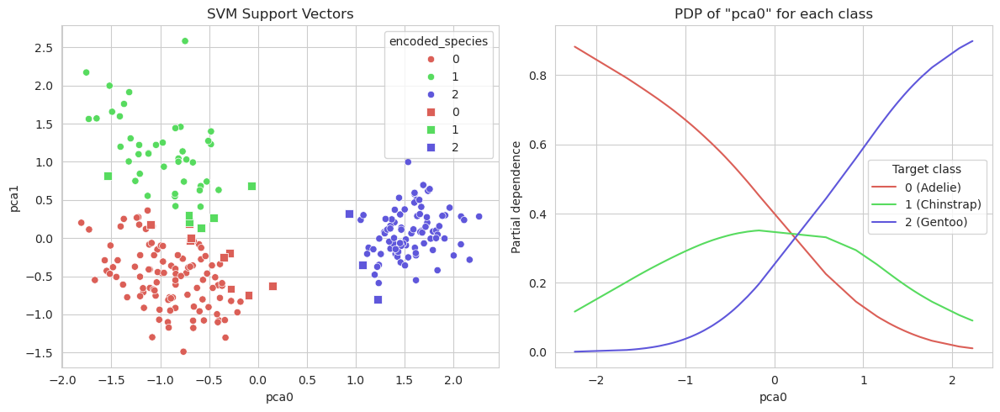

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 3
remaining_weight_vector = array([0.35673839, 0.32616082, 0.31710079])
num_paired_subset_sizes = 5
weight_left = 0.2929005745959313
np.sum(w_aug) = 11.999999999999998
np.sum(self.kernelWeights) = 1.0000000000000007
phi = array([ 0.10182698,  0.03519251,  0.2437632 ,  0.04506228, -0.07383795,
        1.3120968 ,  1.01467173,  0.        ,  0.06368004,  0.        ,
        0.04986835,  0.04585384])
np.sum(w_aug) = 11.999999999999998
np.sum(self.kernelWeights) = 1.0000000000000007
phi = array([ 0.        , -0.11133496, -0.12488371,  0.        ,  0.06556366,
        0.69516262, -1.95367592, -0.09768409, -0.20141335,  0.05169716,
       -0.13509161, -0.13479394])
np.sum(w_aug) = 11.999999999999998
np.sum(self.kernelWeights) = 1.0000000000000007
phi = array([-0.19119936,  0.02083274, -0.33940394, -0.1046362 ,  0.0840638 ,
       -2.07273223, -0.39111761,  0.11776267,  0.03871888,  0.02774054,
        0.        ,  0.        ])
num_full_subsets = 3
remaining_weight_vector = 

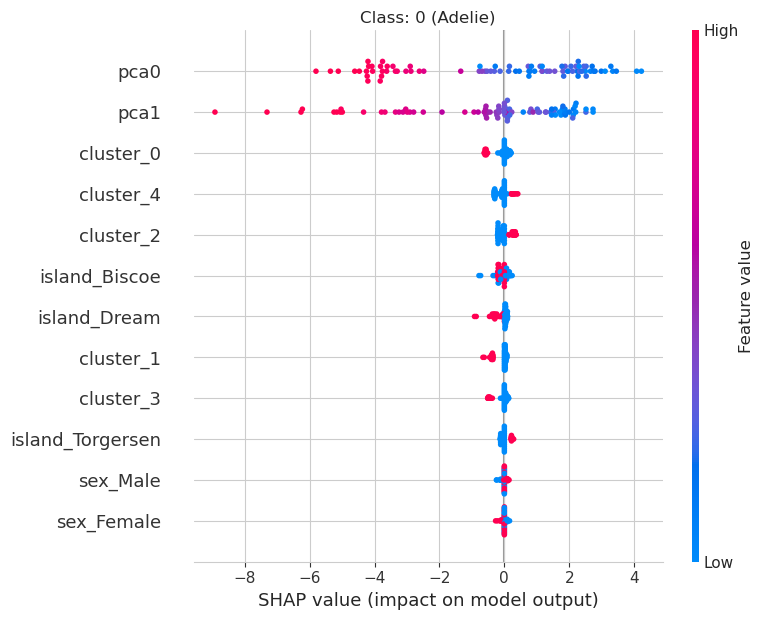

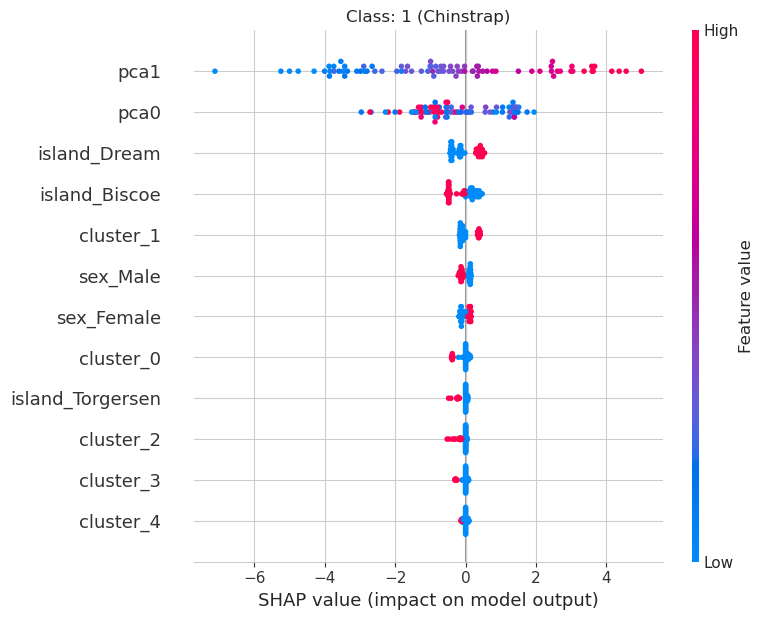

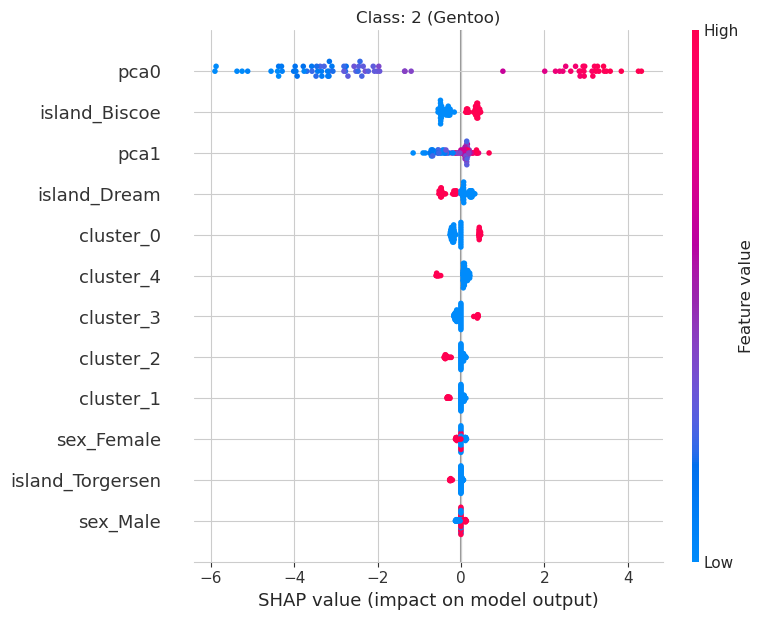

In [137]:
model = 'svc'

for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [138]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,...,logreg_eng_no_cv,logreg_eng_cv,logreg_clus_no_cv,logreg_clus_cv,svc_raw_no_cv,svc_raw_cv,svc_eng_no_cv,svc_eng_cv,svc_clus_no_cv,svc_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,1.0,1.000000,1.0,1.0,1.0,1.0,0.994100,1.0,0.994100,1.0
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000,0.984848,0.984848,1.0,...,1.0,0.990741,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,1.0
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,1.0,1.000000,1.0,1.0,1.0,1.0,0.985816,1.0,0.985816,1.0
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000,0.990476,0.990476,1.0,...,1.0,0.988095,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,1.0
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968,1.000000,0.991968,1.0,...,1.0,1.000000,1.0,1.0,1.0,1.0,0.991968,1.0,0.991968,1.0
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000,0.988095,0.988095,1.0,...,1.0,0.988095,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,1.0
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,1.0,1.000000,1.0,1.0,1.0,1.0,0.989777,1.0,0.989777,1.0
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000,0.987417,0.987417,1.0,...,1.0,0.989245,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,1.0


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [139]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=2,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                                                                     slice(0, -5, None))],
                                                     

In [140]:
best_cv[model+'_clus']['params']

{'model__C': 6.5,
 'model__gamma': 'scale',
 'model__kernel': 'linear',
 'preprocessor__cluster__n_clusters': 5,
 'preprocessor__selector__n_features': 2}

In [141]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=2, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9b8a39ed0>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [142]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g
286     Biscoe  Female         3.093333           0.148085
188      Dream    Male         2.664921           0.273856
70   Torgersen  Female         2.434524           0.185708
173      Dream    Male         2.605263           0.247500
106     Biscoe  Female         2.242938           0.219591
..         ...     ...              ...                ...
203      Dream    Male         2.477387           0.242240
255     Biscoe  Female         3.306569           0.144328
72   Torgersen  Female         2.248447           0.164175
235     Biscoe  Female         3.110345           0.130790
37       Dream  Female         1.945946           0.214839

[249 rows x 4 columns]


In [143]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=2, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9b8a39ed0>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=5)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [144]:
del best_preproc, best_feats

### Model 6: `KNeighborsClassifier`

In [145]:
model = 'knn'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', KNeighborsClassifier())])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', KNeighborsClassifier())])

    # defining the hyperparameter grid
    param_grid[model_name] = {'model__n_neighbors': list(range(3, 11)),
                              'model__weights': ['uniform', 'distance'],
                              'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                              'model__leaf_size': [5*i for i in range(1, 4)],
                              'model__p': [1, 2]}
    
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

***************************************************************************
knn_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=knn_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 0.972973 |   0.986301 | 111        |
| 1            |    0.94     | 1        |   0.969072 |  47        |
| 2            |    1        | 1        |   1        |  91        |
| accuracy     |    0.987952 | 0.987952 |   0.987952 |   0.987952 |
| macro avg    

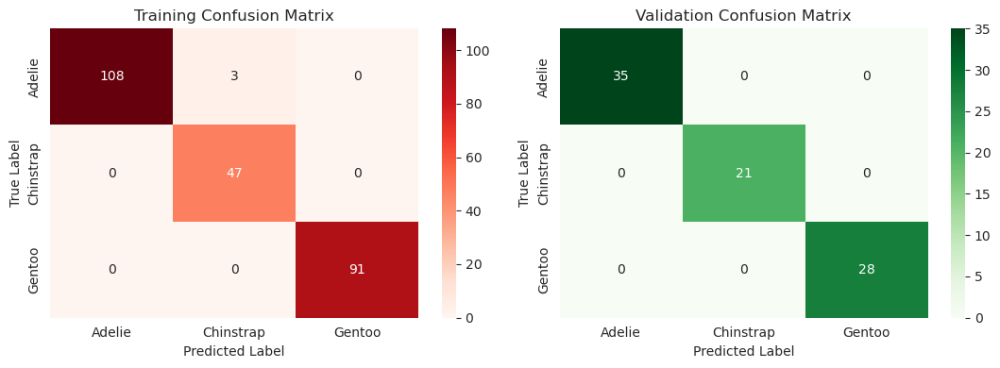






***************************************************************************
knn_raw , 	CV: True 

***************************************************************************
We will evaluate knn_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9930563286806836
		best params: {'model__algorithm': 'auto', 'model__leaf_size': 5, 'model__n_neighbors': 10, 'model__p': 2, 'model__weights': 'uniform'}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.991071 | 1        |   0.995516 | 111        |
| 1            |    1        | 0.978723 |   0.989247 |  47    

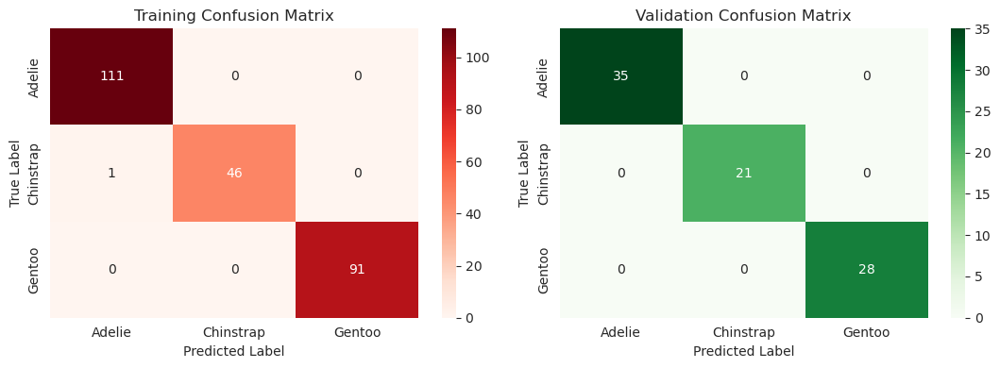



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_length_mm', 'bill_depth_mm', 'body_mass_g', 'flipper_length_mm', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_length_mm: 0.2785714285714286 +- 0.034173095462874586
	bill_depth_mm: 0.09999999999999998 +- 0.00952380952380949
	body_mass_g: 0.011904761904761885 +- 0.007529232524210435
	flipper_length_mm: 0.009523809523809513 +- 0.008908708063747484
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



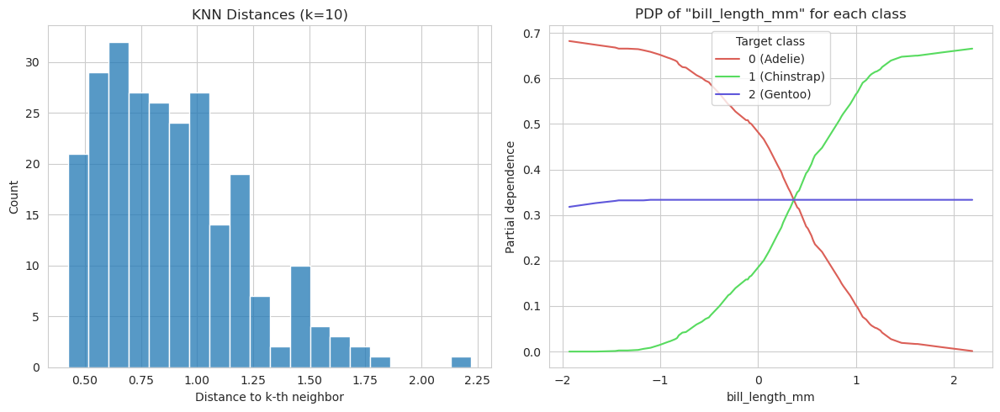

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([ 8.31368102,  8.31971598,  7.90152681,  7.40647795,  0.61588183,
        0.63224164, -0.02009895,  0.67707468,  0.67707468])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([-16.80623773,   0.22184472,  -1.4798302 ,  -1.15253404,
        -2.96280586,  -3.00062114,   0.06300134,  -3.7863378 ,
        -3.7863378 ])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([ -0.25729122, -11.73545146, -11.21884652, -10.69694092,
         0.        ,   0.        ,   0.        ,  -0.02744106,
        -0.02744106])
num_full_subsets = 4
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([ -9.96520089, -12.04288405, -10.05109663,  -1.03349682,
        -0.58477397,   0.04322322,  -0.56226756,  -0.17914002,
        -0.17914002])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([  0.23813468, -14.84330155,  -5.83770263,  -5.76248096,
        -3.46073049,  -3

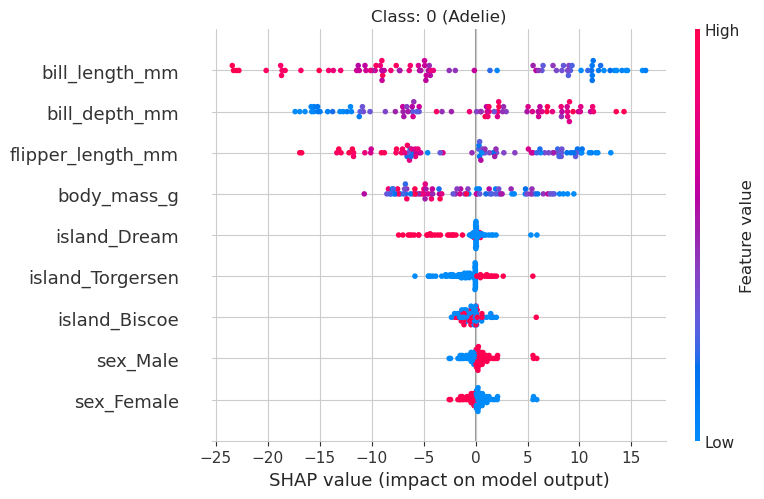

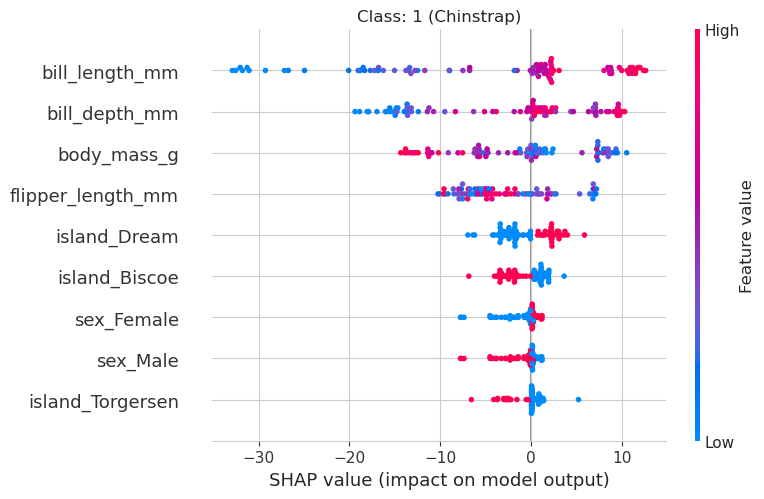

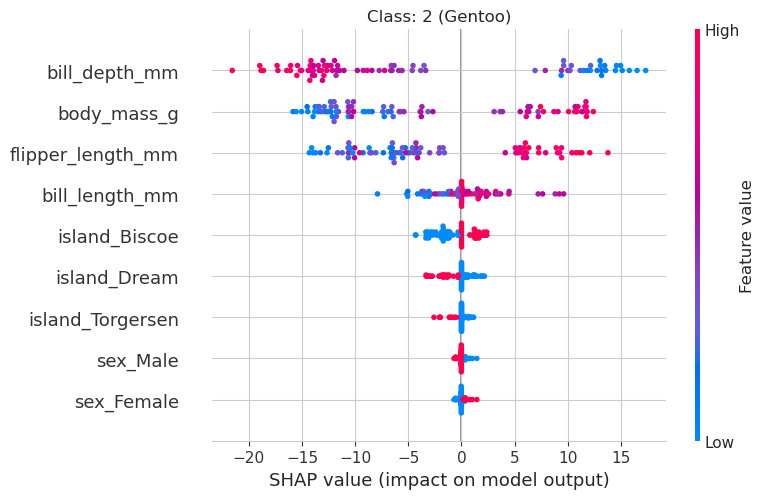




***************************************************************************
knn_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=knn_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 0.990991 |   0.995475 | 111        |
| 1            |    0.979167 | 1        |   0.989474 |  47        |
| 2            |    1        | 1        |   1        |  91        |
| accuracy     |    0.995984 | 0.995984 |   0.995984 |   0.995984 |
| macro avg 

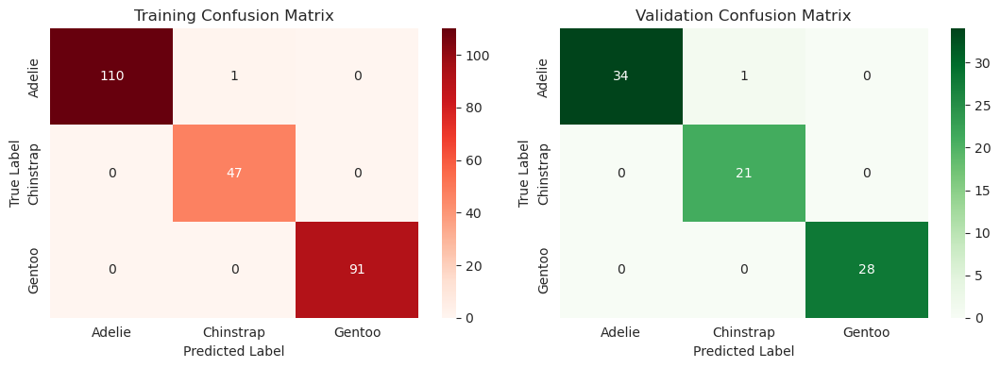






***************************************************************************
knn_eng , 	CV: True 

***************************************************************************
We will evaluate knn_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 1.0
		best params: {'model__algorithm': 'auto', 'model__leaf_size': 5, 'model__n_neighbors': 5, 'model__p': 1, 'model__weights': 'uniform', 'preprocessor__selector__n_features': 3}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 

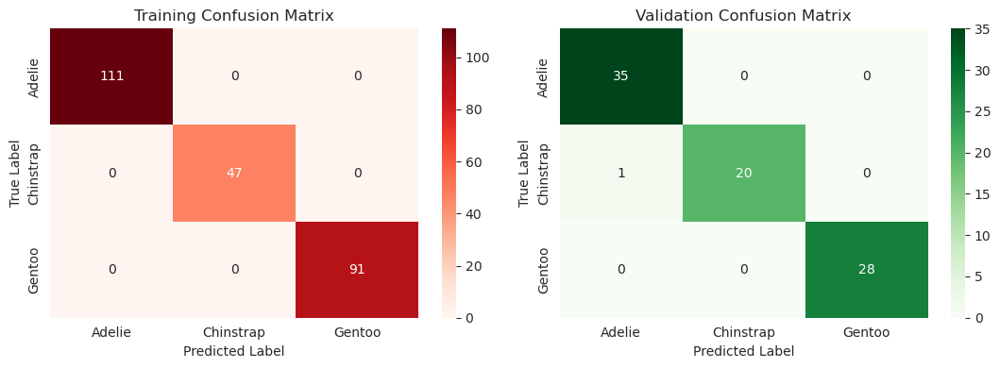



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'feedability_mm2/g', 'flipper_length_mm', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_elongation: 0.13571428571428576 +- 0.02564364193873575
	feedability_mm2/g: 0.12142857142857148 +- 0.037946136786926724
	flipper_length_mm: 0.014285714285714346 +- 0.011664236870396113
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: -0.004761904761904745 +- 0.0058321184351980224
	sex_Male: -0.004761904761904745 +- 0.0058321184351980224

****************************************************************************************************



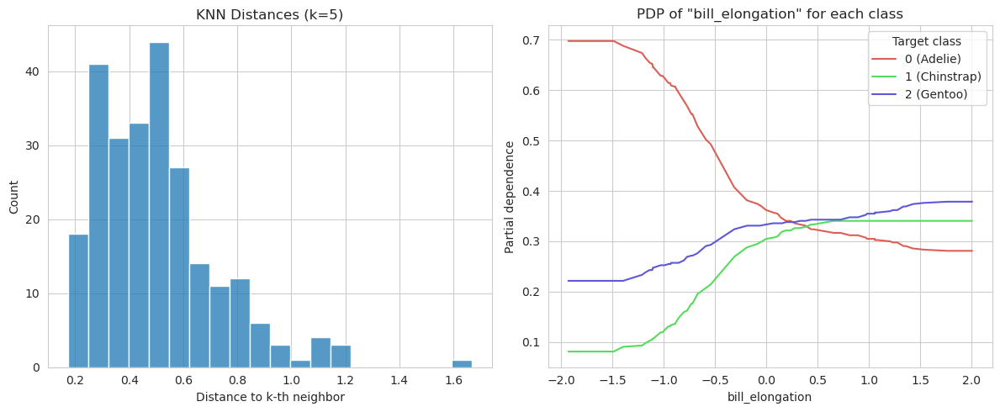

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 1.31981592e+01,  5.10544328e+00,  1.27580564e+01,  1.66758850e+00,
        1.70647700e+00, -7.73966377e-04,  5.23128075e-02,  5.23128075e-02])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-6.07581193e+00, -1.19503778e+01, -3.31489949e+00, -4.09842459e+00,
       -4.68958249e+00,  2.60246008e-03, -1.29849629e+00, -1.29849629e+00])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-1.68681946e+01, -6.03197164e-01, -1.64406140e+01, -6.56442584e-15,
        1.20903287e-14,  0.00000000e+00, -2.57032252e-02, -2.57032252e-02])
num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-18.61475163,  -3.74407739,  -5.83998735,  -2.76902641,
        -0.61597699,  -1.7993104 ,  -0.57782311,  -0.57782311])
np.sum(w_aug) = 8.00000000

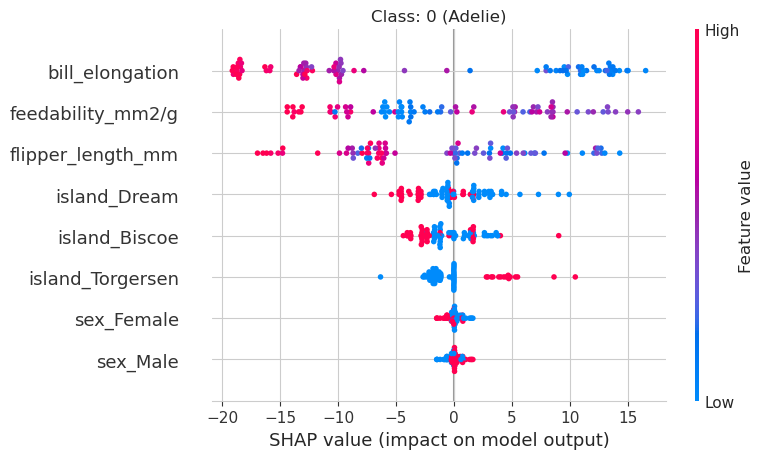

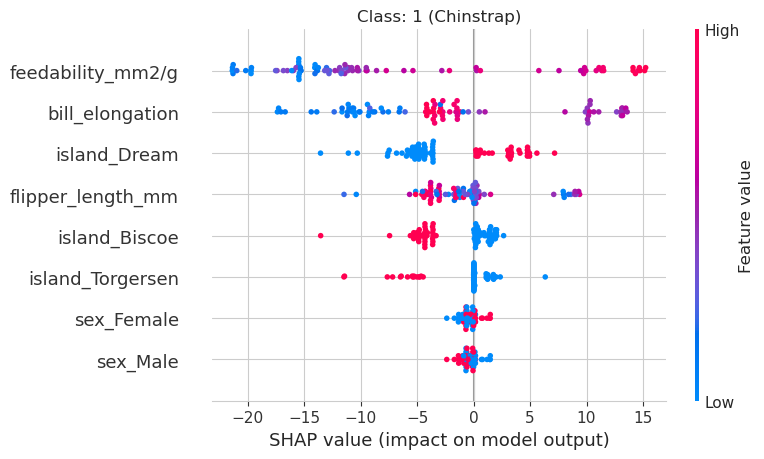

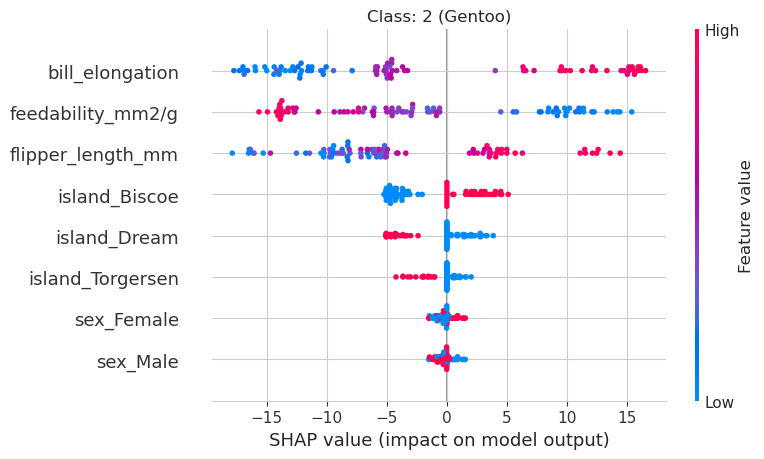




***************************************************************************
knn_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=knn_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |

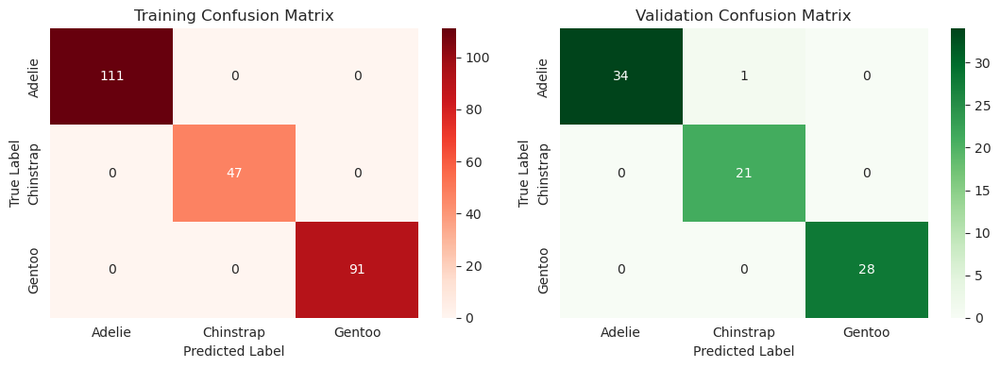






***************************************************************************
knn_clus , 	CV: True 

***************************************************************************
We will evaluate knn_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.998313613491092
		best params: {'model__algorithm': 'auto', 'model__leaf_size': 5, 'model__n_neighbors': 3, 'model__p': 2, 'model__weights': 'distance', 'preprocessor__cluster__n_clusters': 5, 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |         

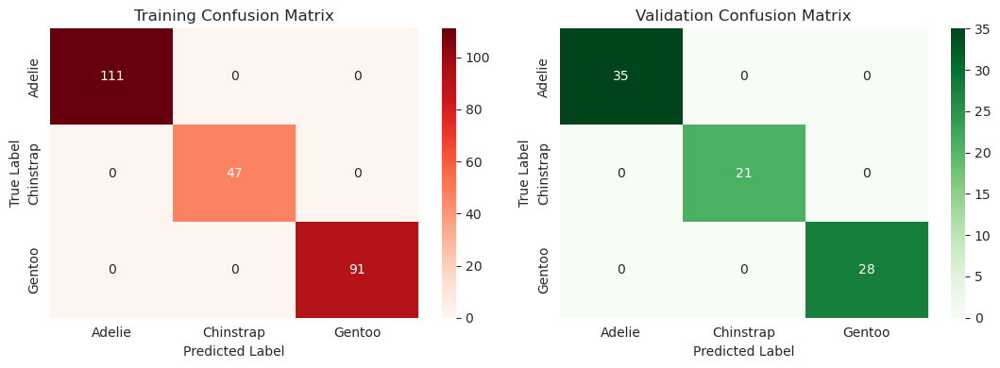



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca1', 'cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	pca0: 0.3023809523809524 +- 0.022080044036894533
	pca1: 0.07857142857142856 +- 0.026726124191242432
	cluster_0: 0.0 +- 0.0
	cluster_1: 0.0 +- 0.0
	cluster_2: 0.0 +- 0.0
	cluster_3: 0.0 +- 0.0
	cluster_4: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



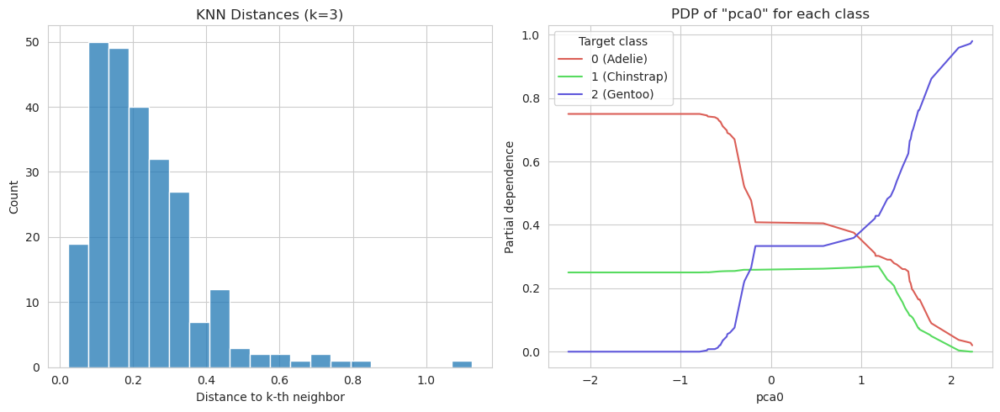

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 3
remaining_weight_vector = array([0.35673839, 0.32616082, 0.31710079])
num_paired_subset_sizes = 5
weight_left = 0.2929005745959313
np.sum(w_aug) = 12.0
np.sum(self.kernelWeights) = 1.0000000000000007
phi = array([-0.26791366,  3.05945676,  2.51417349,  0.        ,  0.21477362,
       16.35462954,  8.44543632,  1.70064062,  1.61963055,  0.        ,
        0.37058458,  0.52816416])
np.sum(w_aug) = 12.0
np.sum(self.kernelWeights) = 1.0000000000000007
phi = array([  0.        ,  -6.43896823,  -4.31194499,   0.31317067,
        -0.39737194,  -0.0776066 , -14.70895434,  -2.85686846,
        -2.69260214,   0.        ,  -0.70168613,  -0.85065428])
np.sum(w_aug) = 12.0
np.sum(self.kernelWeights) = 1.0000000000000007
phi = array([ 0.00000000e+00,  4.97367560e-02, -2.89919575e+00, -2.85282668e+00,
        0.00000000e+00, -2.57645496e+01, -2.77067784e+00,  3.31548848e-02,
        1.11064316e-01, -9.10050291e-02,  1.52605372e-02,  2.05626104e-01])
num_full_subsets = 3
remainin

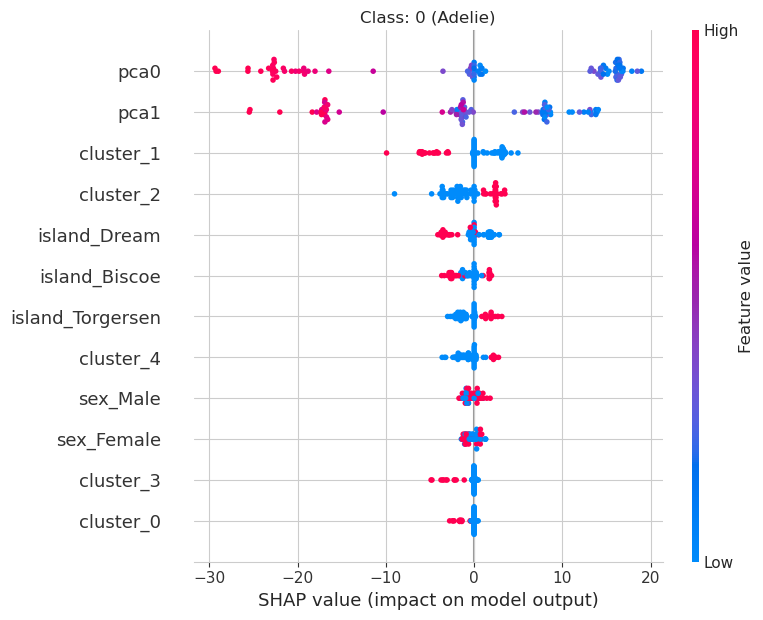

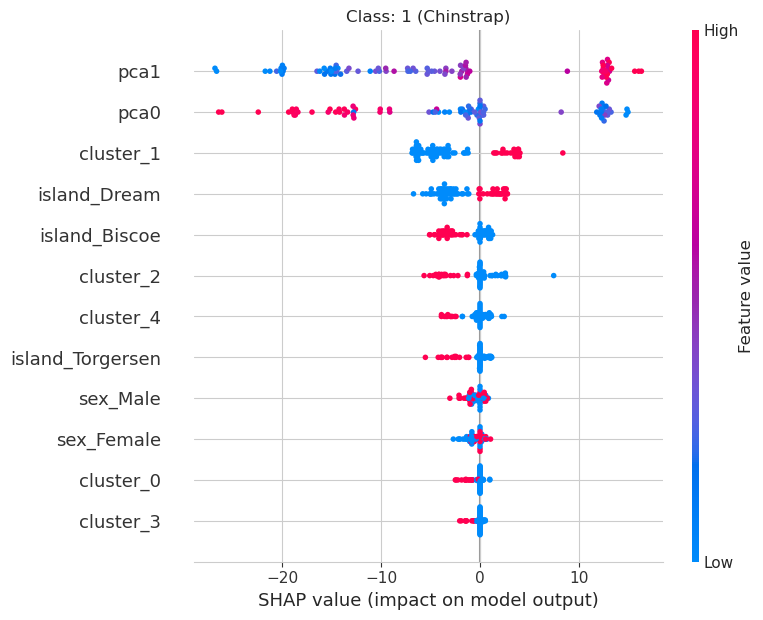

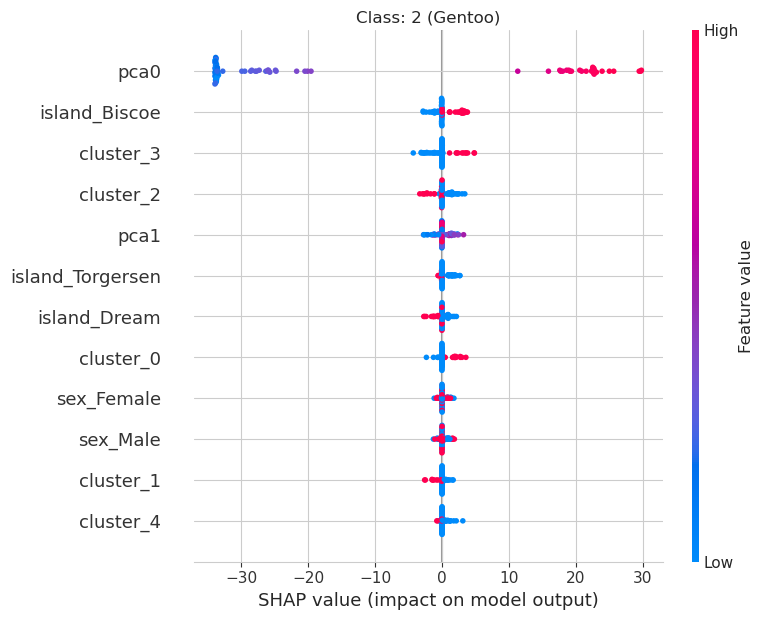

In [146]:
model = 'knn'

for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [147]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,...,svc_eng_no_cv,svc_eng_cv,svc_clus_no_cv,svc_clus_cv,knn_raw_no_cv,knn_raw_cv,knn_eng_no_cv,knn_eng_cv,knn_clus_no_cv,knn_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.994100,1.0,0.994100,1.0,0.980000,0.997024,0.993056,1.000000,1.000000,1.0
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000,0.984848,0.984848,1.0,...,1.000000,1.0,1.000000,1.0,1.000000,1.000000,0.984848,0.990741,0.984848,1.0
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.985816,1.0,0.985816,1.0,0.990991,0.992908,0.996997,1.000000,1.000000,1.0
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000,0.990476,0.990476,1.0,...,1.000000,1.0,1.000000,1.0,1.000000,1.000000,0.990476,0.984127,0.990476,1.0
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968,1.000000,0.991968,1.0,...,0.991968,1.0,0.991968,1.0,0.987952,0.995984,0.995984,1.000000,1.000000,1.0
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000,0.988095,0.988095,1.0,...,1.000000,1.0,1.000000,1.0,1.000000,1.000000,0.988095,0.988095,0.988095,1.0
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.989777,1.0,0.989777,1.0,0.985125,0.994921,0.994983,1.000000,1.000000,1.0
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000,0.987417,0.987417,1.0,...,1.000000,1.0,1.000000,1.0,1.000000,1.000000,0.987417,0.987175,0.987417,1.0


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [148]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=2,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                                                                     slice(0, -5, None))],
                                                     

In [149]:
best_cv[model+'_clus']['params']

{'model__algorithm': 'auto',
 'model__leaf_size': 5,
 'model__n_neighbors': 3,
 'model__p': 2,
 'model__weights': 'distance',
 'preprocessor__cluster__n_clusters': 5,
 'preprocessor__selector__n_features': 2}

In [150]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=2, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c1235ed0>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [151]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g
286     Biscoe  Female         3.093333           0.148085
188      Dream    Male         2.664921           0.273856
70   Torgersen  Female         2.434524           0.185708
173      Dream    Male         2.605263           0.247500
106     Biscoe  Female         2.242938           0.219591
..         ...     ...              ...                ...
203      Dream    Male         2.477387           0.242240
255     Biscoe  Female         3.306569           0.144328
72   Torgersen  Female         2.248447           0.164175
235     Biscoe  Female         3.110345           0.130790
37       Dream  Female         1.945946           0.214839

[249 rows x 4 columns]


In [152]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=2, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c1235ed0>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=5)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [153]:
del best_preproc, best_feats

### Model 7: `GaussianNB`

In [154]:
model = 'gnb'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', GaussianNB())])
    
    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', GaussianNB())])

    # defining the hyperparameter grid
    param_grid[model_name] = {'model__var_smoothing': np.logspace(0,-9, num=100)}
    
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

***************************************************************************
gnb_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=gnb_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 0.315315 |   0.479452 | 111        |
| 1            |    0.51087  | 1        |   0.676259 |  47        |
| 2            |    0.745902 | 1        |   0.85446  |  91        |
| accuracy     |    0.694779 | 0.694779 |   0.694779 |   0.694779 |
| macro avg    

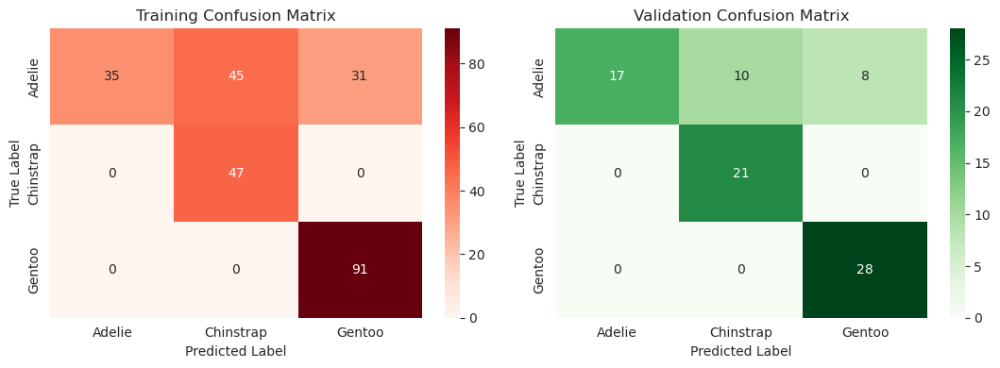






***************************************************************************
gnb_raw , 	CV: True 

***************************************************************************
We will evaluate gnb_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9681690340260759
		best params: {'model__var_smoothing': 0.533669923120631}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.956522 | 0.990991 |   0.973451 | 111        |
| 1            |    0.976744 | 0.893617 |   0.933333 |  47        |
| 2            |    1        | 1        |   1        |  91        |
| ac

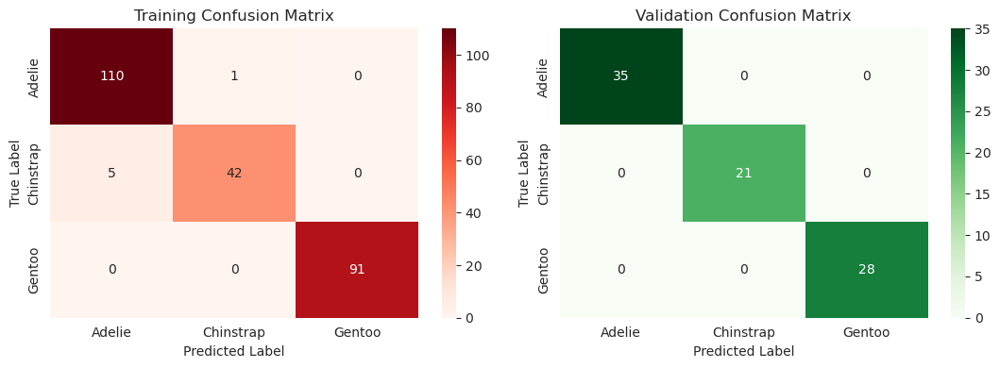



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'island_Dream', 'island_Torgersen', 'body_mass_g', 'island_Biscoe', 'sex_Female', 'sex_Male']
The most important features are:

	bill_length_mm: 0.3 +- 0.03941177466011153
	bill_depth_mm: 0.06904761904761905 +- 0.020481726826291975
	flipper_length_mm: 0.030952380952380953 +- 0.016148404721726836
	island_Dream: 0.02857142857142856 +- 0.009523809523809528
	island_Torgersen: 0.01428571428571428 +- 0.008908708063747495
	body_mass_g: 0.004761904761904745 +- 0.0058321184351980224
	island_Biscoe: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



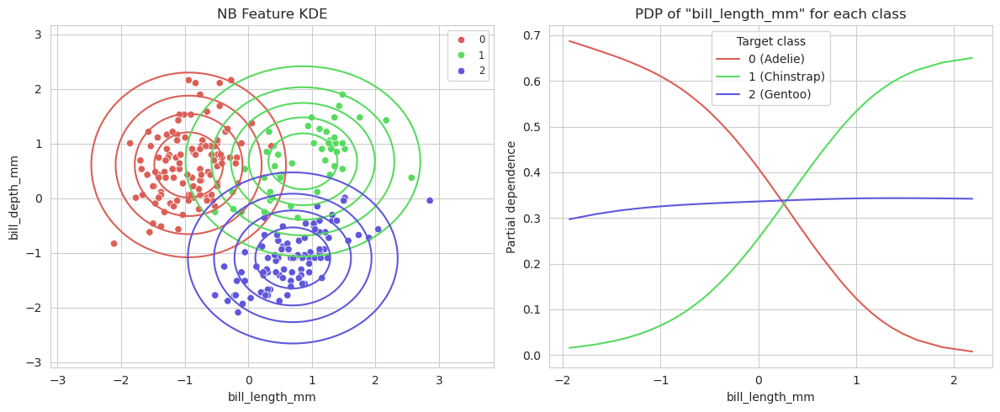




***************************************************************************
gnb_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=gnb_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 0.585586 |   0.738636 | 111        |
| 1            |    0.51087  | 1        |   0.676259 |  47        |
| 2            |    0.98913  | 1        |   0.994536 |  91        |
| accuracy     |    0.815261 | 0.815261 |   0.815261 |   0.815261 |
| macro avg 

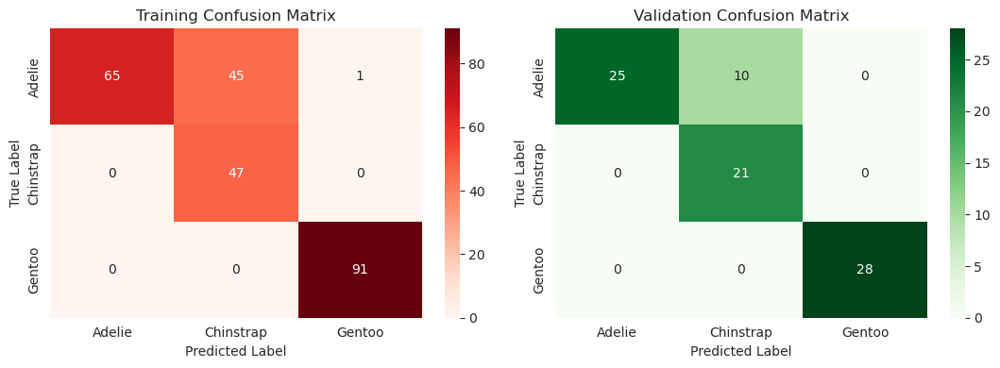






***************************************************************************
gnb_eng , 	CV: True 

***************************************************************************
We will evaluate gnb_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9948721476894851
		best params: {'model__var_smoothing': 0.23101297000831597, 'preprocessor__selector__n_features': 3}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.991071 | 1        |   0.995516 | 111        |
| 1            |    1        | 0.978723 |   0.989247 |  47        |
| 2            |    1        

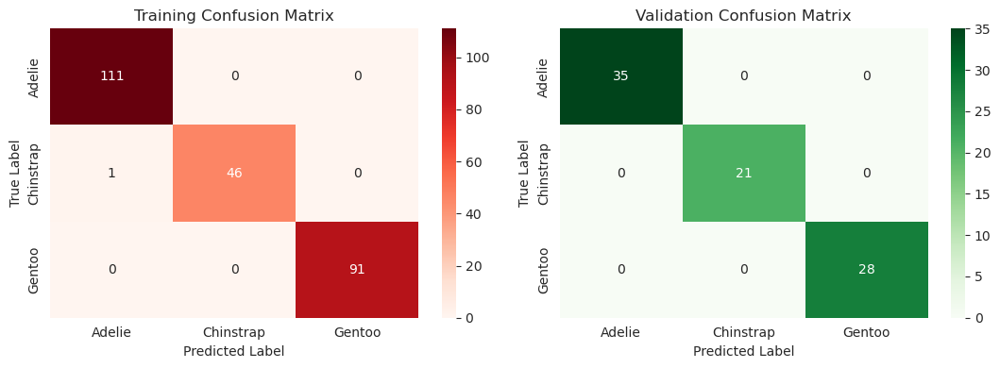



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'feedability_mm2/g', 'flipper_length_mm', 'island_Dream', 'island_Biscoe', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_elongation: 0.26428571428571423 +- 0.03642156795423417
	feedability_mm2/g: 0.16904761904761906 +- 0.02308418979722062
	flipper_length_mm: 0.023809523809523815 +- 0.013041013273932563
	island_Dream: 0.021428571428571398 +- 0.011664236870396099
	island_Biscoe: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



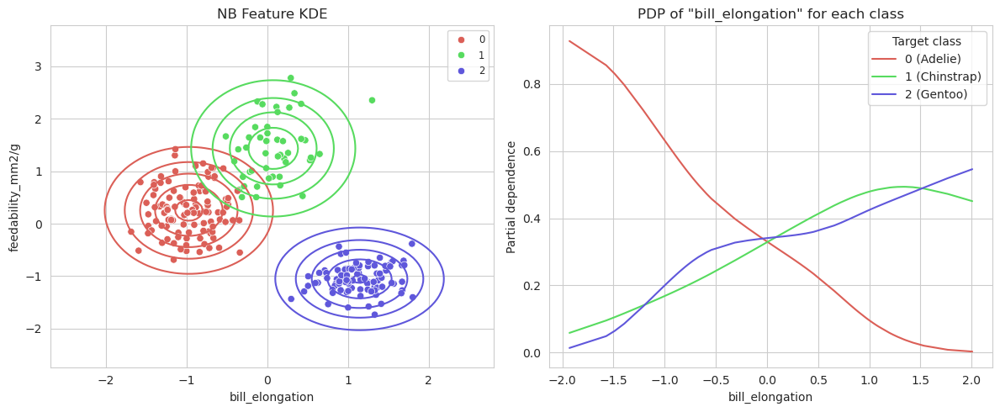




***************************************************************************
gnb_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=gnb_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 0.594595 |   0.745763 | 111        |
| 1            |    0.51087  | 1        |   0.676259 |  47        |
| 2            |    1        | 1        |   1        |  91        |
| accuracy     |    0.819277 | 0.819277 |   0.819277 |   0.819277 |
| macro av

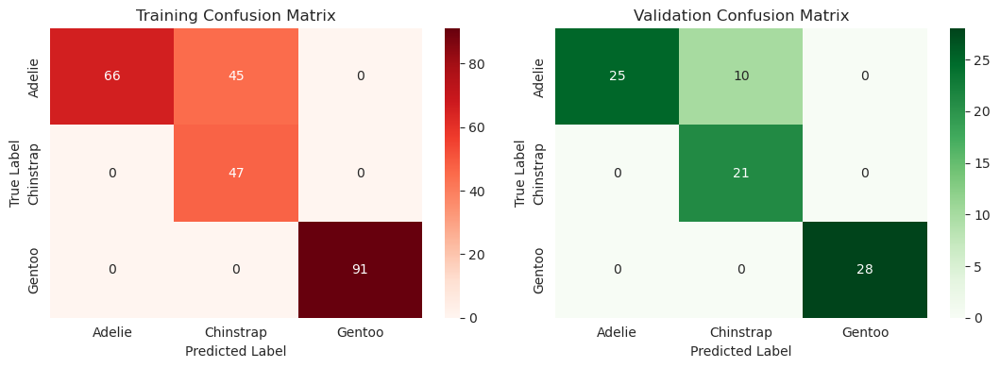






***************************************************************************
gnb_clus , 	CV: True 

***************************************************************************
We will evaluate gnb_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9880579088700624
		best params: {'model__var_smoothing': 0.1873817422860384, 'preprocessor__cluster__n_clusters': 3, 'preprocessor__selector__n_features': 3}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.990991 | 0.990991 |   0.990991 | 111        |
| 1            |    0.978723 | 0.978723 |   0.978723 |  

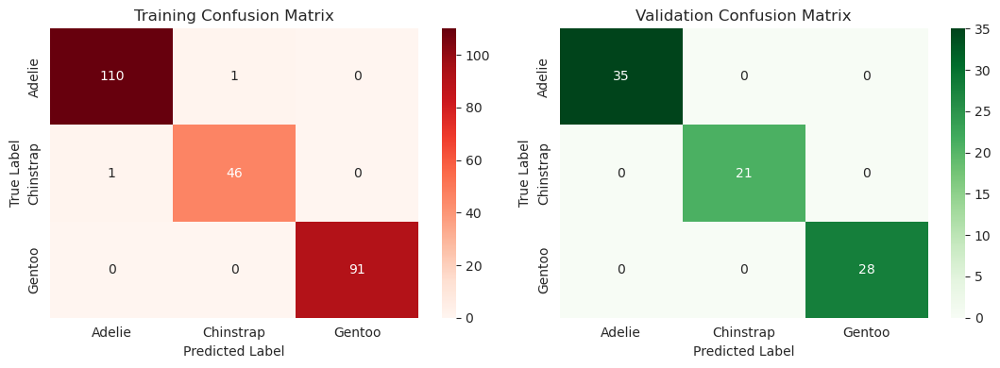



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca1', 'cluster_0', 'cluster_1', 'cluster_2', 'pca2', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	pca0: 0.39761904761904765 +- 0.03247186118329963
	pca1: 0.06904761904761905 +- 0.026513163632523904
	cluster_0: 0.0 +- 0.0
	cluster_1: 0.0 +- 0.0
	cluster_2: 0.0 +- 0.0
	pca2: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



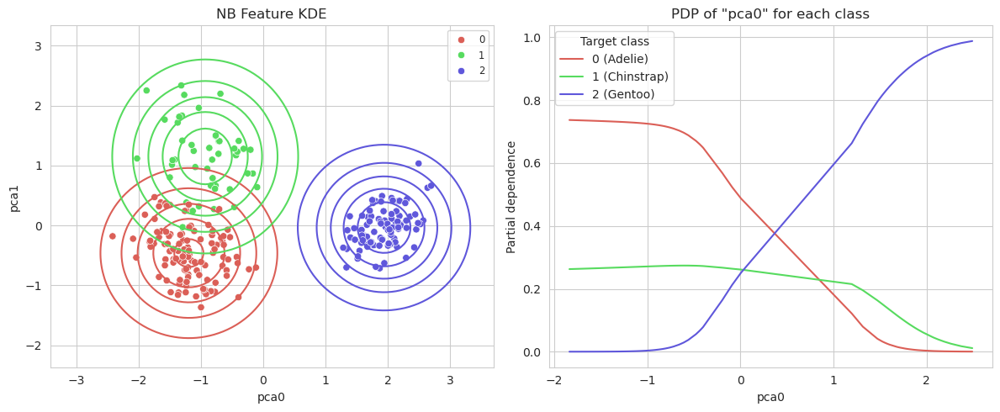

In [155]:
model = 'gnb'

for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [156]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,...,knn_eng_no_cv,knn_eng_cv,knn_clus_no_cv,knn_clus_cv,gnb_raw_no_cv,gnb_raw_cv,gnb_eng_no_cv,gnb_eng_cv,gnb_clus_no_cv,gnb_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.993056,1.000000,1.000000,1.0,0.752257,0.977755,0.833333,0.997024,0.836957,0.989905
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000,0.984848,0.984848,1.0,...,0.984848,0.990741,0.984848,1.0,0.818399,1.000000,0.892473,1.000000,0.892473,1.000000
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.996997,1.000000,1.000000,1.0,0.771772,0.961536,0.861862,0.992908,0.864865,0.989905
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000,0.990476,0.990476,1.0,...,0.990476,0.984127,0.990476,1.0,0.828571,1.000000,0.904762,1.000000,0.904762,1.000000
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968,1.000000,0.991968,1.0,...,0.995984,1.000000,1.000000,1.0,0.694779,0.975904,0.815261,0.995984,0.819277,0.991968
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000,0.988095,0.988095,1.0,...,0.988095,0.988095,0.988095,1.0,0.785714,1.000000,0.880952,1.000000,0.880952,1.000000
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.994983,1.000000,1.000000,1.0,0.670057,0.968928,0.803144,0.994921,0.807341,0.989905
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000,0.987417,0.987417,1.0,...,0.987417,0.987175,0.987417,1.0,0.778846,1.000000,0.880342,1.000000,0.880342,1.000000


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [157]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=3,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                                                                     PCA(random_state=0),
                                                      

In [158]:
best_cv[model+'_clus']['params']

{'model__var_smoothing': 0.1873817422860384,
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__selector__n_features': 3}

In [159]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=3, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9d04f9b10>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [160]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g  flipper_length_mm
286     Biscoe  Female         3.093333           0.148085              216.0
188      Dream    Male         2.664921           0.273856              196.0
70   Torgersen  Female         2.434524           0.185708              191.0
173      Dream    Male         2.605263           0.247500              200.0
106     Biscoe  Female         2.242938           0.219591              193.0
..         ...     ...              ...                ...                ...
203      Dream    Male         2.477387           0.242240              203.0
255     Biscoe  Female         3.306569           0.144328              210.0
72   Torgersen  Female         2.248447           0.164175              187.0
235     Biscoe  Female         3.110345           0.130790              215.0
37       Dream  Female         1.945946           0.214839              186.0

[249 rows x 5 columns]


In [161]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=3, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9d04f9b10>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=3)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [162]:
del best_preproc, best_feats

### Model 8: `MLPClassifier`

In [163]:
model = 'mlp'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', MLPClassifier(max_iter=10000, random_state=0))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', MLPClassifier(max_iter=10000, random_state=0))])

    # defining the hyperparameter grid
    param_grid[model_name] = {'model__hidden_layer_sizes': np.arange(10, 100, 10),
                              'model__alpha': np.arange(0.001, 0.01, 0.001)}
    
    if pp in ['eng', 'clus']:
        param_grid[model_name]['preprocessor__selector__n_features'] = list(range(2,5))+[None]

        if pp == 'clus':
            param_grid[model_name]['preprocessor__cluster__n_clusters'] = list(range(3,7))

            # param_grid[model_name]['preprocessor__cluster__max_iter'] = [300, 1000, 30000]
            # param_grid[model_name]['preprocessor__cluster__n_init'] = [10*i for i in range(1,6)]

***************************************************************************
mlp_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=mlp_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |     

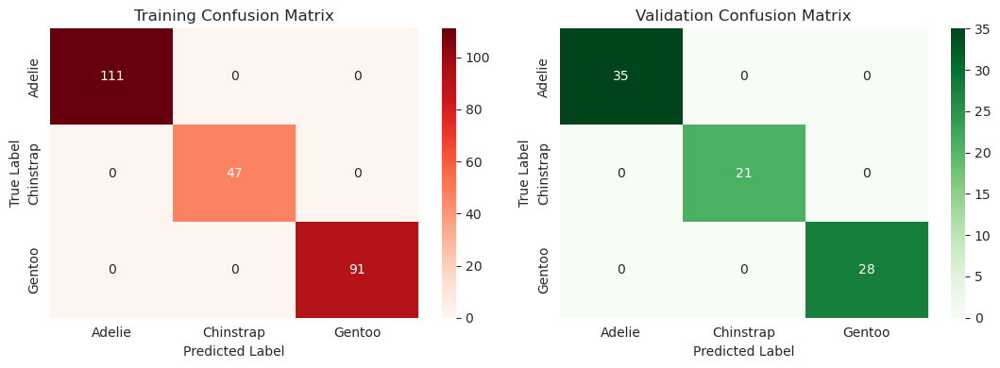






***************************************************************************
mlp_raw , 	CV: True 

***************************************************************************
We will evaluate mlp_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9932741820605118
		best params: {'model__alpha': 0.001, 'model__hidden_layer_sizes': 70}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        9

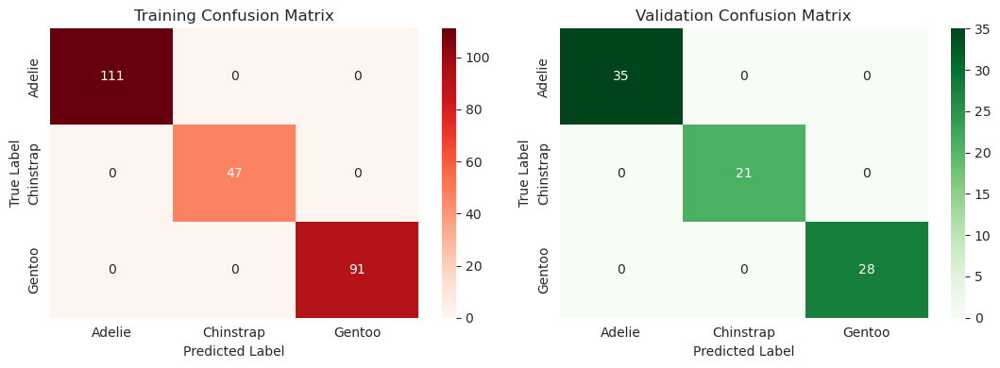



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	bill_length_mm: 0.2690476190476191 +- 0.03883215816738118
	bill_depth_mm: 0.030952380952380953 +- 0.012140522651411413
	flipper_length_mm: 0.01428571428571428 +- 0.008908708063747495
	body_mass_g: 0.011904761904761908 +- 0.01064794274999901
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



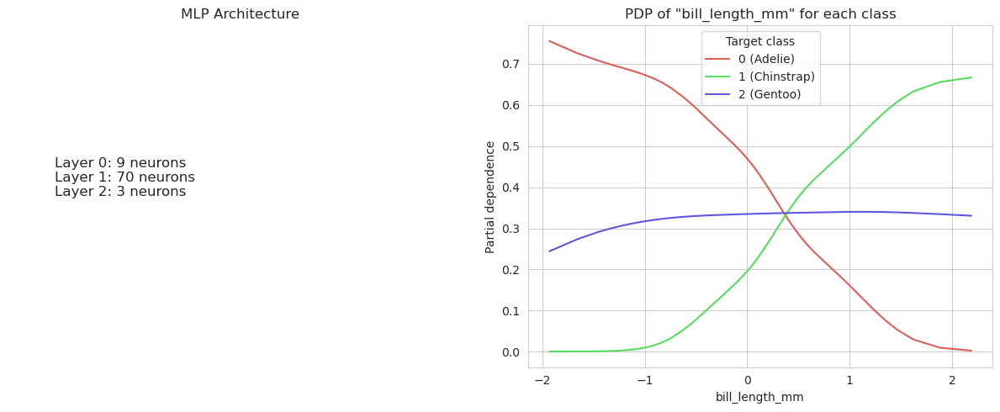

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([ 1.77981251,  1.27083626,  1.36949795,  0.52110457,  0.17299703,
        0.23017666, -0.04170033,  0.18040786,  0.49650473])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([-2.84839264, -0.32905888,  0.09208933,  0.03815413, -0.43221547,
       -0.65328111,  0.06919542, -0.17784534, -0.77897843])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([-0.82838563, -1.72209601, -1.96636811, -0.91306967, -0.02683013,
        0.04038835,  0.0395112 , -0.16627587, -0.41568951])
num_full_subsets = 4
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([-1.08076083, -2.27526089, -1.32806445, -0.35082619,  0.05170603,
        0.04811232, -0.18915942, -0.33360931, -0.24917663])
np.sum(w_aug) = 9.0
np.sum(self.kernelWeights) = 1.0
phi = array([ 0.02372839, -0.68715295, -0.83400807, -0.81143382, -0.48862427,
       -0.97057316,  0.05232376, -0.14657663,  0.20950154])
np.

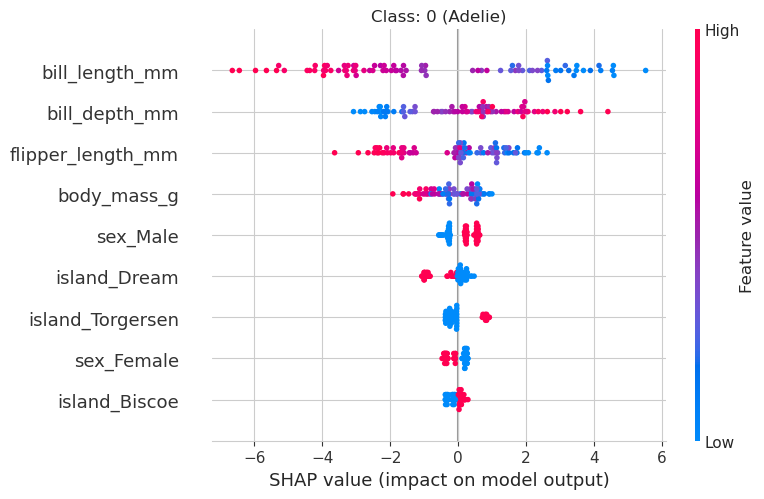

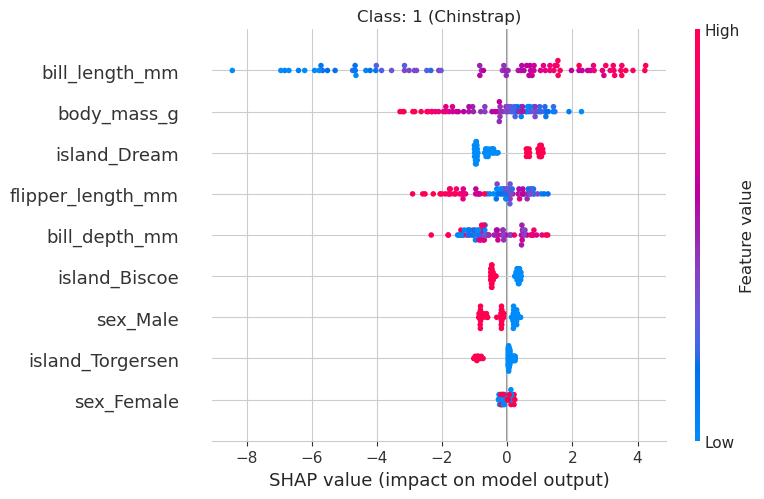

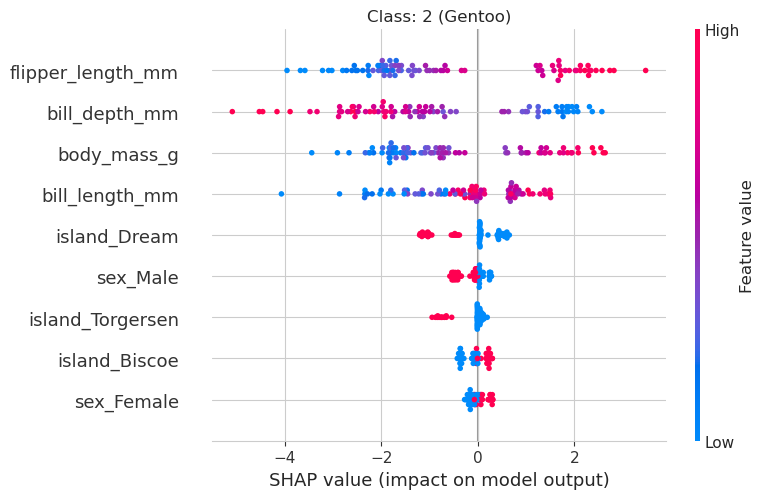




***************************************************************************
mlp_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=mlp_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |  

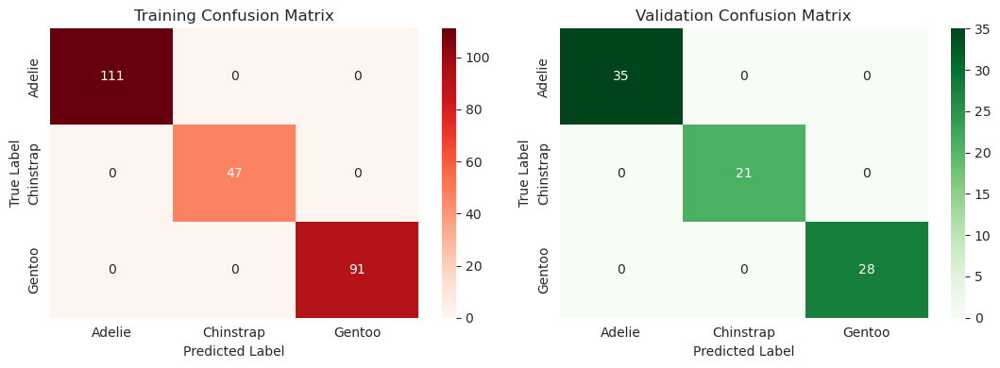






***************************************************************************
mlp_eng , 	CV: True 

***************************************************************************
We will evaluate mlp_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.998313613491092
		best params: {'model__alpha': 0.001, 'model__hidden_layer_sizes': 20, 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |       

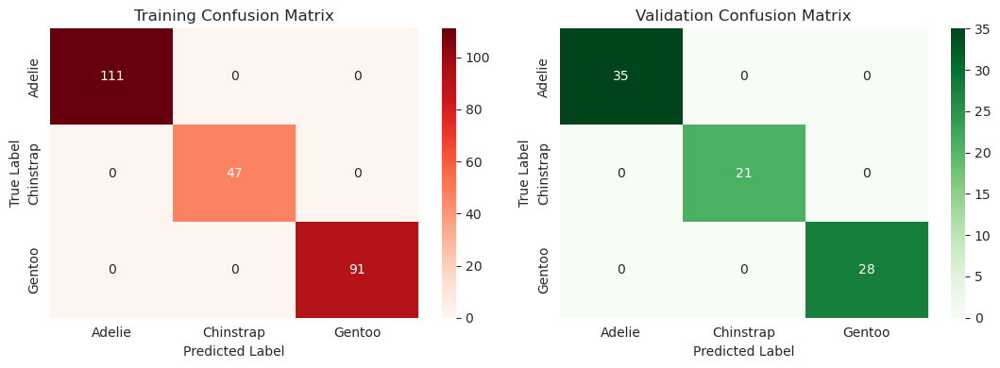



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['bill_elongation', 'feedability_mm2/g', 'island_Torgersen', 'island_Dream', 'island_Biscoe', 'sex_Female', 'sex_Male']
The most important features are:

	bill_elongation: 0.43809523809523815 +- 0.034006802040680253
	feedability_mm2/g: 0.25 +- 0.031043820977155478
	island_Torgersen: 0.02380952380952379 +- 0.010647942749999011
	island_Dream: 0.004761904761904745 +- 0.0058321184351980224
	island_Biscoe: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

****************************************************************************************************



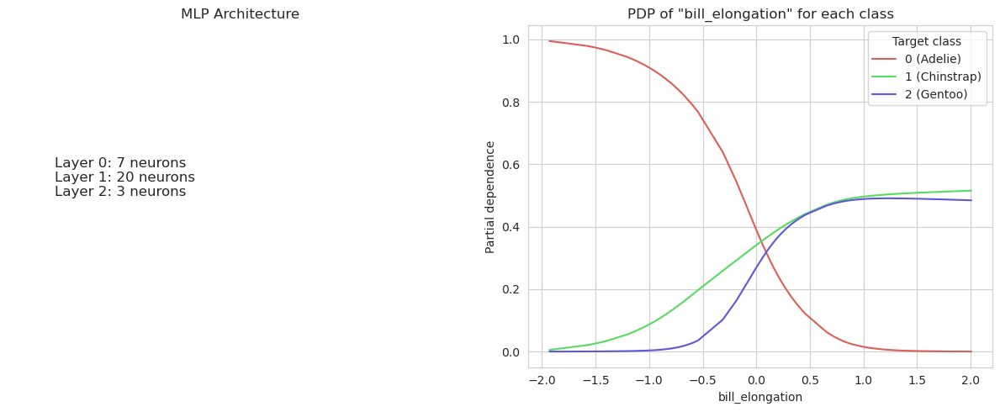

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 3
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([ 2.43811031,  0.79709556,  0.39635535, -0.09072555, -0.12988402,
       -0.07470289,  0.13904803])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([-1.04373163, -1.03760394, -0.88700194,  0.05978936,  0.15623749,
        0.02756391, -0.27659202])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([-3.00075157, -0.49793642,  0.05525743,  0.09385532,  0.0844758 ,
        0.11536677, -0.05649725])
num_full_subsets = 3
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([-5.59008996, -0.05377014,  0.04692608, -0.08978376, -0.96193565,
       -0.21203421,  0.11458314])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999999999999
phi = array([ 0.70017725, -4.00723251, -1.16772297, -0.0779435 ,  0.0839923 ,
       -0.06303221,  0.19869864])
np.sum(w_aug) = 7.0
np.sum(self.kernelWeights) = 0.9999999

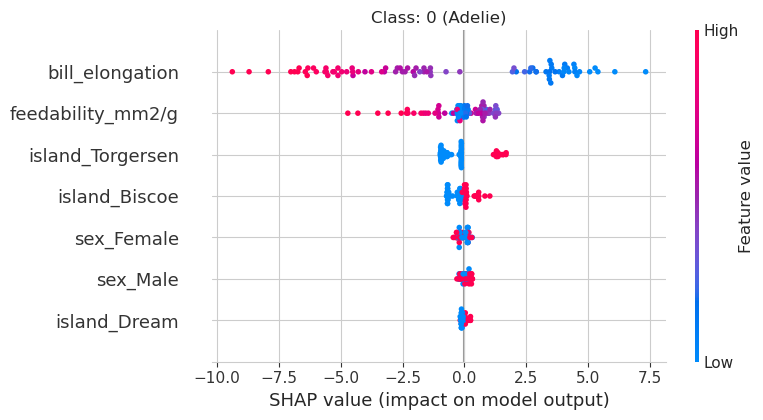

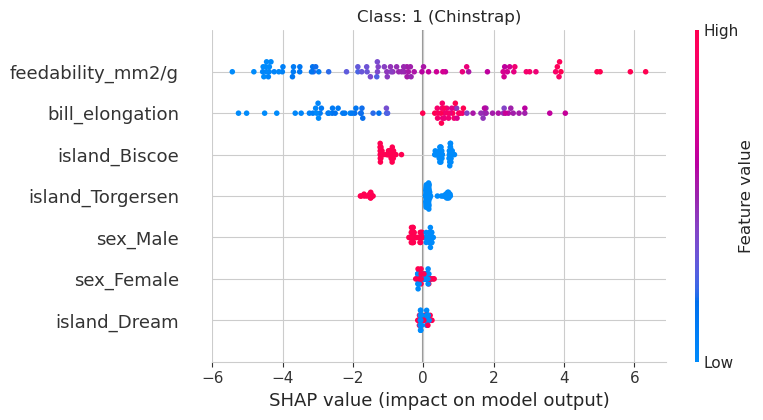

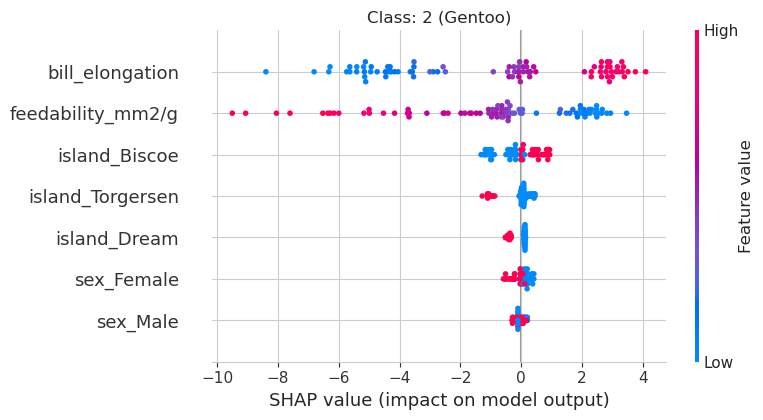




***************************************************************************
mlp_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=mlp_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       111 |
| 1            |           1 |        1 |          1 |        47 |
| 2            |           1 |        1 |          1 |        91 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |

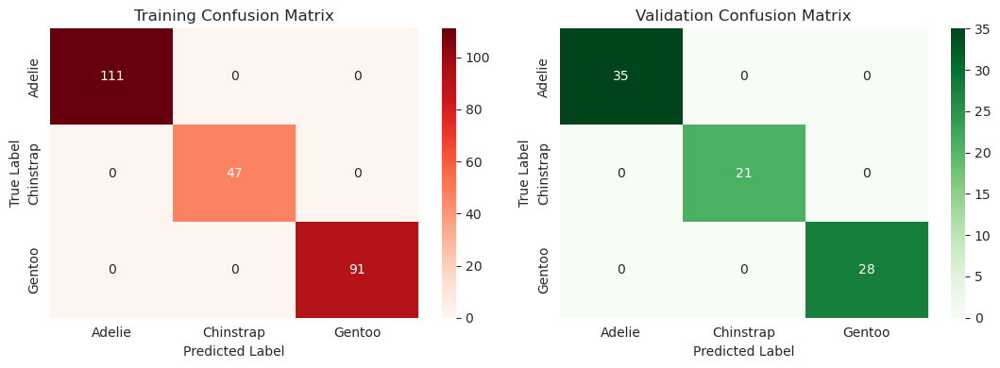






***************************************************************************
mlp_clus , 	CV: True 

***************************************************************************
We will evaluate mlp_clus with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9933927411120393
		best params: {'model__alpha': 0.001, 'model__hidden_layer_sizes': 40, 'preprocessor__cluster__n_clusters': 6, 'preprocessor__selector__n_features': 2}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.991071 | 1        |   0.995516 | 111        |
| 1            |    1        | 0.978723 |   

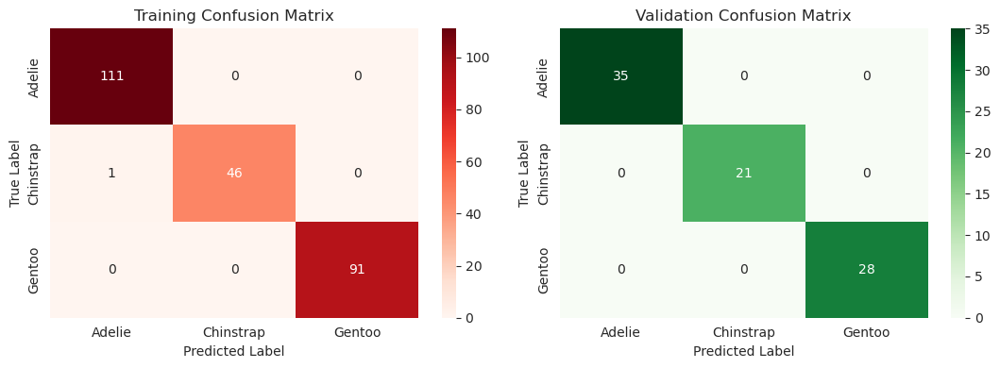



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca1', 'cluster_5', 'cluster_3', 'cluster_2', 'cluster_1', 'cluster_0', 'cluster_4', 'island_Biscoe', 'island_Dream', 'island_Torgersen', 'sex_Female', 'sex_Male']
The most important features are:

	pca0: 0.2761904761904762 +- 0.033162829231390765
	pca1: 0.15238095238095234 +- 0.03642156795423416
	cluster_5: 0.011904761904761862 +- 0.0
	cluster_3: 0.00952380952380949 +- 0.004761904761904745
	cluster_2: 0.0071428571428571175 +- 0.0058321184351980224
	cluster_1: 0.0023809523809523725 +- 0.004761904761904744
	cluster_0: 0.0 +- 0.0
	cluster_4: 0.0 +- 0.0
	island_Biscoe: 0.0 +- 0.0
	island_Dream: 0.0 +- 0.0
	island_Torgersen: 0.0 +- 0.0
	sex_Female: 0.0 +- 0.0
	sex_Male: 0.0 +- 0.0

***************************************************************************************

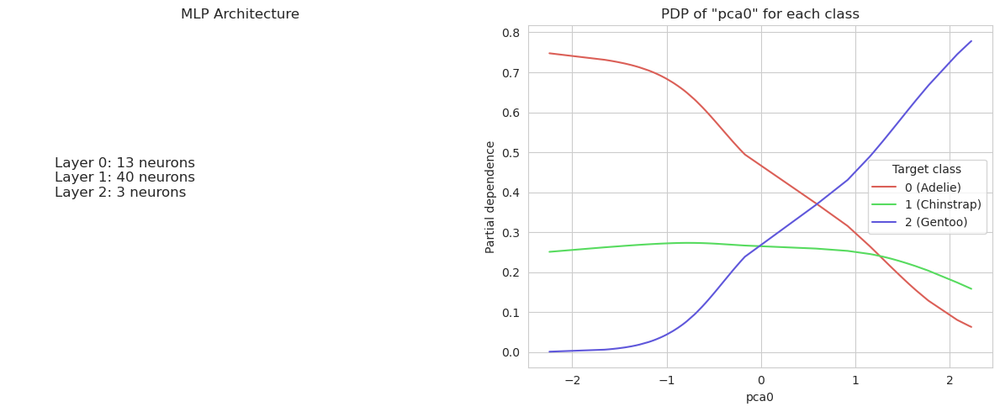

  0%|          | 0/84 [00:00<?, ?it/s]

num_full_subsets = 3
remaining_weight_vector = array([0.3626943 , 0.32642487, 0.31088083])
num_paired_subset_sizes = 6
weight_left = 0.32084025993652715
np.sum(w_aug) = 12.999999999999996
np.sum(self.kernelWeights) = 1.0
phi = array([ 0.10218734,  0.1920247 ,  0.84567355,  0.20373807,  0.        ,
       -0.06597597,  2.15935039,  1.12180879,  0.16489479,  0.        ,
       -0.04208249,  0.        ,  0.23154485])
np.sum(w_aug) = 12.999999999999996
np.sum(self.kernelWeights) = 1.0
phi = array([ 0.        , -0.51347195, -0.99820979,  0.        ,  0.        ,
        0.08259159,  0.33451896, -2.19590784, -0.55887188, -0.19470566,
        0.08301954,  0.1503301 , -0.47209662])
np.sum(w_aug) = 12.999999999999996
np.sum(self.kernelWeights) = 1.0
phi = array([-0.15663302, -0.04454372, -0.85037994, -0.31175923,  0.        ,
        0.07598565, -2.71045455, -0.64812681,  0.        ,  0.14881875,
        0.        , -0.0781177 , -0.12730868])
num_full_subsets = 3
remaining_weight_vector = array

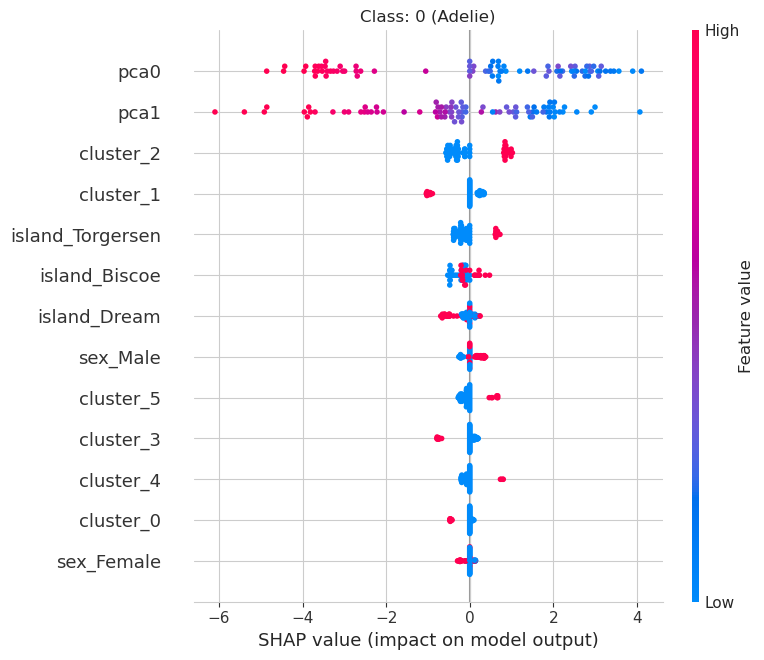

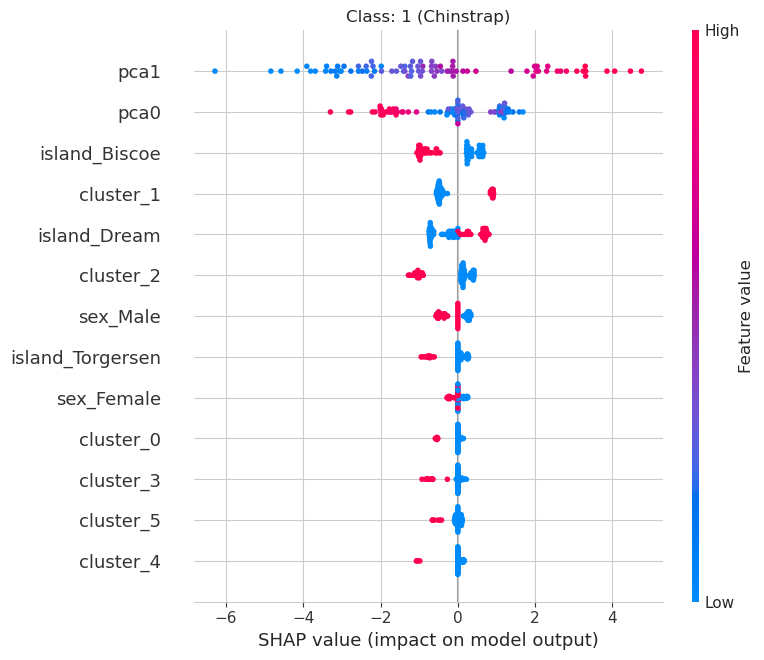

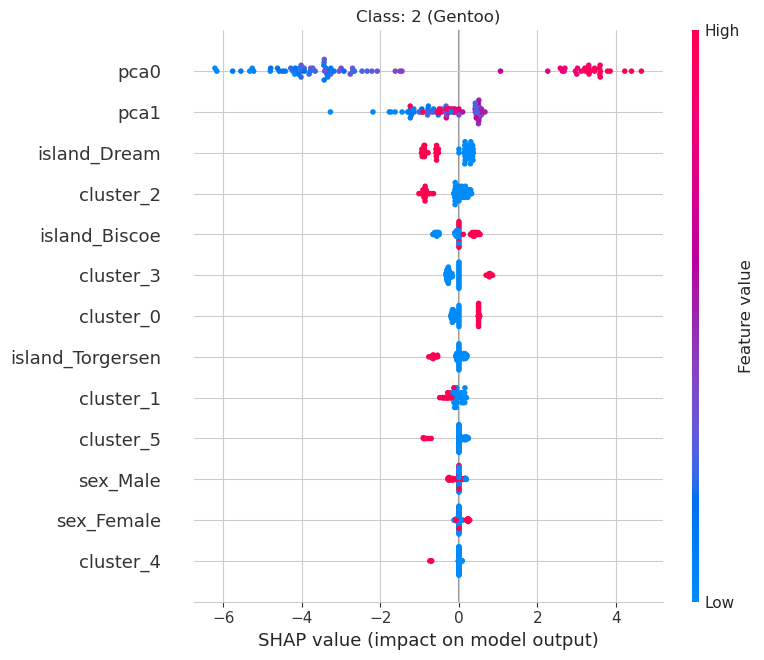

In [164]:
for pp in ['raw', 'eng', 'clus']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [165]:
scorecard

,rfc_base_no_cv,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,dtc_clus_no_cv,dtc_clus_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,...,gnb_eng_no_cv,gnb_eng_cv,gnb_clus_no_cv,gnb_clus_cv,mlp_raw_no_cv,mlp_raw_cv,mlp_eng_no_cv,mlp_eng_cv,mlp_clus_no_cv,mlp_clus_cv
Precision Train,1.000000,1.000000,0.994100,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.833333,0.997024,0.836957,0.989905,1.0,1.0,1.0,1.0,1.0,0.997024
Precision Validation,0.984848,0.959520,0.916381,0.984848,0.973354,0.971014,1.000000,0.984848,0.984848,1.0,...,0.892473,1.000000,0.892473,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000
Recall Train,1.000000,1.000000,0.985816,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.861862,0.992908,0.864865,0.989905,1.0,1.0,1.0,1.0,1.0,0.992908
Recall Validation,0.990476,0.971429,0.907937,0.990476,0.980952,0.980952,1.000000,0.990476,0.990476,1.0,...,0.904762,1.000000,0.904762,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000
Accuracy Train,1.000000,1.000000,0.991968,1.000000,1.000000,1.000000,0.991968,1.000000,0.991968,1.0,...,0.815261,0.995984,0.819277,0.991968,1.0,1.0,1.0,1.0,1.0,0.995984
Accuracy Validation,0.988095,0.964286,0.916667,0.988095,0.976190,0.976190,1.000000,0.988095,0.988095,1.0,...,0.880952,1.000000,0.880952,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000
F1 Train,1.000000,1.000000,0.989777,1.000000,1.000000,1.000000,0.989905,1.000000,0.989905,1.0,...,0.803144,0.994921,0.807341,0.989905,1.0,1.0,1.0,1.0,1.0,0.994921
F1 Validation,0.987417,0.964075,0.911288,0.987417,0.976596,0.975045,1.000000,0.987417,0.987417,1.0,...,0.880342,1.000000,0.880342,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [166]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=2,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector objec...
                                                                      verbose_feature_names_out=False))])),
                                  ('cluster', KMeans

In [168]:
best_cv[model+'_clus']['params']

{'model__alpha': 0.001,
 'model__hidden_layer_sizes': 40,
 'preprocessor__cluster__n_clusters': 6,
 'preprocessor__selector__n_features': 2}

In [169]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('feature_engineer',
                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                  ('selector', FeatureSelector(n_features=2, random_state=0)),
                  ('col_preproc',
                   ColumnTransformer(transformers=[('num',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c192bf50>),
                                                   ('cat',
                                                    Pipel...
                                    ColumnTransformer(remainder='passthrough',
                                                      transformers=[('pca',
                                                                     PCA(random_state=0),
              

In [170]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:2] # the first two steps of the preprocessor: FeatureEngineer & FeatureSelector
print(best_feats.transform(X_train))

        island     sex  bill_elongation  feedability_mm2/g
286     Biscoe  Female         3.093333           0.148085
188      Dream    Male         2.664921           0.273856
70   Torgersen  Female         2.434524           0.185708
173      Dream    Male         2.605263           0.247500
106     Biscoe  Female         2.242938           0.219591
..         ...     ...              ...                ...
203      Dream    Male         2.477387           0.242240
255     Biscoe  Female         3.306569           0.144328
72   Torgersen  Female         2.248447           0.164175
235     Biscoe  Female         3.110345           0.130790
37       Dream  Female         1.945946           0.214839

[249 rows x 4 columns]


In [171]:
best_preproc

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('feature_engineer',
                 FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                ('selector', FeatureSelector(n_features=2, random_state=0)),
                ('col_preproc',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x72b9c192bf50>),
                                                 ('cat',
                                                  Pipel...
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('pca',
                                                                   PCA(random_state=0),
                                                                   slice(0, -5, None))],
                                                    verbose_feature_names_out=False))])),
                ('cluster', KMeansFeature(n_clusters=6)),
                ('post_cluster',
                 Pipeline(steps=[('ohe',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('ohe',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['cluster'])],
                                                    verbose_feature_names_out=False))]))])

In [172]:
del best_preproc, best_feats

## 8. Exporting Best Model

In [173]:
import pickle

We begin by selecting only those models with CV, and focusing only on the validation scores:

In [247]:
best_scores = scorecard.loc[[idx for idx in scorecard.index if 'Val' in idx], [col for col in scorecard.columns if '_no_cv' not in col]]
best_scores.head()

,dtc_raw_cv,dtc_eng_cv,dtc_clus_cv,rfc_raw_cv,rfc_eng_cv,rfc_clus_cv,xgbc_raw_cv,xgbc_eng_cv,xgbc_clus_cv,logreg_raw_cv,...,svc_clus_cv,knn_raw_cv,knn_eng_cv,knn_clus_cv,gnb_raw_cv,gnb_eng_cv,gnb_clus_cv,mlp_raw_cv,mlp_eng_cv,mlp_clus_cv
Precision Validation,0.916381,0.973354,1.0,0.984848,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,0.990741,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Recall Validation,0.907937,0.980952,1.0,0.990476,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,0.984127,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Accuracy Validation,0.916667,0.976190,1.0,0.988095,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,0.988095,1.0,1.0,1.0,1.0,1.0,1.0,1.0
F1 Validation,0.911288,0.976596,1.0,0.987417,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,0.987175,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [248]:
best_scores_T = best_scores.transpose()
best_scores_T

,Precision Validation,Recall Validation,Accuracy Validation,F1 Validation
dtc_raw_cv,0.916381,0.907937,0.916667,0.911288
dtc_eng_cv,0.973354,0.980952,0.976190,0.976596
dtc_clus_cv,1.000000,1.000000,1.000000,1.000000
rfc_raw_cv,0.984848,0.990476,0.988095,0.987417
rfc_eng_cv,1.000000,1.000000,1.000000,1.000000
rfc_clus_cv,1.000000,1.000000,1.000000,1.000000
xgbc_raw_cv,1.000000,1.000000,1.000000,1.000000
xgbc_eng_cv,1.000000,1.000000,1.000000,1.000000
xgbc_clus_cv,1.000000,1.000000,1.000000,1.000000
logreg_raw_cv,1.000000,1.000000,1.000000,1.000000


Let us select the models that performed the best in F1 validation:

In [249]:
# best_models = list(best_scores_T[best_scores_T['F1 Validation'] == best_scores_T['F1 Validation'].max()].index)

best_models = list(best_scores_T[best_scores_T['F1 Validation'] >= 0.99].index)

print(best_models)

['dtc_clus_cv', 'rfc_eng_cv', 'rfc_clus_cv', 'xgbc_raw_cv', 'xgbc_eng_cv', 'xgbc_clus_cv', 'logreg_raw_cv', 'logreg_clus_cv', 'svc_raw_cv', 'svc_eng_cv', 'svc_clus_cv', 'knn_raw_cv', 'knn_clus_cv', 'gnb_raw_cv', 'gnb_eng_cv', 'gnb_clus_cv', 'mlp_raw_cv', 'mlp_eng_cv', 'mlp_clus_cv']


Which one to pick? Well, let's look at their mean CV test scores, and their standard deviations:

In [250]:
stds = {}
for model_name in best_models:
    model_name = model_name.removesuffix('_cv')
    print(model_name)
    idx_largest_score = search[model_name].cv_results_['mean_test_score'].argmax()
    print("found best score?", search[model_name].cv_results_['mean_test_score'][idx_largest_score] == best_cv[model_name]['score'])
    print("best score:", best_cv[model_name]['score'], "+-", search[model_name].cv_results_['std_test_score'][idx_largest_score], "\n")

    stds[model_name] = search[model_name].cv_results_['std_test_score'][idx_largest_score]

dtc_clus
found best score? True
best score: 0.9808523826803731 +- 0.022527194787972656 

rfc_eng
found best score? True
best score: 0.9947345487902763 +- 0.01053988806100693 

rfc_clus
found best score? True
best score: 0.9880579088700624 +- 0.012781717945231783 

xgbc_raw
found best score? True
best score: 0.9773655007935337 +- 0.01886006473146063 

xgbc_eng
found best score? True
best score: 0.9828277844056357 +- 0.018084947755175072 

xgbc_clus
found best score? True
best score: 0.9863944910662937 +- 0.01274285535860987 

logreg_raw
found best score? False
best score: 0.9932741820605118 +- nan 

logreg_clus
found best score? False
best score: 0.9967195767195768 +- nan 

svc_raw
found best score? True
best score: 0.9948491789843459 +- 0.010309550622630186 

svc_eng
found best score? True
best score: 0.998313613491092 +- 0.006309880538011286 

svc_clus
found best score? True
best score: 0.9967195767195768 +- 0.01227421999894096 

knn_raw
found best score? True
best score: 0.9930563286

Since their best mean CV scores are all within each others standard deviations, they are all functionally equivalent in the CV. Thus, what matters is precisely the standard deviation, which is evidence of their stability. Selecting the models with the smallest standard deviations:

In [251]:
list_overall_best_models = [k+'_cv' for k,v in stds.items() if v == stds[min(stds, key=stds.get)]]

print("models:", list_overall_best_models)
print("scores:", [best_cv[k.removesuffix('_cv')]['score'] for k in list_overall_best_models])
print("stds:", [stds[k.removesuffix('_cv')] for k in list_overall_best_models])

best_scores_T.loc[list_overall_best_models]

models: ['svc_eng_cv', 'knn_clus_cv', 'mlp_eng_cv']
scores: [0.998313613491092, 0.998313613491092, 0.998313613491092]
stds: [0.006309880538011286, 0.006309880538011286, 0.006309880538011286]


,Precision Validation,Recall Validation,Accuracy Validation,F1 Validation
svc_eng_cv,1.0,1.0,1.0,1.0
knn_clus_cv,1.0,1.0,1.0,1.0
mlp_eng_cv,1.0,1.0,1.0,1.0


To save them, we pickle them:

In [252]:
for overall_best_model in list_overall_best_models:
    
    overall_best_model = overall_best_model.removesuffix('_cv')

    model_path = "./models/"+overall_best_model+".pkl"

    with open(model_path, "wb") as f:
        pickle.dump(best_cv[overall_best_model]['pipe'], f)

To load the models, run the cell below:

In [254]:
models_directory = "./models/"

my_best_models = {}

for filename in os.listdir(models_directory):
    model_path = os.path.join(models_directory, filename)

    model = model_path.removesuffix('.pkl').removeprefix('./models/')

    with open(model_path, "rb") as f:
        my_best_models[model] = pickle.load(f)

In [256]:
my_best_models

{'mlp_eng': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('feature_engineer',
                                   FeatureEngineer(func=<function new_features at 0x72b9f85f8c20>)),
                                  ('selector',
                                   FeatureSelector(n_features=2,
                                                   random_state=0)),
                                  ('col_preproc',
                                   ColumnTransformer(transformers=[('num',
                                                                    Pipeline(steps=[('scaler',
                                                                                     StandardScaler())]),
                                                                    <sklearn.compose._column_transformer.make_column_selector object at 0x72b9a4469590>),
                                                                   ('cat',
                                                               